<a href="https://colab.research.google.com/github/ani98622/Time-Series-Forecasting-for-Wine-Sales/blob/main/Time_Series_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- Reading the data as an appropriate Time Series data and plot the data.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
plt.style.use('seaborn-v0_8')
warnings.filterwarnings("ignore")

df_spark = pd.read_csv('Sparkling.csv')


#### Data Exploration
- We have Montly data for rose and sparkling wine

In [ ]:
df_spark.head(1)

,YearMonth,Sparkling
0,1980-01,1686


In [ ]:
df_spark.tail(1)

,YearMonth,Sparkling
186,1995-07,2031


In [ ]:
df_spark.describe()

,Sparkling
count,187.000000
mean,2402.417112
std,1295.111540
min,1070.000000
25%,1605.000000
50%,1874.000000
75%,2549.000000
max,7242.000000


In [ ]:
df_rose = pd.read_csv('Rose.csv')
df_rose.head()

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


In [ ]:
df_rose.describe()

,Rose
count,185.000000
mean,90.394595
std,39.175344
min,28.000000
25%,63.000000
50%,86.000000
75%,112.000000
max,267.000000


In [ ]:
df_rose.tail()

,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


- Making Timestamp data by setting to index column

In [ ]:
date = pd.date_range(start='1/1/1980', end='8/1/1995', freq='M')
date

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='ME')

In [ ]:
df = pd.DataFrame({'YearMonth':date,
                   'Sparkling':df_spark.Sparkling,
                   'Rose':df_rose.Rose})
df.set_index('YearMonth',inplace=True)

In [ ]:
df.head()

,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-31 to 1995-07-31
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Sparkling  187 non-null    int64  
 1   Rose       185 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 4.4 KB


In [ ]:
df.isnull().sum()

Sparkling    0
Rose         2
dtype: int64

Text(0, 0.5, 'Units Sold')

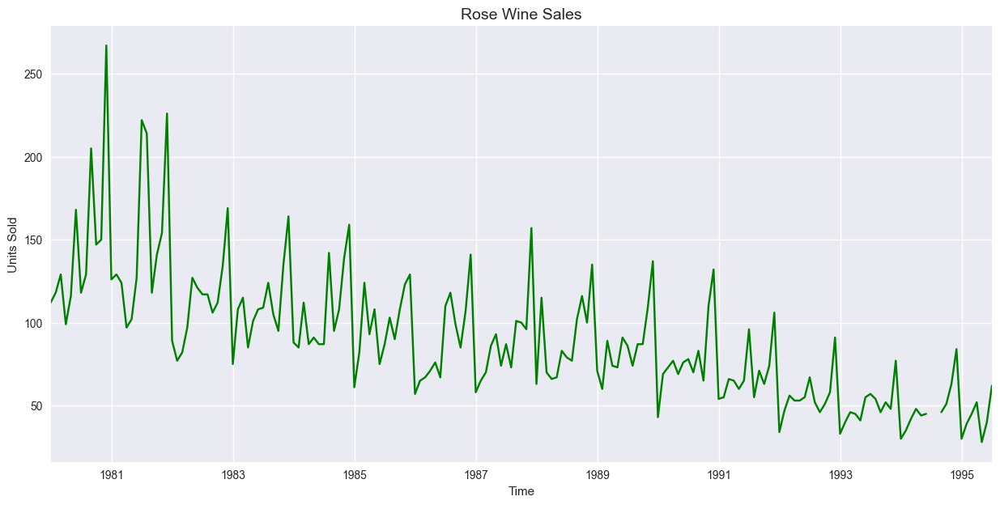

In [ ]:
plt.figure(figsize = (15, 7))
df.Rose.plot(color='green')
plt.title('Rose Wine Sales', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Units Sold')

Text(0, 0.5, 'Units Sold')

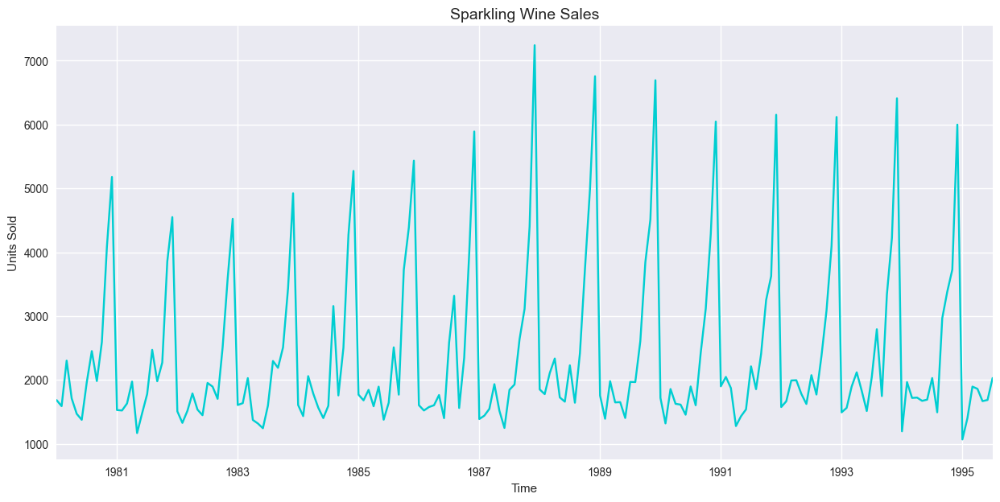

In [ ]:
plt.figure(figsize = (15, 7))
df.Sparkling.plot(color='darkturquoise')
plt.title('Sparkling Wine Sales', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Units Sold')

#### Treating the two missing value present in the rose dataset by Linear Interpolation

In [ ]:
#Treatment of Missing Value
df.converted  = df.Rose
ts = df.converted.resample('D').mean()
df.Rose = ts.interpolate(method = 'linear')
df.Rose['1994']

YearMonth
1994-01-31    30.000000
1994-02-28    35.000000
1994-03-31    42.000000
1994-04-30    48.000000
1994-05-31    44.000000
1994-06-30    45.000000
1994-07-31    45.336957
1994-08-31    45.673913
1994-09-30    46.000000
1994-10-31    51.000000
1994-11-30    63.000000
1994-12-31    84.000000
Name: Rose, dtype: float64

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] =  15,7

Text(0, 0.5, 'Units Sold')

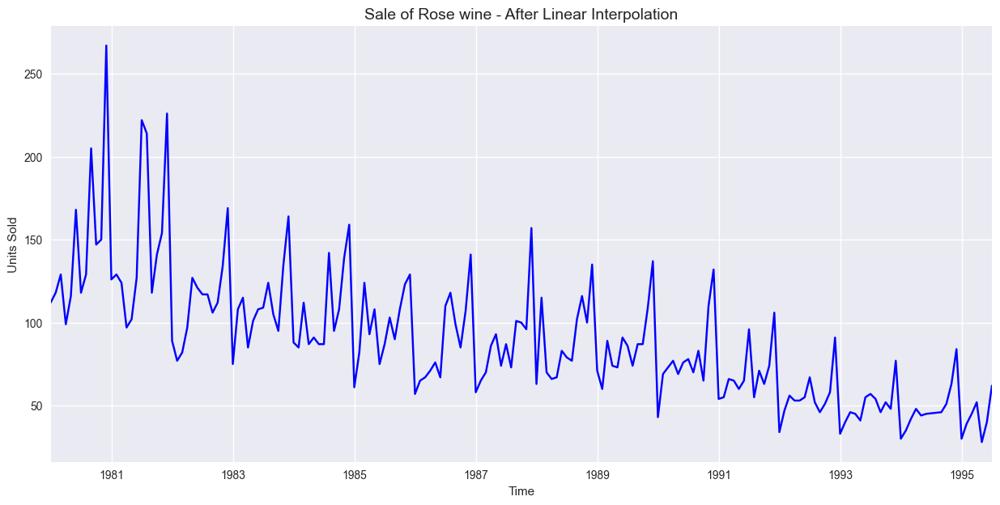

In [ ]:
plt.figure(figsize = (15, 7))
df.Rose.plot(color='blue')
plt.title('Sale of Rose wine - After Linear Interpolation', fontsize =14)
plt.xlabel('Time')
plt.ylabel('Units Sold')

#### Exploratory Data Analysis to understand the data and also perform decomposition.
- An **empirical cumulative distribution function** is called the Empirical Distribution Function, or EDF or ECDF in short.
- It is calculated by ordering all of the unique observations in the data sample and calculating the cumulative probability for each as the number of observations less than or equal to a given observation divided by the total number of observations.

Text(0, 0.5, 'Distribution')

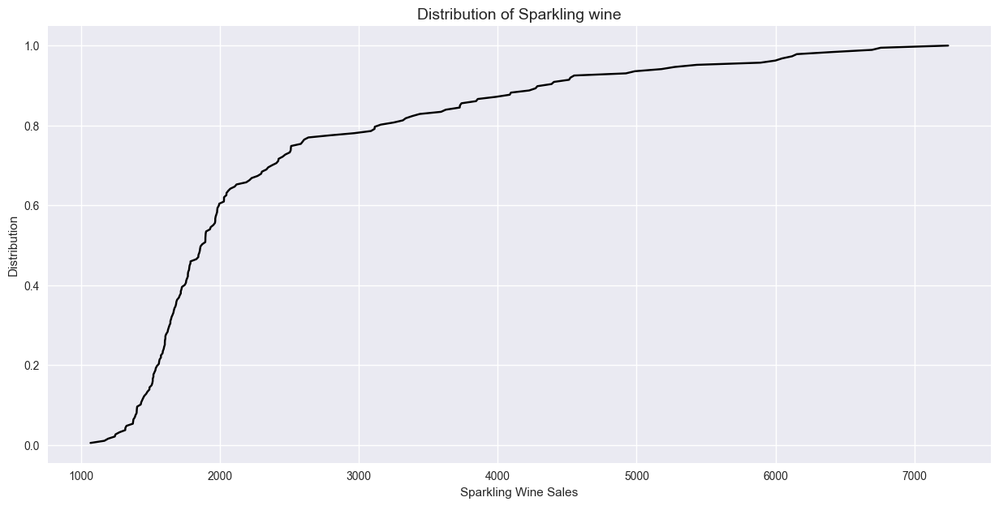

In [ ]:
from statsmodels.distributions.empirical_distribution import ECDF

plt.figure(figsize = (15, 7))
cdf = ECDF(df['Sparkling'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'BLACK')
plt.title('Distribution of Sparkling wine', fontsize=14)
plt.xlabel('Sparkling Wine Sales')
plt.ylabel('Distribution')

Text(0, 0.5, 'Distribution')

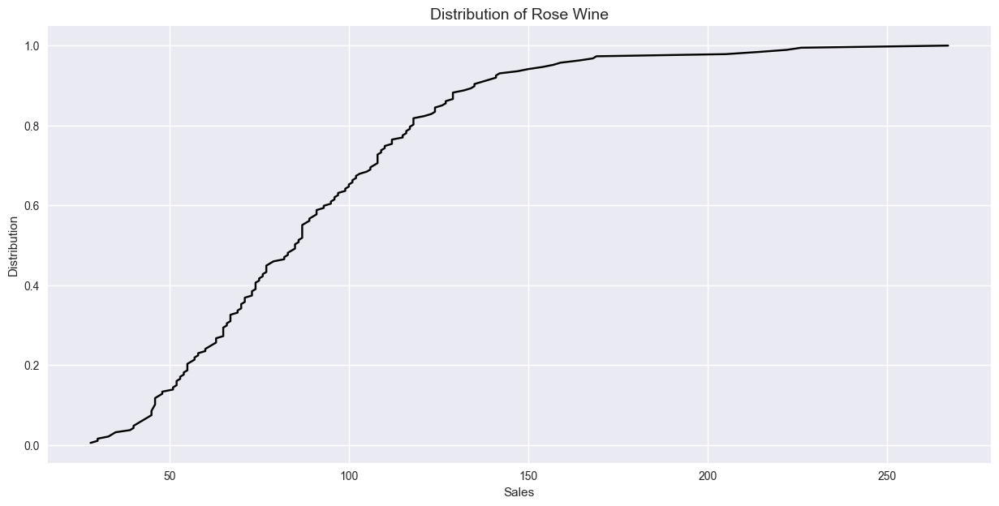

In [ ]:
plt.figure(figsize = (15, 7))
cdf = ECDF(df['Rose'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'black')
plt.title('Distribution of Rose Wine', fontsize=14)
plt.xlabel('Sales')
plt.ylabel('Distribution')

- Yearly Boxplot - Sparkling Wine

Text(0.5, 1.0, 'Sparkling Yearly Boxplot')

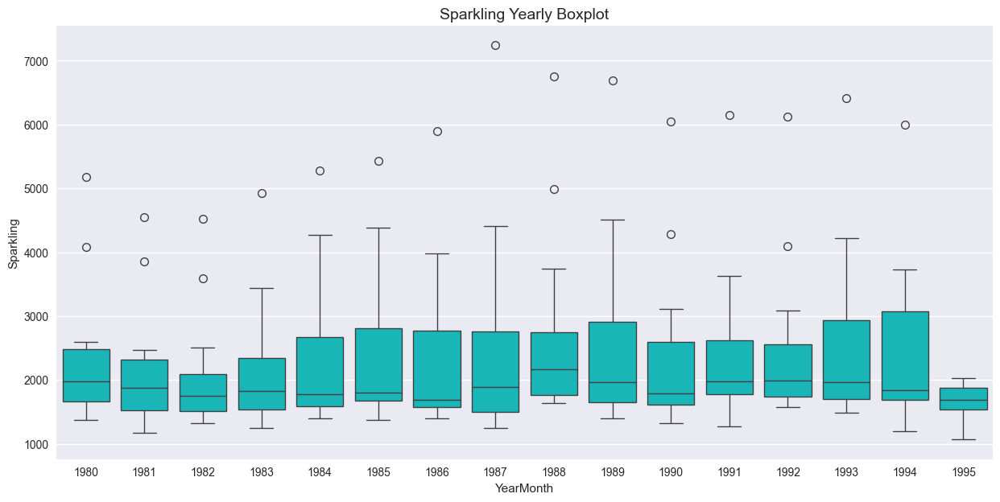

In [ ]:
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.year,y = df['Sparkling'], color = 'darkturquoise')
plt.title('Sparkling Yearly Boxplot', fontsize=14)

- Monthly Plot - Sparkling

Text(0.5, 1.0, 'Sparkling Monthly Boxplot')

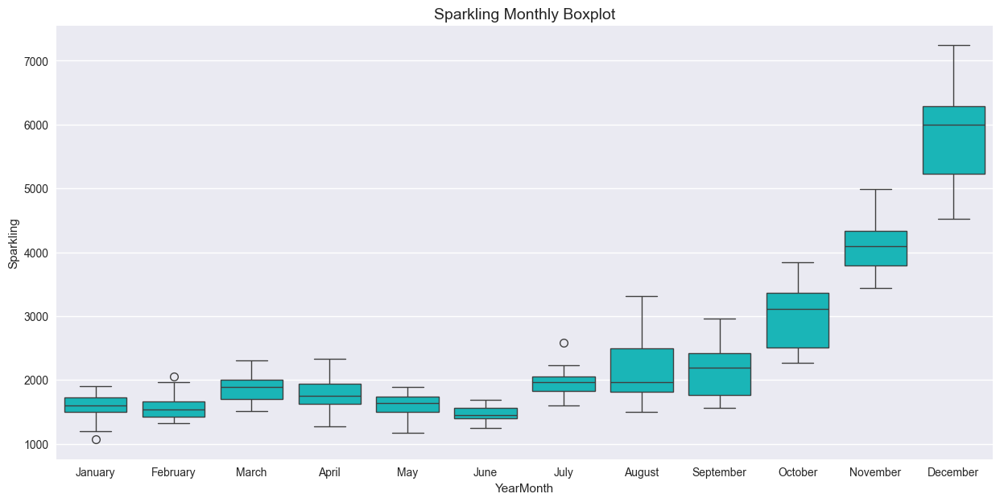

In [ ]:
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.month_name(),y = df['Sparkling'], color = 'darkturquoise')
plt.title('Sparkling Monthly Boxplot', fontsize=14)

- Yearly Boxplot - Rose

Text(0.5, 1.0, 'Rose Yearly Boxplot')

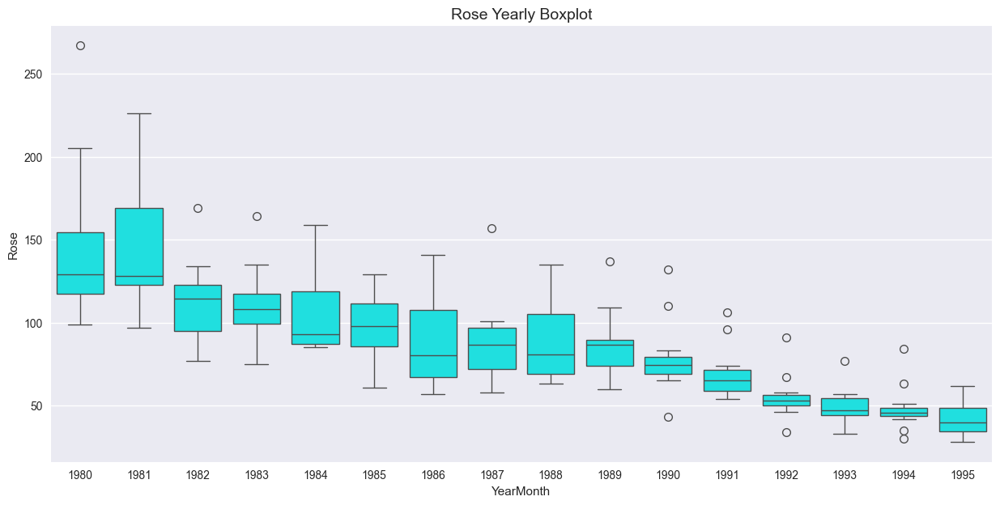

In [ ]:
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.year,y = df['Rose'], color='cyan')
plt.title('Rose Yearly Boxplot', fontsize=14)

- Monthly Plot - Rose

Text(0.5, 1.0, 'Rose Monthly Boxplot')

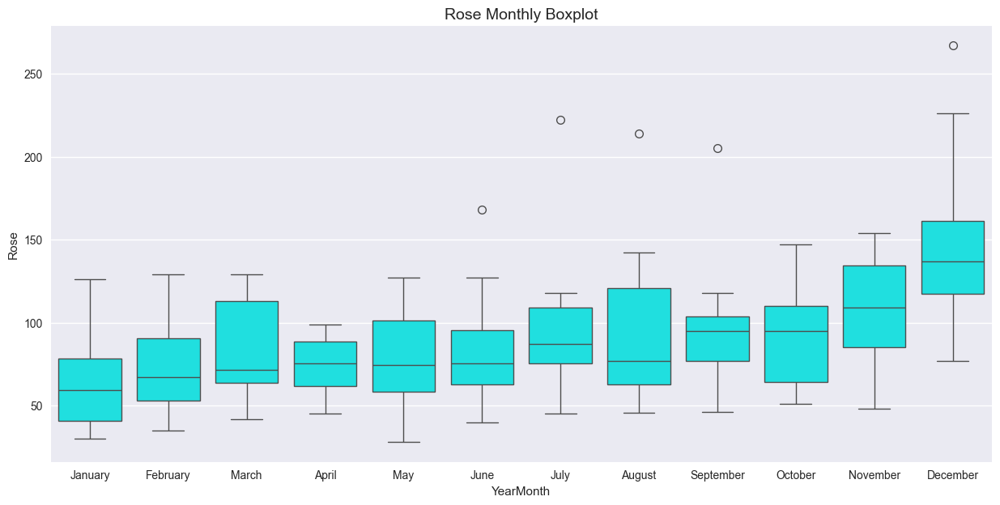

In [ ]:
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.month_name(),y = df['Rose'], color='cyan')
plt.title('Rose Monthly Boxplot', fontsize=14)

- Rose Monthly and yearly Plot

Text(0.5, 1.0, 'Sparkling - Monthly plot')

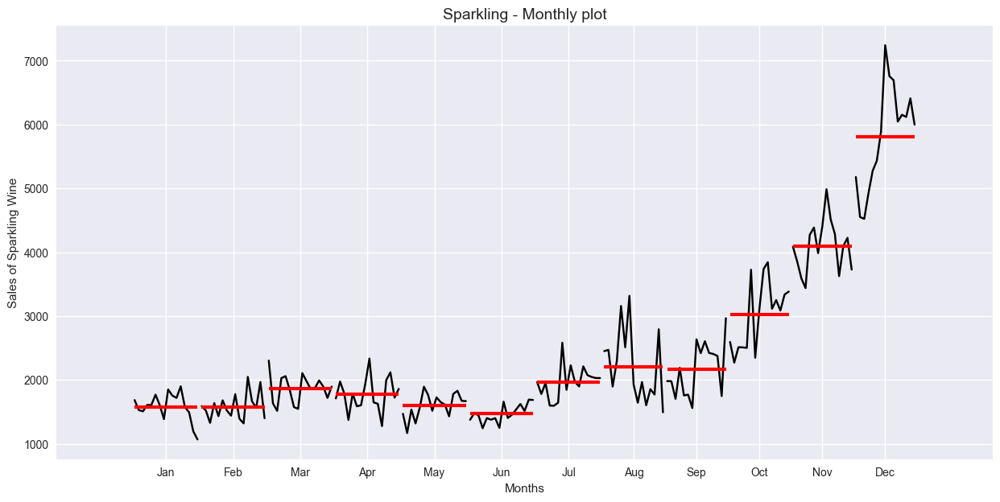

In [ ]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df['Sparkling'],ylabel='Sales of Sparkling Wine')
plt.xlabel('Months')
plt.title('Sparkling - Monthly plot', fontsize = 14)

Text(0.5, 1.0, 'Rose - Monthly plot')

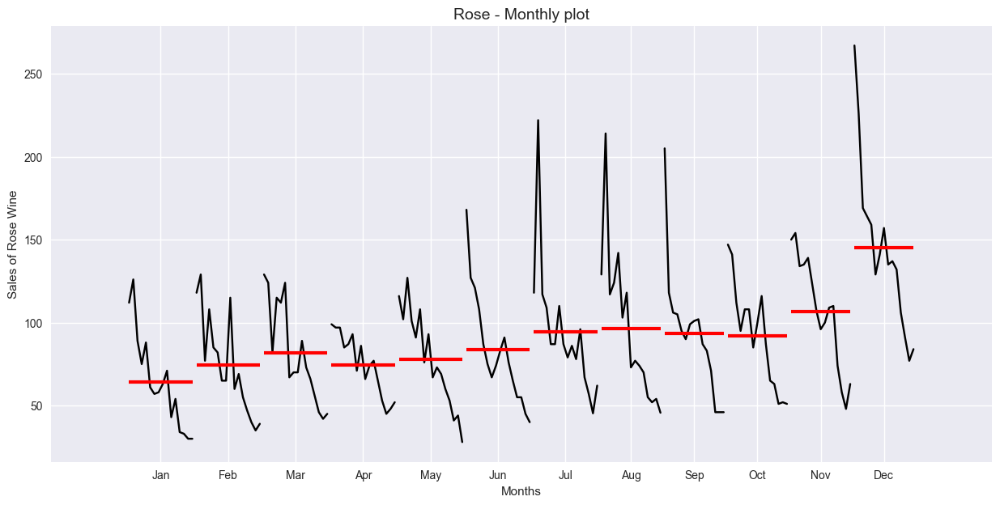

In [ ]:
month_plot(df['Rose'],ylabel='Sales of Rose Wine')
plt.xlabel('Months')
plt.title('Rose - Monthly plot', fontsize=14)

#### Monthly sales across years of Sparking Wine

In [ ]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Sparkling', columns = df.index.month, index = df.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,1686.0,1591.0,2304.0,1712.0,1471.0,1377.0,1966.0,2453.0,1984.0,2596.0,4087.0,5179.0
1981,1530.0,1523.0,1633.0,1976.0,1170.0,1480.0,1781.0,2472.0,1981.0,2273.0,3857.0,4551.0
1982,1510.0,1329.0,1518.0,1790.0,1537.0,1449.0,1954.0,1897.0,1706.0,2514.0,3593.0,4524.0
1983,1609.0,1638.0,2030.0,1375.0,1320.0,1245.0,1600.0,2298.0,2191.0,2511.0,3440.0,4923.0
1984,1609.0,1435.0,2061.0,1789.0,1567.0,1404.0,1597.0,3159.0,1759.0,2504.0,4273.0,5274.0
1985,1771.0,1682.0,1846.0,1589.0,1896.0,1379.0,1645.0,2512.0,1771.0,3727.0,4388.0,5434.0
1986,1606.0,1523.0,1577.0,1605.0,1765.0,1403.0,2584.0,3318.0,1562.0,2349.0,3987.0,5891.0
1987,1389.0,1442.0,1548.0,1935.0,1518.0,1250.0,1847.0,1930.0,2638.0,3114.0,4405.0,7242.0
1988,1853.0,1779.0,2108.0,2336.0,1728.0,1661.0,2230.0,1645.0,2421.0,3740.0,4988.0,6757.0


Text(0.5, 1.0, 'Monthly sales over years of Sparkling Wine')

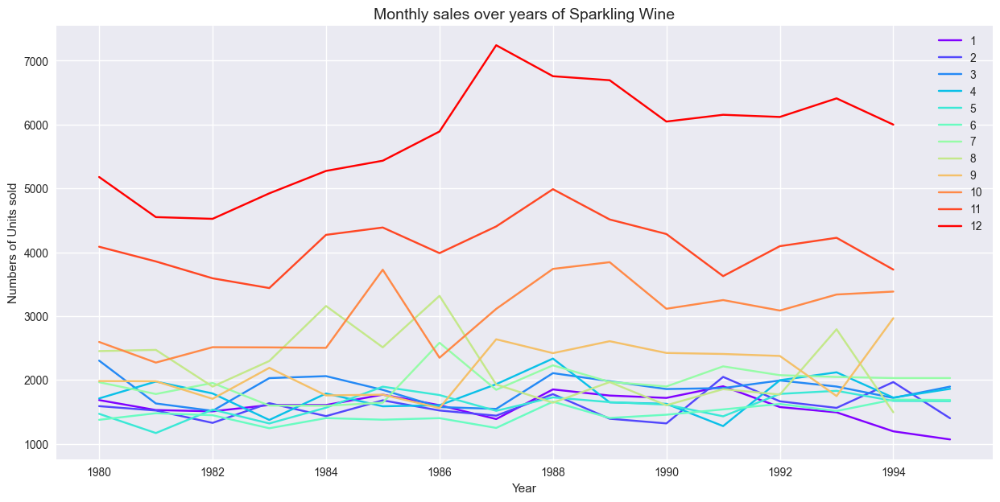

In [ ]:
plt.figure.figsize=(15,8)
monthly_sales_across_years.plot(colormap='rainbow')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Year')
plt.title('Monthly sales over years of Sparkling Wine', fontsize=14)

#### Monthly sales across years of Rose Wine

In [ ]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Rose', columns = df.index.month, index = df.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,112.0,118.0,129.0,99.0,116.0,168.0,118.000000,129.000000,205.0,147.0,150.0,267.0
1981,126.0,129.0,124.0,97.0,102.0,127.0,222.000000,214.000000,118.0,141.0,154.0,226.0
1982,89.0,77.0,82.0,97.0,127.0,121.0,117.000000,117.000000,106.0,112.0,134.0,169.0
1983,75.0,108.0,115.0,85.0,101.0,108.0,109.000000,124.000000,105.0,95.0,135.0,164.0
1984,88.0,85.0,112.0,87.0,91.0,87.0,87.000000,142.000000,95.0,108.0,139.0,159.0
1985,61.0,82.0,124.0,93.0,108.0,75.0,87.000000,103.000000,90.0,108.0,123.0,129.0
1986,57.0,65.0,67.0,71.0,76.0,67.0,110.000000,118.000000,99.0,85.0,107.0,141.0
1987,58.0,65.0,70.0,86.0,93.0,74.0,87.000000,73.000000,101.0,100.0,96.0,157.0
1988,63.0,115.0,70.0,66.0,67.0,83.0,79.000000,77.000000,102.0,116.0,100.0,135.0


Text(0.5, 1.0, 'Monthly sales of Rose Wine over years')

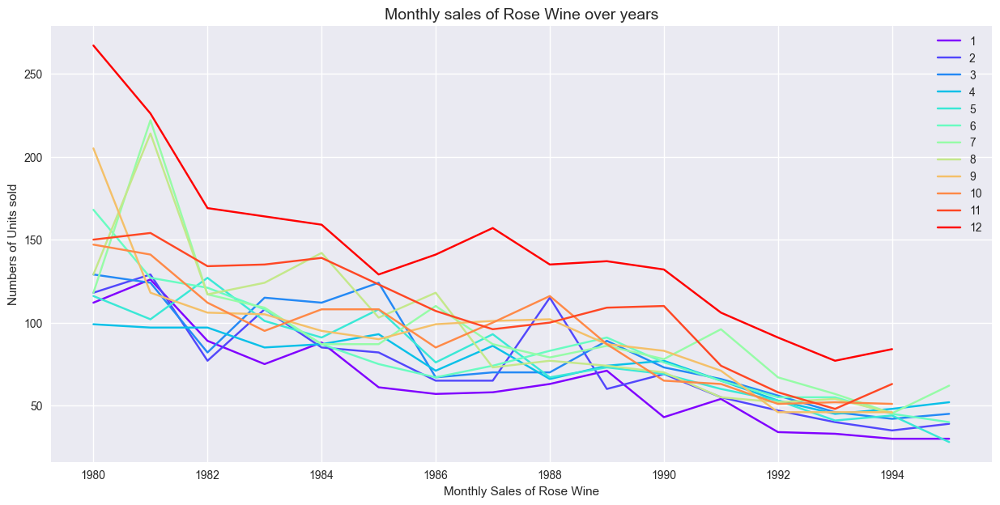

In [ ]:
plt.figure.figsize=(15,8)
monthly_sales_across_years.plot(colormap='rainbow')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Monthly Sales of Rose Wine')
plt.title('Monthly sales of Rose Wine over years', fontsize=14)

#### Average sales per month on month percentage change of sales.

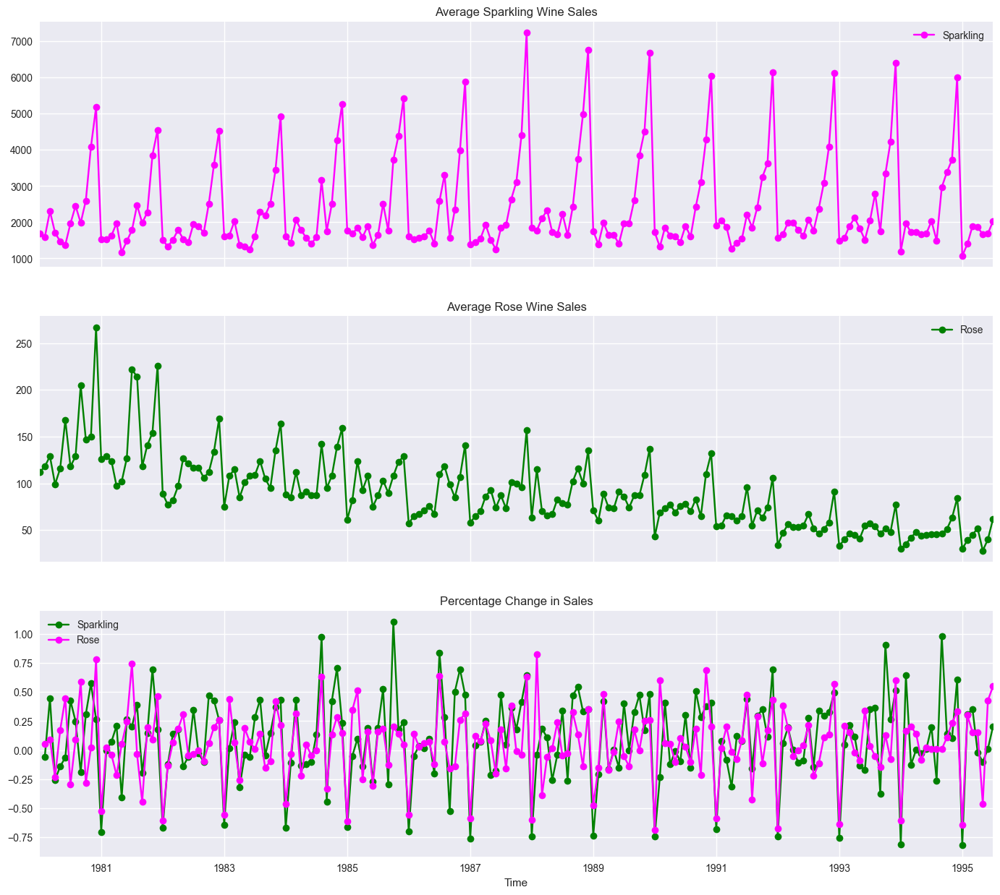

In [ ]:
# group by date and get average Sparkling & Rose sales, and precent change
average_s    = df.groupby(df.index)['Sparkling'].mean()
average_r    = df.groupby(df.index)['Rose'].mean()
pct_change_s = df.groupby(df.index)['Sparkling'].sum().pct_change()
pct_change_r = df.groupby(df.index)['Rose'].sum().pct_change()

fig, (axis1,axis2,axis3) = plt.subplots(3,1,sharex=True,figsize=(17,15))

# plotting average Sparkling sales over time(year-month)
ax1 = average_s.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Wine Sales", color = 'magenta')
ax2 = average_r.plot(legend=True,ax=axis2,marker='o',title="Average Rose Wine Sales", color = 'green')
# plotting precent change for Sales over time(year-month)
ax3 = pct_change_s.plot(legend=True,ax=axis3,marker='o',color='green',title="Percentage Change in Sales")
ax3 = pct_change_r.plot(legend=True,ax=axis3,marker='o',color='magenta',title="Percentage Change in Sales")
plt.xlabel('Time')
plt.legend(loc='best')


### - Decomposition
##### - Additive Decomposition (Sparkling & Rose)

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

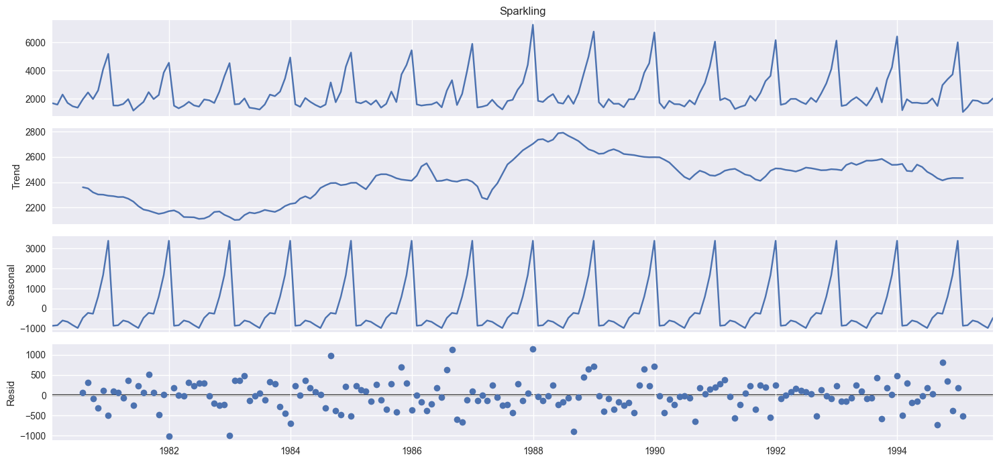

In [ ]:
decomposition = seasonal_decompose(df['Sparkling'], model='additive')
fig = decomposition.plot()
plt.tight_layout()
plt.show()


In [ ]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(10),'\n')
print('Seasonality','\n',seasonality.head(10),'\n')
print('Residual','\n',residual.head(10),'\n')

Trend 
 YearMonth
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-31   -854.260599
1980-02-29   -830.350678
1980-03-31   -592.356630
1980-04-30   -658.490559
1980-05-31   -824.416154
1980-06-30   -967.434011
1980-07-31   -465.502265
1980-08-31   -214.332821
1980-09-30   -254.677265
1980-10-31    599.769957
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31     70.835599
1980-08-31    315.999487
1980-09-30    -81.864401
1980-10-31   -307.353290
Name: resid, dtype: float64 



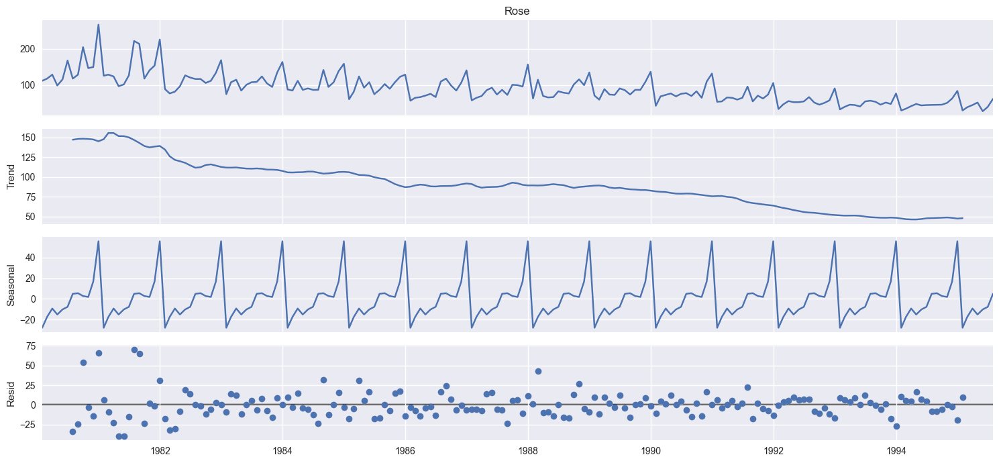

In [ ]:
decomposition = seasonal_decompose(df['Rose'],model='additive')
fig = decomposition.plot()
plt.tight_layout()
plt.show()

In [ ]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(10),'\n')
print('Seasonality','\n',seasonality.head(10),'\n')
print('Residual','\n',residual.head(10),'\n')

Trend 
 YearMonth
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    147.083333
1980-08-31    148.125000
1980-09-30    148.375000
1980-10-31    148.083333
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-31   -27.908708
1980-02-29   -17.435675
1980-03-31    -9.285895
1980-04-30   -15.098395
1980-05-31   -10.196609
1980-06-30    -7.678752
1980-07-31     4.897089
1980-08-31     5.500109
1980-09-30     2.774625
1980-10-31     1.871848
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-31          NaN
1980-02-29          NaN
1980-03-31          NaN
1980-04-30          NaN
1980-05-31          NaN
1980-06-30          NaN
1980-07-31   -33.980423
1980-08-31   -24.625109
1980-09-30    53.850375
1980-10-31    -2.955181
Name: resid, dtype: float64 



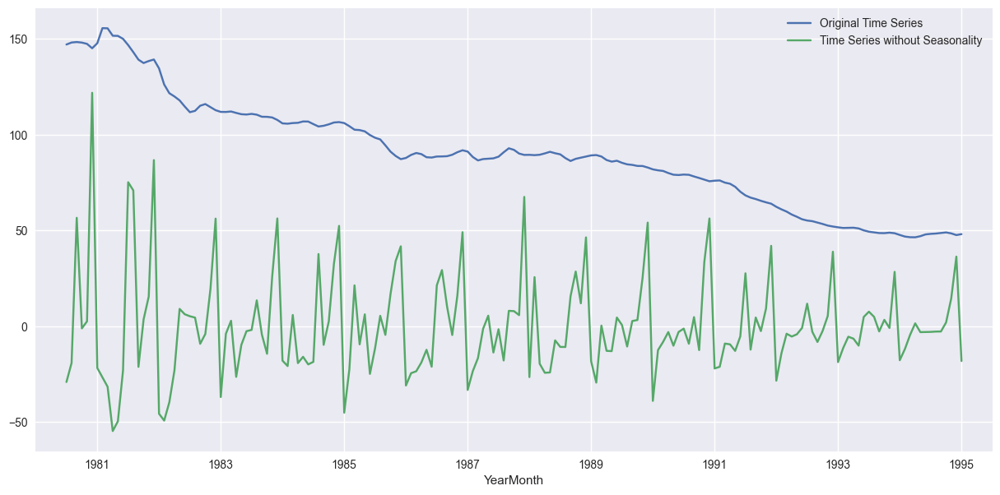

In [ ]:
detrend_ts = seasonality + residual
trend.plot()
detrend_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality"])

#### Multiplicative Decomposition

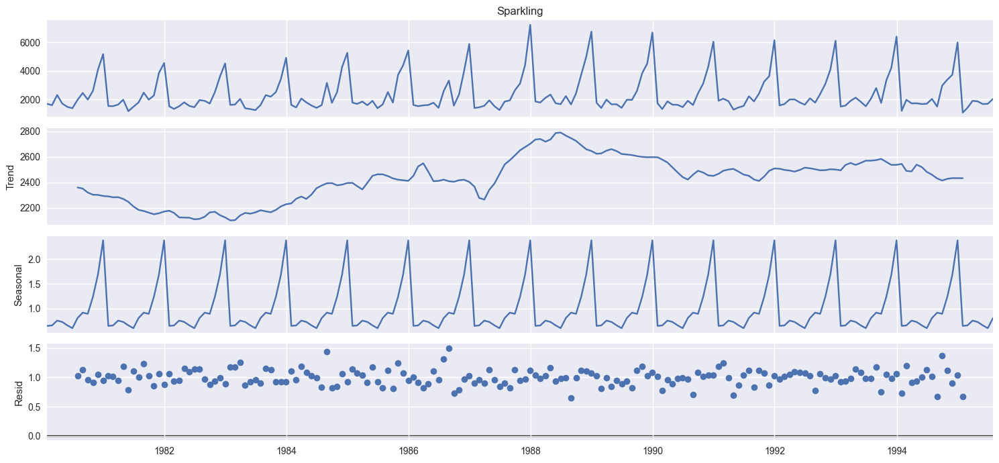

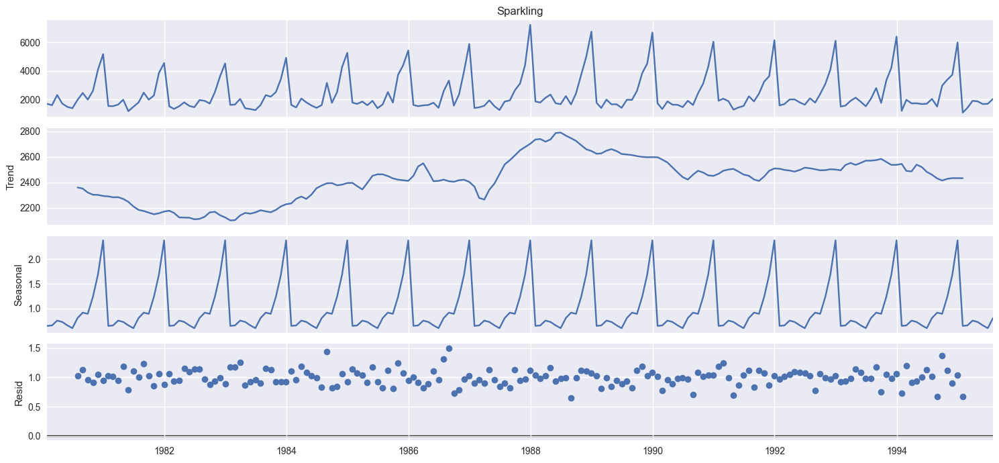

In [ ]:
decomposition = seasonal_decompose(df['Sparkling'],model='multiplicative')
decomposition.plot()

In [ ]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(10),'\n')
print('Seasonality','\n',seasonality.head(10),'\n')
print('Residual','\n',residual.head(10),'\n')

Trend 
 YearMonth
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-31    0.649843
1980-02-29    0.659214
1980-03-31    0.757440
1980-04-30    0.730351
1980-05-31    0.660609
1980-06-30    0.603468
1980-07-31    0.809164
1980-08-31    0.918822
1980-09-30    0.894367
1980-10-31    1.241789
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    1.029230
1980-08-31    1.135407
1980-09-30    0.955954
1980-10-31    0.907513
Name: resid, dtype: float64 



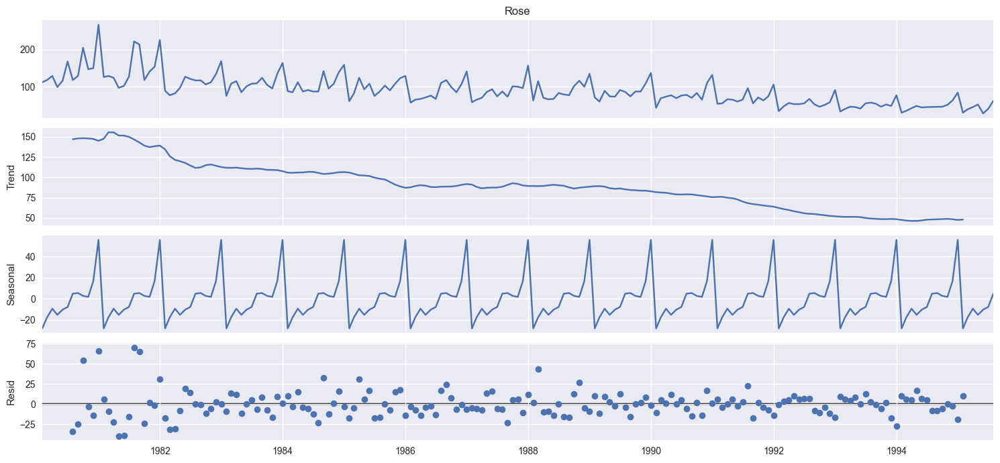

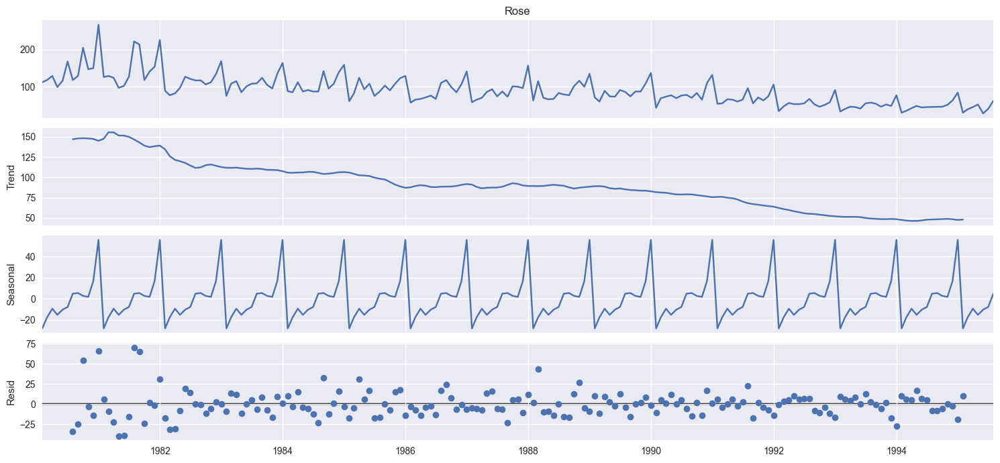

In [ ]:
decomposition = seasonal_decompose(df['Rose'],model='additive')
decomposition.plot()

In [ ]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(10),'\n')
print('Seasonality','\n',seasonality.head(10),'\n')
print('Residual','\n',residual.head(10),'\n')

Trend 
 YearMonth
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    147.083333
1980-08-31    148.125000
1980-09-30    148.375000
1980-10-31    148.083333
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-31   -27.908708
1980-02-29   -17.435675
1980-03-31    -9.285895
1980-04-30   -15.098395
1980-05-31   -10.196609
1980-06-30    -7.678752
1980-07-31     4.897089
1980-08-31     5.500109
1980-09-30     2.774625
1980-10-31     1.871848
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-31          NaN
1980-02-29          NaN
1980-03-31          NaN
1980-04-30          NaN
1980-05-31          NaN
1980-06-30          NaN
1980-07-31   -33.980423
1980-08-31   -24.625109
1980-09-30    53.850375
1980-10-31    -2.955181
Name: resid, dtype: float64 



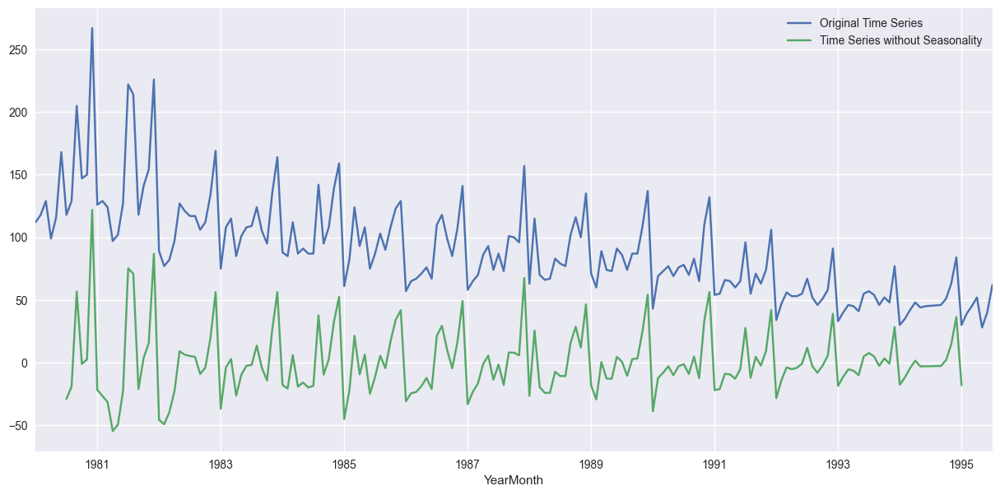

In [ ]:
detrend_ts = seasonality + residual
df.Rose.plot()
detrend_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality"])

#### Multiplicative Decomposition

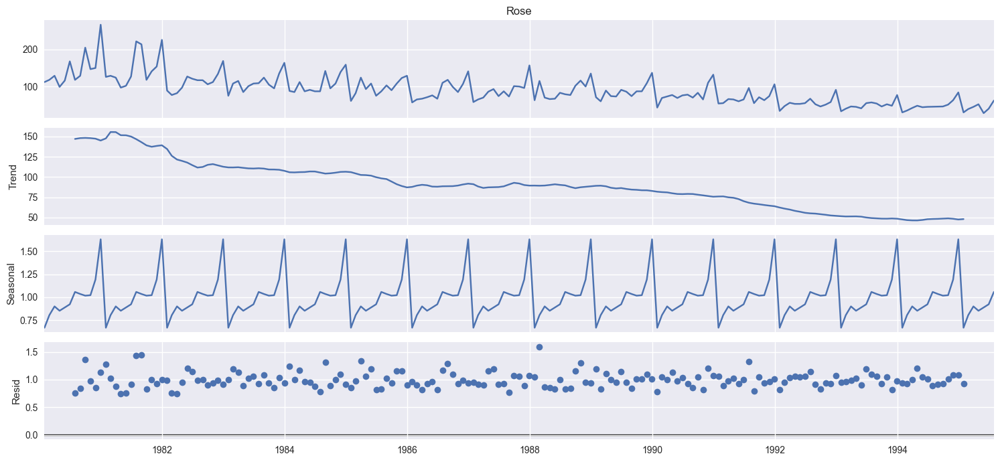

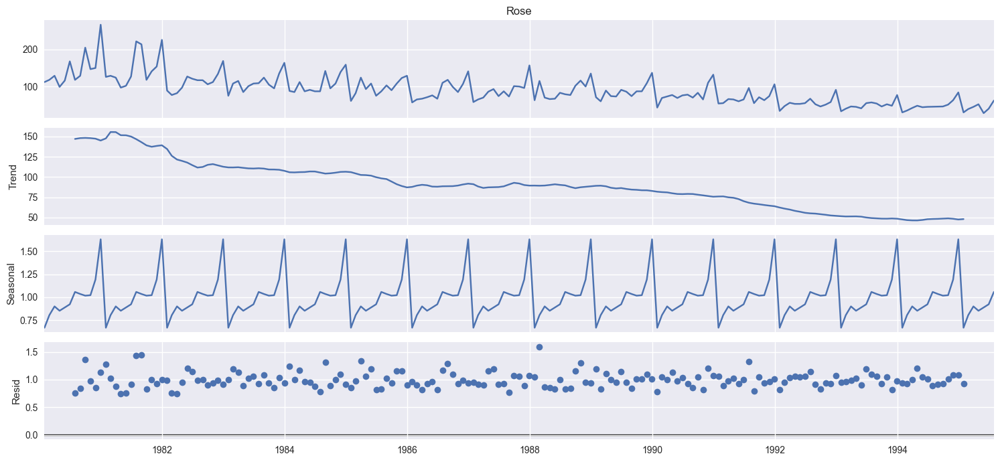

In [ ]:
decomposition = seasonal_decompose(df['Rose'],model='multiplicative')
decomposition.plot()

In [ ]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(10),'\n')
print('Seasonality','\n',seasonality.head(10),'\n')
print('Residual','\n',residual.head(10),'\n')

Trend 
 YearMonth
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    147.083333
1980-08-31    148.125000
1980-09-30    148.375000
1980-10-31    148.083333
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-31    0.670111
1980-02-29    0.806163
1980-03-31    0.901163
1980-04-30    0.854023
1980-05-31    0.889414
1980-06-30    0.923984
1980-07-31    1.058042
1980-08-31    1.035890
1980-09-30    1.017647
1980-10-31    1.022572
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    0.758256
1980-08-31    0.840713
1980-09-30    1.357675
1980-10-31    0.970772
Name: resid, dtype: float64 



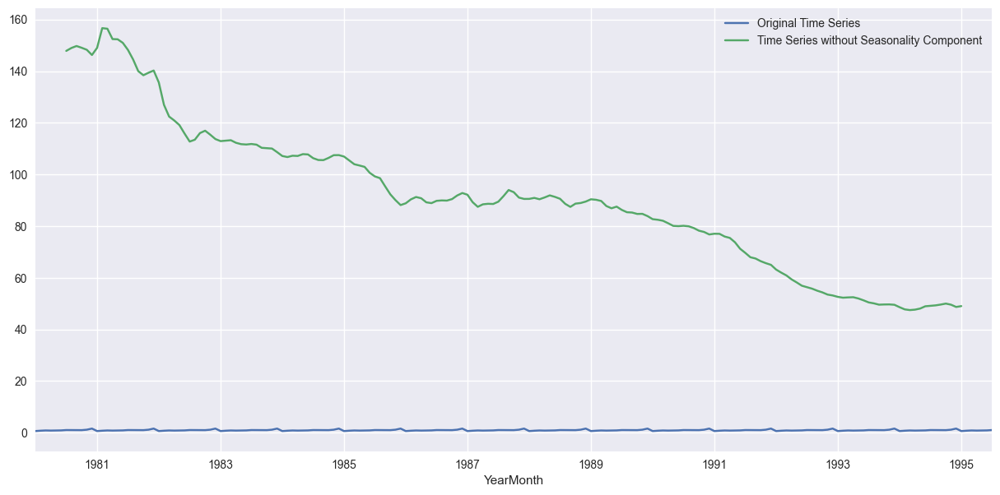

In [ ]:
detrend_ts = trend + residual
seasonality.plot()
detrend_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality Component"])

#### Split the data into training and test

In [ ]:
train=df[df.index.year < 1991]
test=df[df.index.year >= 1991]

In [ ]:
from IPython.display import display
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


Last few rows of Training Data


,Sparkling,Rose
YearMonth,,
1990-08-31,1605,70.0
1990-09-30,2424,83.0
1990-10-31,3116,65.0
1990-11-30,4286,110.0
1990-12-31,6047,132.0


First few rows of Test Data


,Sparkling,Rose
YearMonth,,
1991-01-31,1902,54.0
1991-02-28,2049,55.0
1991-03-31,1874,66.0
1991-04-30,1279,65.0
1991-05-31,1432,60.0


Last few rows of Test Data


,Sparkling,Rose
YearMonth,,
1995-03-31,1897,45.0
1995-04-30,1862,52.0
1995-05-31,1670,28.0
1995-06-30,1688,40.0
1995-07-31,2031,62.0


In [ ]:
print(train.shape)
print(test.shape)

(132, 2)
(55, 2)


In [ ]:
print("Dimensions of the training and test data")
print('Number of rows and columns of the training set :',train.shape)
print('Number of rows and columns of the training set :',test.shape)

Dimensions of the training and test data
Number of rows and columns of the training set : (132, 2)
Number of rows and columns of the training set : (55, 2)


<function matplotlib.pyplot.show(close=None, block=None)>

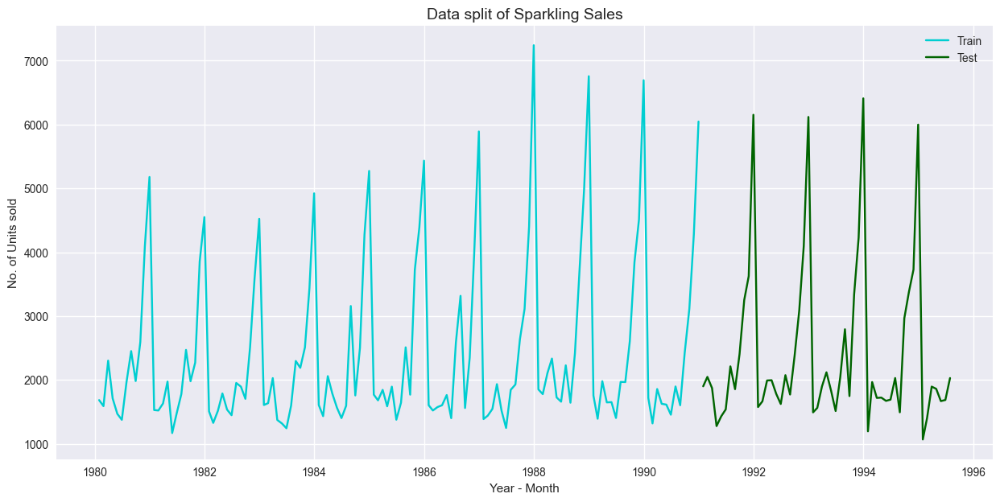

In [ ]:
plt.figure(figsize = (15, 7))
plt.plot(train['Sparkling'], label = 'Train', color='darkturquoise')
plt.plot(test['Sparkling'], label = 'Test', color='darkgreen')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Data split of Sparkling Sales', fontsize = 14)
plt.show

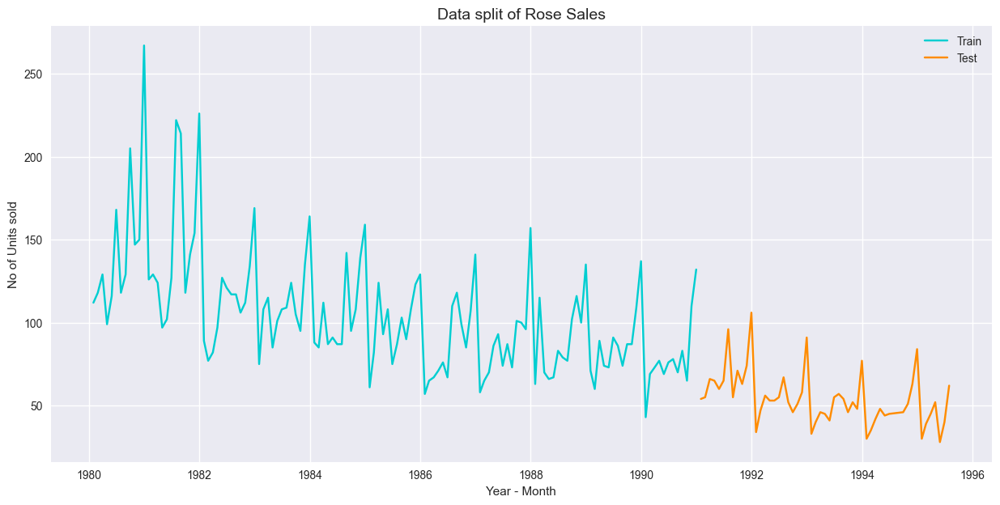

In [ ]:
plt.figure(figsize = (15, 7))
plt.plot(train['Rose'], label = 'Train', color='darkturquoise')
plt.plot(test['Rose'], label = 'Test', color='darkorange')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')
plt.title('Data split of Rose Sales', fontsize = 14)
plt.show

### Model Building and Evaluation

In this section, we will:

1. **Build Exponential Smoothing Models** on the training data.
2. **Evaluate the models** using RMSE on the test data.
3. Build other models including:
   - **Regression Models**
   - **Naïve Forecast Models**
   - **Simple Average Models**
4. **Compare the performance** of all models on the test data using RMSE.


#### Model 1: Linear Regression

In [ ]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+133 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [ ]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [ ]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling   Rose  time
YearMonth                         
1980-01-31       1686  112.0     1
1980-02-29       1591  118.0     2
1980-03-31       2304  129.0     3
1980-04-30       1712   99.0     4
1980-05-31       1471  116.0     5 

Last few rows of Training Data 
             Sparkling   Rose  time
YearMonth                         
1990-08-31       1605   70.0   128
1990-09-30       2424   83.0   129
1990-10-31       3116   65.0   130
1990-11-30       4286  110.0   131
1990-12-31       6047  132.0   132 

First few rows of Test Data 
             Sparkling  Rose  time
YearMonth                        
1991-01-31       1902  54.0   133
1991-02-28       2049  55.0   134
1991-03-31       1874  66.0   135
1991-04-30       1279  65.0   136
1991-05-31       1432  60.0   137 

Last few rows of Test Data 
             Sparkling  Rose  time
YearMonth                        
1995-03-31       1897  45.0   183
1995-04-30       1862  52.0   184
1995

In [ ]:
# !pip install scikit-learn

In [ ]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling'].values)

LinearRegression()

#### fOR sPARKLING wINE

In [ ]:
LinearRegression_train['RegOnTime_spark'] = lr.predict(LinearRegression_train[['time']])
LinearRegression_test['RegOnTime_spark'] = lr.predict(LinearRegression_test[['time']])

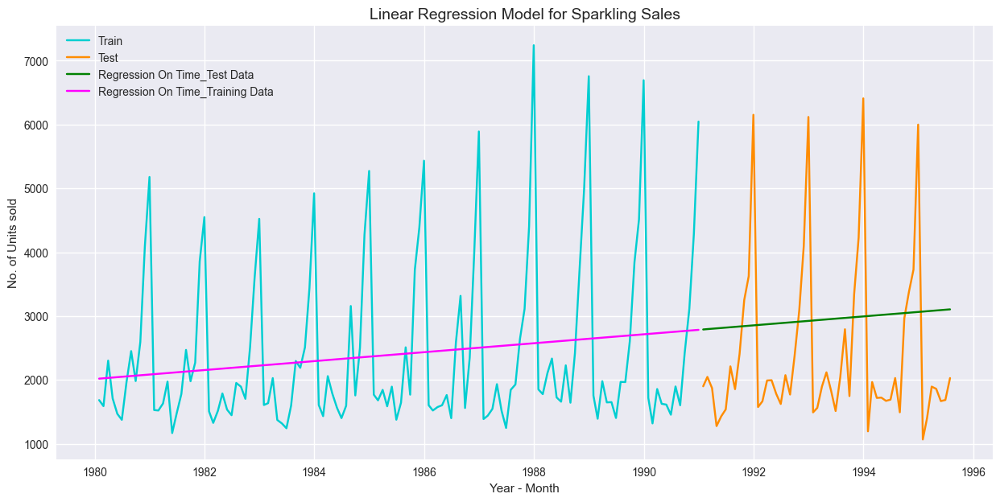

In [ ]:
plt.plot( train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'darkorange')
plt.plot(LinearRegression_test['RegOnTime_spark'], label='Regression On Time_Test Data', color = 'green')
plt.plot(LinearRegression_train['RegOnTime_spark'], label='Regression On Time_Training Data', color = 'magenta')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Linear Regression Model for Sparkling Sales', fontsize = 14)

#### For Rose wine

In [ ]:
lr2 = LinearRegression().fit(LinearRegression_train[['time']],LinearRegression_train['Rose'].values)

In [ ]:
LinearRegression_train['RegOnTime_rose']        = lr2.predict(LinearRegression_train[['time']])
LinearRegression_test['RegOnTime_rose']         = lr2.predict(LinearRegression_test[['time']])

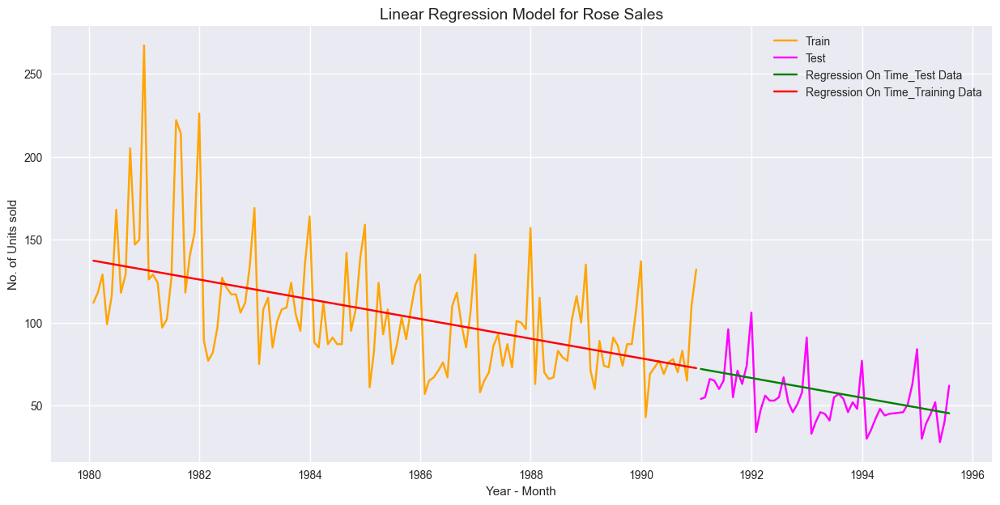

In [ ]:
plt.plot( train['Rose'], label='Train', color = 'orange')
plt.plot(test['Rose'], label='Test', color = 'magenta')
plt.plot(LinearRegression_test['RegOnTime_rose'], label='Regression On Time_Test Data', color = 'green')
plt.plot(LinearRegression_train['RegOnTime_rose'], label='Regression On Time_Training Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Linear Regression Model for Rose Sales',fontsize=14)

#### Model Evaluation

In [ ]:
from sklearn import metrics
def MAPE(y, yhat):
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape =  round(np.sum(np.abs(yhat - y)) / np.sum(y) * 100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

- Sparkling Training Data - RMSE and MAPE

In [ ]:
rmse_spark_model1_train = metrics.mean_squared_error(train['Sparkling'],LinearRegression_train['RegOnTime_spark'],squared=False)
mape_spark_model1_train = MAPE(train['Sparkling'],LinearRegression_train['RegOnTime_spark'])
print("For Regression On Time forecast on the Sparkling Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model1_train, mape_spark_model1_train))

For Regression On Time forecast on the Sparkling Training Data:  RMSE is 1279.322 and MAPE is 40.05


- Sparkling Testing Data - RMSE and MAPE

In [ ]:
rmse_spark_model1_test = metrics.mean_squared_error(test['Sparkling'],LinearRegression_test['RegOnTime_spark'],squared=False)
mape_spark_model1_test = MAPE(test['Sparkling'],LinearRegression_test['RegOnTime_spark'])
print("For Regression On Time forecast on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model1_test, mape_spark_model1_test))

For Regression On Time forecast on the Sparkling Testing Data:  RMSE is 1389.135 and MAPE is 50.15


- Rose Training Data - RMSE and MAPE

In [ ]:
rmse_rose_model1_train = metrics.mean_squared_error(train['Rose'],LinearRegression_train['RegOnTime_rose'],squared=False)
mape_rose_model1_train = MAPE(train['Rose'],LinearRegression_train['RegOnTime_rose'])
print("For Regression On Time forecast on the Rose Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model1_train, mape_rose_model1_train))

For Regression On Time forecast on the Rose Training Data:  RMSE is 30.718 and MAPE is 21.22


- Rose testing Data - RMSE and MAPE

In [ ]:
rmse_rose_model1_test = metrics.mean_squared_error(test['Rose'],LinearRegression_test['RegOnTime_rose'],squared=False)
mape_rose_model1_test = MAPE(test['Rose'],LinearRegression_test['RegOnTime_rose'])
print("For Regression On Time forecast on the Rose testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model1_test, mape_rose_model1_test))

For Regression On Time forecast on the Rose testing Data:  RMSE is 15.269 and MAPE is 22.82


In [ ]:
spark_resultsDf = pd.DataFrame({'Test RMSE': [rmse_spark_model1_test],'Test MAPE': [mape_spark_model1_test]},index=['Regression On Time'])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15


In [ ]:
rose_resultsDf = pd.DataFrame({'Test RMSE': [rmse_rose_model1_test],'Test MAPE': [mape_rose_model1_test]},index=['Regression On Time'])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82


#### Model 2: Naive forecast

In [ ]:
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

#### For Sparkling Wine

In [ ]:
NaiveModel_train['spark_naive'] = np.asarray(train['Sparkling'])[len(np.asarray(train['Sparkling']))-1]
NaiveModel_train['spark_naive'].head()

YearMonth
1980-01-31    6047
1980-02-29    6047
1980-03-31    6047
1980-04-30    6047
1980-05-31    6047
Name: spark_naive, dtype: int64

In [ ]:
NaiveModel_test['spark_naive'] = np.asarray(train['Sparkling'])[len(np.asarray(train['Sparkling']))-1]
NaiveModel_test['spark_naive'].head()

YearMonth
1991-01-31    6047
1991-02-28    6047
1991-03-31    6047
1991-04-30    6047
1991-05-31    6047
Name: spark_naive, dtype: int64

Text(0.5, 1.0, 'Naive Forecast Model for Sparkling Wine')

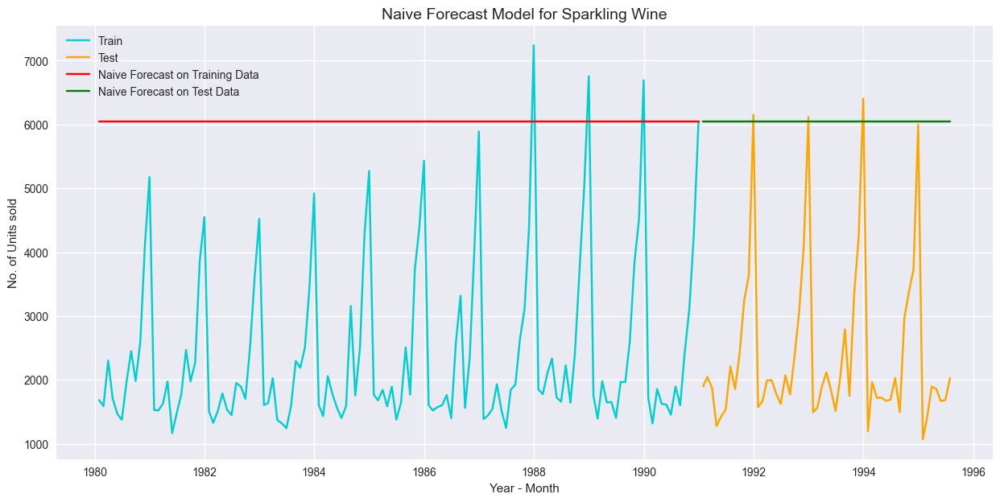

In [ ]:
plt.plot(NaiveModel_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'orange')
plt.plot(NaiveModel_train['spark_naive'], label='Naive Forecast on Training Data', color = 'red')
plt.plot(NaiveModel_test['spark_naive'], label='Naive Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("Naive Forecast Model for Sparkling Wine", fontsize = 14)

#### Rose Wine

In [ ]:
NaiveModel_train['rose_naive'] = np.asarray(train['Rose'])[len(np.asarray(train['Rose']))-1]
NaiveModel_train['rose_naive'].head()

YearMonth
1980-01-31    132.0
1980-02-29    132.0
1980-03-31    132.0
1980-04-30    132.0
1980-05-31    132.0
Name: rose_naive, dtype: float64

In [ ]:
NaiveModel_test['rose_naive'] = np.asarray(train['Rose'])[len(np.asarray(train['Rose']))-1]
NaiveModel_test['rose_naive'].head()

YearMonth
1991-01-31    132.0
1991-02-28    132.0
1991-03-31    132.0
1991-04-30    132.0
1991-05-31    132.0
Name: rose_naive, dtype: float64

Text(0.5, 1.0, 'Naive Forecast Model for Rose Wine')

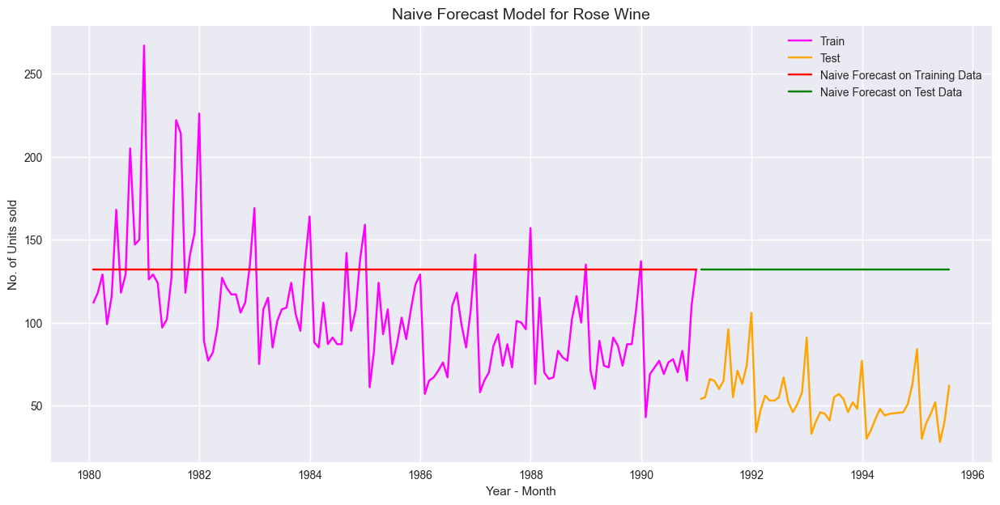

In [ ]:
plt.plot(NaiveModel_train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')
plt.plot(NaiveModel_train['rose_naive'], label='Naive Forecast on Training Data', color = 'red')
plt.plot(NaiveModel_test['rose_naive'], label='Naive Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("Naive Forecast Model for Rose Wine", fontsize = 14)

#### Model Evauation

- Sparkling Training Data - RMSE and MAPE

In [ ]:
rmse_spark_model2_train = metrics.mean_squared_error(train['Sparkling'],NaiveModel_train['spark_naive'],squared=False)
mape_spark_model2_train = MAPE(train['Sparkling'],NaiveModel_train['spark_naive'])
print("For Naive forecast Model on the Sparkling Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model2_train, mape_spark_model2_train))

For Naive forecast Model on the Sparkling Training Data:  RMSE is 3867.701 and MAPE is 153.17


In [ ]:
## Sparkling Testing Data - RMSE and MAPE

rmse_spark_model2_test = metrics.mean_squared_error(test['Sparkling'],NaiveModel_test['spark_naive'],squared=False)
mape_spark_model2_test = MAPE(test['Sparkling'],NaiveModel_test['spark_naive'])
print("For Naive forecast Model on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model2_test, mape_spark_model2_test))

For Naive forecast Model on the Sparkling Testing Data:  RMSE is 3864.279 and MAPE is 152.87


In [ ]:
## Rose Training Data - RMSE and MAPE

rmse_rose_model2_train = metrics.mean_squared_error(train['Rose'],NaiveModel_train['rose_naive'],squared=False)
mape_rose_model2_train = MAPE(train['Rose'],NaiveModel_train['rose_naive'])
print("For Naive forecast Model on the Rose Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model2_train, mape_rose_model2_train))

For Naive forecast Model on the Rose Training Data:  RMSE is 45.064 and MAPE is 36.38


In [ ]:
## Rose Testing Data - RMSE and MAPE

rmse_rose_model2_test = metrics.mean_squared_error(test['Rose'],NaiveModel_test['rose_naive'],squared=False)
mape_rose_model2_test = MAPE(test['Rose'],NaiveModel_test['rose_naive'])
print("For Naive forecast Model on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model2_test, mape_rose_model2_test))

For Naive forecast Model on the Rose Testing Data:  RMSE is 79.719 and MAPE is 145.10


In [ ]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_spark_model2_test],'Test MAPE': [mape_spark_model2_test]},index=['NaiveModel'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_2])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87


In [ ]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_rose_model2_test],'Test MAPE': [mape_rose_model2_test]},index=['NaiveModel'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10


### Model 3: Simple Average

In [ ]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

#### For Sparkling Wine

In [ ]:
SimpleAverage_train['spark_mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_train['spark_mean_forecast'].head()

YearMonth
1980-01-31    2403.780303
1980-02-29    2403.780303
1980-03-31    2403.780303
1980-04-30    2403.780303
1980-05-31    2403.780303
Name: spark_mean_forecast, dtype: float64

In [ ]:
SimpleAverage_test['spark_mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_test['spark_mean_forecast'].head()

YearMonth
1991-01-31    2403.780303
1991-02-28    2403.780303
1991-03-31    2403.780303
1991-04-30    2403.780303
1991-05-31    2403.780303
Name: spark_mean_forecast, dtype: float64

Text(0.5, 1.0, 'SimpleAverage Forecast for Sparkling Wine')

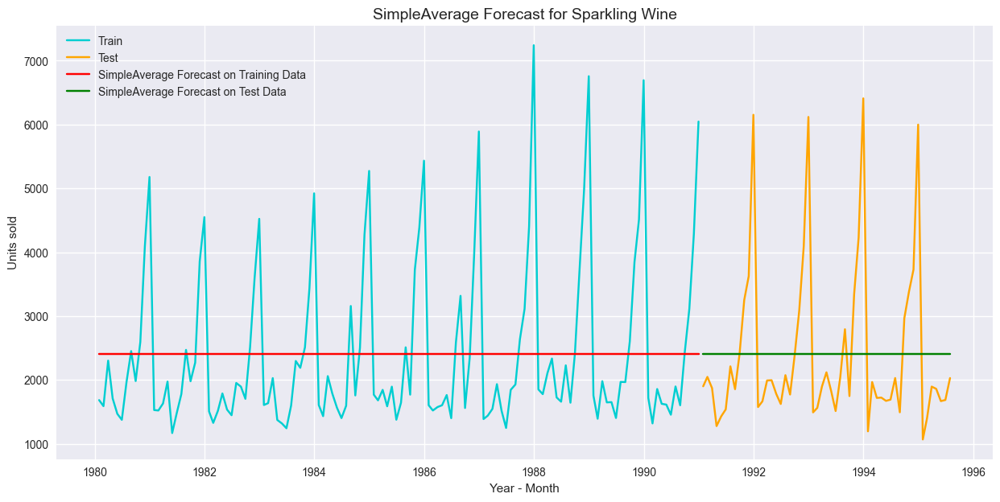

In [ ]:
plt.plot(SimpleAverage_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'orange')
plt.plot(SimpleAverage_train['spark_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'red')
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("SimpleAverage Forecast for Sparkling Wine", fontsize=14)

#### Rose Wine

In [ ]:
SimpleAverage_train['rose_mean_forecast'] = train['Rose'].mean()
SimpleAverage_train['rose_mean_forecast'].head()

YearMonth
1980-01-31    104.939394
1980-02-29    104.939394
1980-03-31    104.939394
1980-04-30    104.939394
1980-05-31    104.939394
Name: rose_mean_forecast, dtype: float64

In [ ]:
SimpleAverage_test['rose_mean_forecast'] = train['Rose'].mean()
SimpleAverage_test['rose_mean_forecast'].head()

YearMonth
1991-01-31    104.939394
1991-02-28    104.939394
1991-03-31    104.939394
1991-04-30    104.939394
1991-05-31    104.939394
Name: rose_mean_forecast, dtype: float64

Text(0.5, 1.0, 'SimpleAverage Forecast Model on Rose Wine')

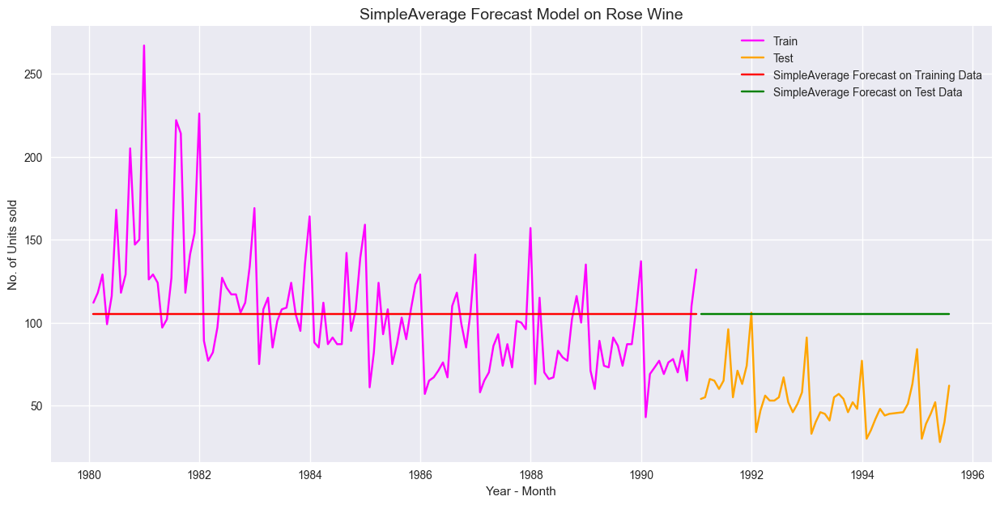

In [ ]:
plt.plot(SimpleAverage_train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')
plt.plot(SimpleAverage_train['rose_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'red')
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("SimpleAverage Forecast Model on Rose Wine", fontsize=14)

#### Model Evaluation

In [ ]:
## Sparkling Training Data - RMSE and MAPE

rmse_spark_model3_train = metrics.mean_squared_error(train['Sparkling'],SimpleAverage_train['spark_mean_forecast'],squared=False)
mape_spark_model3_train = MAPE(train['Sparkling'],SimpleAverage_train['spark_mean_forecast'])
print("For Simple Average forecast Model on the Sparkling Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model3_train, mape_spark_model3_train))

For Simple Average forecast Model on the Sparkling Training Data:  RMSE is 1298.484 and MAPE is 40.36


In [ ]:
## Sparkling Testing Data - RMSE and MAPE

rmse_spark_model3_test = metrics.mean_squared_error(test['Sparkling'],SimpleAverage_test['spark_mean_forecast'],squared=False)
mape_spark_model3_test = MAPE(test['Sparkling'],SimpleAverage_test['spark_mean_forecast'])
print("For Simple Average forecast Model on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model3_test, mape_spark_model3_test))

For Simple Average forecast Model on the Sparkling Testing Data:  RMSE is 1275.082 and MAPE is 38.90


In [ ]:
## Rose Training Data - RMSE and MAPE

rmse_rose_model3_train = metrics.mean_squared_error(train['Rose'],SimpleAverage_train['rose_mean_forecast'],squared=False)
mape_rose_model3_train = MAPE(train['Rose'],SimpleAverage_train['rose_mean_forecast'])
print("For Simple Average forecast Model on the Rose Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model3_train, mape_rose_model3_train))

For Simple Average forecast Model on the Rose Training Data:  RMSE is 36.034 and MAPE is 25.39


In [ ]:
## Rose Testing Data - RMSE and MAPE

rmse_rose_model3_test = metrics.mean_squared_error(test['Rose'],SimpleAverage_test['rose_mean_forecast'],squared=False)
mape_rose_model3_test = MAPE(test['Rose'],SimpleAverage_test['rose_mean_forecast'])
print("For Simple Average forecast Model on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model3_test, mape_rose_model3_test))

For Simple Average forecast Model on the Rose Testing Data:  RMSE is 53.460 and MAPE is 94.93


In [ ]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_spark_model3_test],'Test MAPE': [mape_spark_model3_test]},index=['SimpleAverage'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_2])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90


In [ ]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_rose_model3_test],'Test MAPE': [mape_rose_model3_test]},index=['SimpleAverage'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93


### Model 4: Moving Average

In [ ]:
MovingAverage = df.copy()
MovingAverage.head()

,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


In [ ]:
MovingAverage['Spark_Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Spark_Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Spark_Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Spark_Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()
MovingAverage['Rose_Trailing_2'] = MovingAverage['Rose'].rolling(2).mean()
MovingAverage['Rose_Trailing_4'] = MovingAverage['Rose'].rolling(4).mean()
MovingAverage['Rose_Trailing_6'] = MovingAverage['Rose'].rolling(6).mean()
MovingAverage['Rose_Trailing_9'] = MovingAverage['Rose'].rolling(9).mean()

MovingAverage.head()

,Sparkling,Rose,Spark_Trailing_2,Spark_Trailing_4,Spark_Trailing_6,Spark_Trailing_9,Rose_Trailing_2,Rose_Trailing_4,Rose_Trailing_6,Rose_Trailing_9
YearMonth,,,,,,,,,,
1980-01-31,1686,112.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-02-29,1591,118.0,1638.5,NaN,NaN,NaN,115.0,NaN,NaN,NaN
1980-03-31,2304,129.0,1947.5,NaN,NaN,NaN,123.5,NaN,NaN,NaN
1980-04-30,1712,99.0,2008.0,1823.25,NaN,NaN,114.0,114.5,NaN,NaN
1980-05-31,1471,116.0,1591.5,1769.50,NaN,NaN,107.5,115.5,NaN,NaN


### For Sparkling Wine

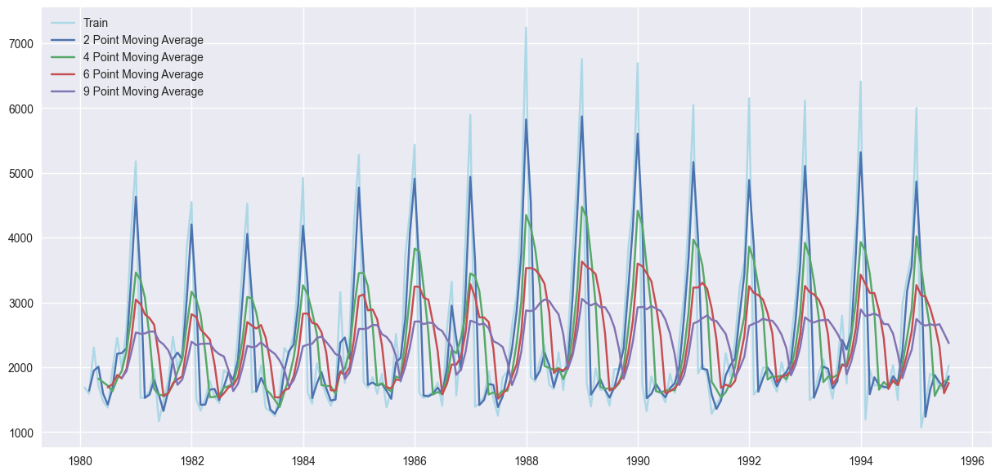

In [ ]:
plt.plot(MovingAverage['Sparkling'], label='Train', color='lightblue')
plt.plot(MovingAverage['Spark_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best')

In [ ]:
#Creating train and test set
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

Text(0.5, 1.0, 'Trailing Moving Average Forecast Model for Sparkling Wine')

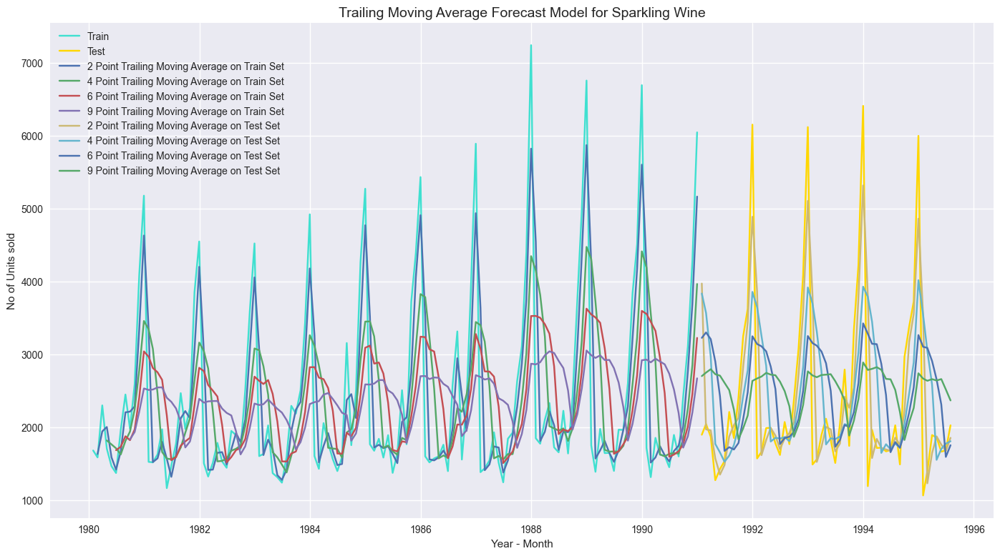

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(17,9))
plt.plot(trailing_MovingAverage_train['Sparkling'], label='Train', color = 'turquoise')
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')

plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')

plt.title("Trailing Moving Average Forecast Model for Sparkling Wine", fontsize=14)

#### For Rose Wine

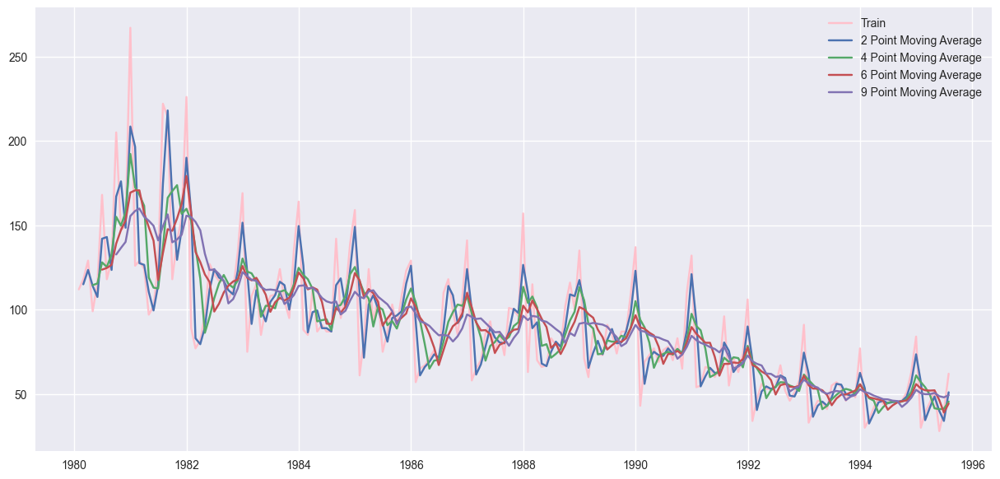

In [ ]:
plt.plot(MovingAverage['Rose'], label='Train', color='pink')
plt.plot(MovingAverage['Rose_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best')

Text(0.5, 1.0, 'Rose - Trailing Moving Average Forecast')

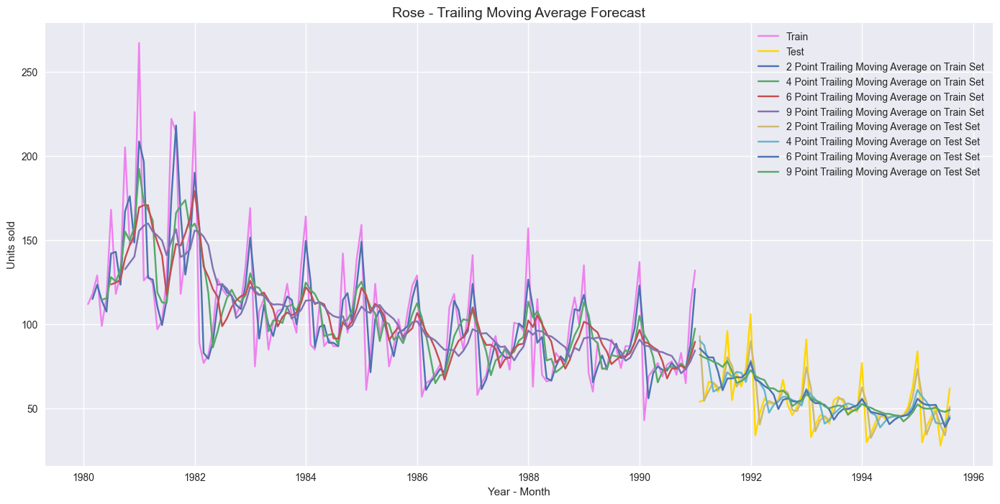

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(17,8))
plt.plot(trailing_MovingAverage_train['Rose'], label='Train', color = 'violet')
plt.plot(trailing_MovingAverage_test['Rose'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')

plt.title("Rose - Trailing Moving Average Forecast", fontsize=14)

#### Model Evaluation

#### For Sparkling Wine Test Data

In [ ]:
## Test Data - rmse_spark and mape_spark for 2 point Spark_Trailing MA

rmse_spark_model4_test_2 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_2'],squared=False)
mape_spark_model4_test_2 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_2'])
print("For 2 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_2, mape_spark_model4_test_2))

## Test Data - rmse_spark and mape_spark for 4 point Spark_Trailing MA

rmse_spark_model4_test_4 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_4'],squared=False)
mape_spark_model4_test_4 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_4'])
print("For 4 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_4, mape_spark_model4_test_4))

## Test Data - rmse_spark and mape_spark for 6 point Spark_Trailing MA

rmse_spark_model4_test_6 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_6'],squared=False)
mape_spark_model4_test_6 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_6'])
print("For 6 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_6, mape_spark_model4_test_6))

## Test Data - rmse_spark and mape_spark for 9 point Spark_Trailing MA

rmse_spark_model4_test_9 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_9'],squared=False)
mape_spark_model4_test_9 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_9'])
print("For 9 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_9, mape_spark_model4_test_9))

For 2 point Moving Average Model forecast on the Training Data,  rmse_spark is 813.401 mape_spark is 19.70
For 4 point Moving Average Model forecast on the Training Data,  rmse_spark is 1156.590 mape_spark is 35.96
For 6 point Moving Average Model forecast on the Training Data,  rmse_spark is 1283.927 mape_spark is 43.86
For 9 point Moving Average Model forecast on the Training Data,  rmse_spark is 1346.278 mape_spark is 46.86


#### For Rose Wine Test Data

In [ ]:
## Test Data - rmse_rose and mape_rose for 2 point rose_Trailing MA

rmse_rose_model4_test_2 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_2'],squared=False)
mape_rose_model4_test_2 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_2'])
print("For 2 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_2, mape_rose_model4_test_2))

## Test Data - rmse_rose and mape_rose for 4 point rose_Trailing MA

rmse_rose_model4_test_4 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_4'],squared=False)
mape_rose_model4_test_4 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_4'])
print("For 4 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_4, mape_rose_model4_test_4))

## Test Data - rmse_rose and mape_rose for 6 point rose_Trailing MA

rmse_rose_model4_test_6 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_6'],squared=False)
mape_rose_model4_test_6 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_6'])
print("For 6 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_6, mape_rose_model4_test_6))

## Test Data - rmse_rose and mape_rose for 9 point rose_Trailing MA

rmse_rose_model4_test_9 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_9'],squared=False)
mape_rose_model4_test_9 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_9'])
print("For 9 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_9, mape_rose_model4_test_9))

For 2 point Moving Average Model forecast on the Training Data,  rmse_rose is 11.529 mape_rose is 13.54
For 4 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.451 mape_rose is 19.49
For 6 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.566 mape_rose is 20.82
For 9 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.728 mape_rose is 21.01


In [ ]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_spark_model4_test_2,rmse_spark_model4_test_4
                                          ,rmse_spark_model4_test_6,rmse_spark_model4_test_9]
                            ,'Test MAPE': [mape_spark_model4_test_2,mape_spark_model4_test_4,
                                           mape_spark_model4_test_6,mape_spark_model4_test_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_4])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86


In [ ]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_rose_model4_test_2,rmse_rose_model4_test_4
                                          ,rmse_rose_model4_test_6,rmse_rose_model4_test_9]
                            ,'Test MAPE': [mape_rose_model4_test_2,mape_rose_model4_test_4,
                                           mape_rose_model4_test_6,mape_rose_model4_test_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_4])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01


### Model 5: Simple Exponential Smoothing

In [ ]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [ ]:
SES_train = train.copy()
SES_test = test.copy()

In [ ]:
SES_train['Sparkling'].head()

YearMonth
1980-01-31    1686
1980-02-29    1591
1980-03-31    2304
1980-04-30    1712
1980-05-31    1471
Name: Sparkling, dtype: int64

In [ ]:
SES_train['Rose'].head()

YearMonth
1980-01-31    112.0
1980-02-29    118.0
1980-03-31    129.0
1980-04-30     99.0
1980-05-31    116.0
Name: Rose, dtype: float64

#### For Sparkling Wine

In [ ]:
model = SimpleExpSmoothing(np.asarray(SES_train['Sparkling']))

Test: For alpha = 0.05,  RMSE is 1316.4117 MAPE is 45.50
For smoothing level = 0.05,  Initial level 1686.00


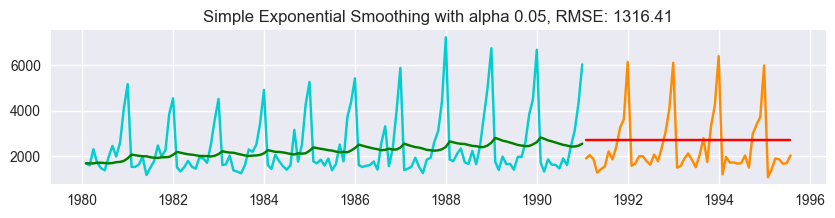

Test: For alpha = 0.10,  RMSE is 1375.3934 MAPE is 49.53
For smoothing level = 0.10,  Initial level 1686.00


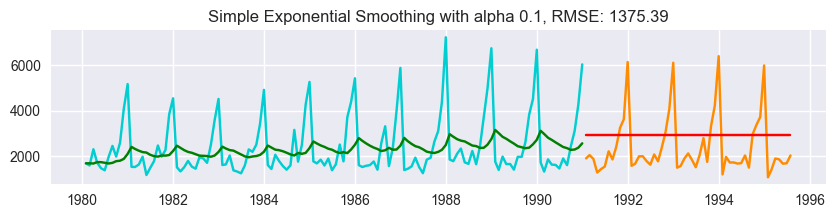

Test: For alpha = 0.20,  RMSE is 1595.2068 MAPE is 60.46
For smoothing level = 0.20,  Initial level 1686.00


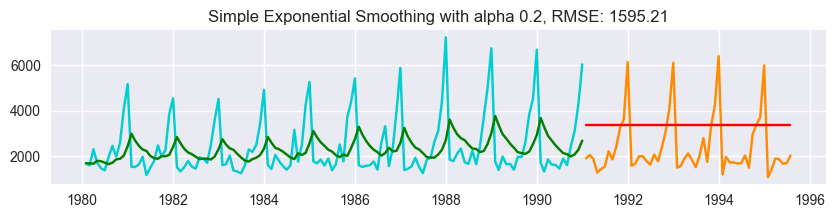

Test: For alpha = 0.30,  RMSE is 1935.5071 MAPE is 75.66
For smoothing level = 0.30,  Initial level 1686.00


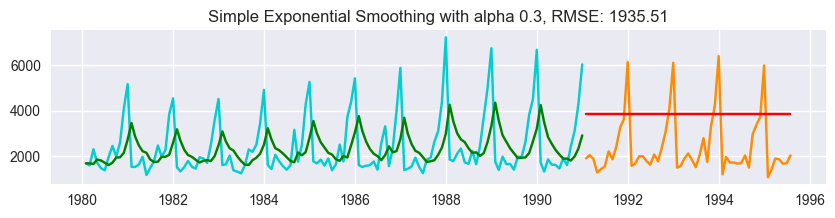

Test: For alpha = 0.50,  RMSE is 2666.3514 MAPE is 106.27
For smoothing level = 0.50,  Initial level 1686.00


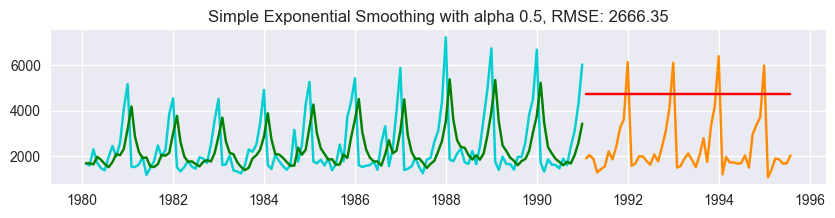

Test: For alpha = 0.99,  RMSE is 3847.5490 MAPE is 152.21
For smoothing level = 0.99,  Initial level 1686.00


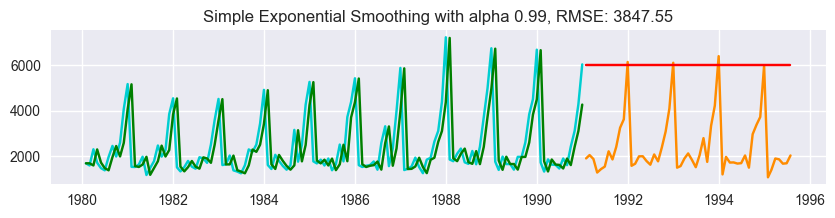

In [ ]:
alpha_list = [0.05, 0.1, 0.2, 0.3, 0.5, 0.99]
pred_train_SES  = train.copy()
pred_test_SES  = test.copy()


for alpha_value in alpha_list:

    alpha_str            =  "SES " + str(alpha_value)
    mode_fit_i           =  model.fit(smoothing_level = alpha_value, optimized=False)
    pred_train_SES[alpha_str]  =  mode_fit_i.fittedvalues
    pred_test_SES[alpha_str]  =  mode_fit_i.forecast(len(test['Sparkling']))
    rmse                 =  np.sqrt(metrics.mean_squared_error(test['Sparkling'], pred_test_SES[alpha_str]))
    mape                 =  MAPE(test['Sparkling'],pred_test_SES[alpha_str])



    print("Test: For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse, mape))
    print("For smoothing level = %1.2f,  Initial level %1.2f" %(mode_fit_i.params['smoothing_level'],mode_fit_i.params['initial_level']))
    plt.figure(figsize=(10,2))
    plt.plot(train['Sparkling'], color = 'darkturquoise')
    plt.plot(test['Sparkling'], color = 'darkorange')
    plt.plot(pred_train_SES[alpha_str], color = 'green')
    plt.plot(pred_test_SES[alpha_str], color = 'red')
    plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value)+', RMSE: '+str(np.round(rmse,2)))
    plt.show()

In [ ]:
model_SES_autofit = model.fit(optimized=True,use_brute=True)

In [ ]:
model_SES_autofit.params

{'smoothing_level': np.float64(0.03953488372093023),
 'smoothing_trend': np.float64(nan),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(1686.0),
 'initial_trend': np.float64(nan),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
SES_train['predict_spark'] = model_SES_autofit.fittedvalues
SES_train.head()

,Sparkling,Rose,predict_spark
YearMonth,,,
1980-01-31,1686,112.0,1686.000000
1980-02-29,1591,118.0,1686.000000
1980-03-31,2304,129.0,1682.244186
1980-04-30,1712,99.0,1706.825230
1980-05-31,1471,116.0,1707.029814


In [ ]:
SES_test['predict_spark'] = model_SES_autofit.forecast(steps=len(SES_test))
SES_test.head()

,Sparkling,Rose,predict_spark
YearMonth,,,
1991-01-31,1902,54.0,2676.676366
1991-02-28,2049,55.0,2676.676366
1991-03-31,1874,66.0,2676.676366
1991-04-30,1279,65.0,2676.676366
1991-05-31,1432,60.0,2676.676366


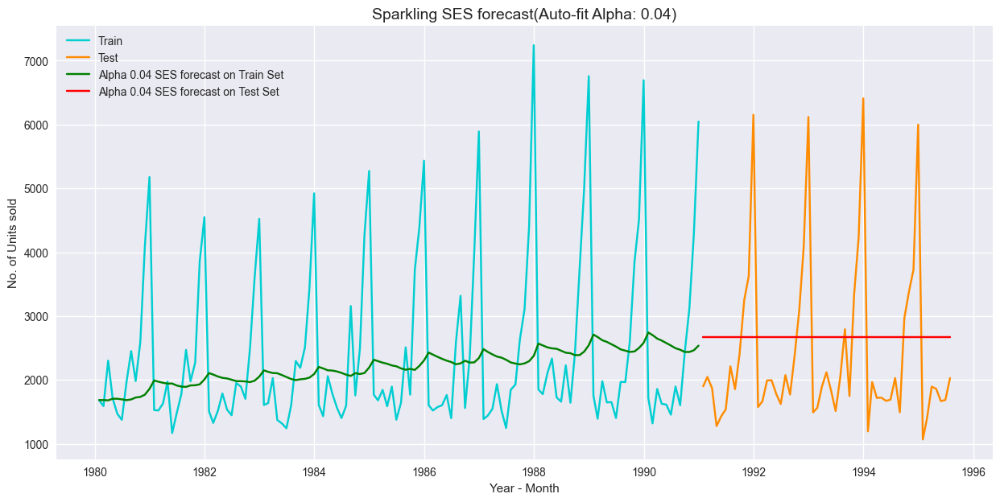

In [ ]:
## Plotting on both the Training and Test data
plt.plot(SES_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(SES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SES_train['predict_spark'],color = 'green', label='Alpha 0.04 SES forecast on Train Set')
plt.plot(SES_test['predict_spark'],color = 'red', label='Alpha 0.04 SES forecast on Test Set')

plt.legend(loc='best')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Sparkling SES forecast(Auto-fit Alpha: 0.04)', fontsize = 14)

#### For Rose Wine

In [ ]:
model_rose = SimpleExpSmoothing(SES_train['Rose'])

Test: For alpha = 0.10,  RMSE is 36.8278 MAPE is 63.94
For smoothing level = 0.10,  Initial level 112.00


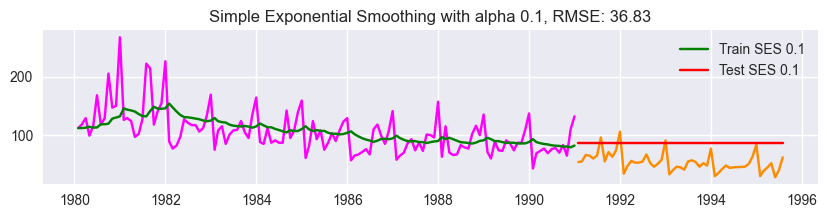

Test: For alpha = 0.20,  RMSE is 41.3617 MAPE is 72.21
For smoothing level = 0.20,  Initial level 112.00


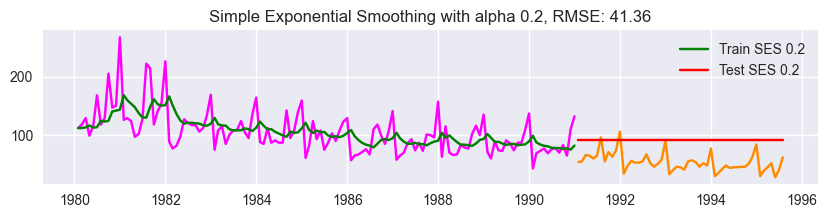

Test: For alpha = 0.30,  RMSE is 47.5046 MAPE is 83.71
For smoothing level = 0.30,  Initial level 112.00


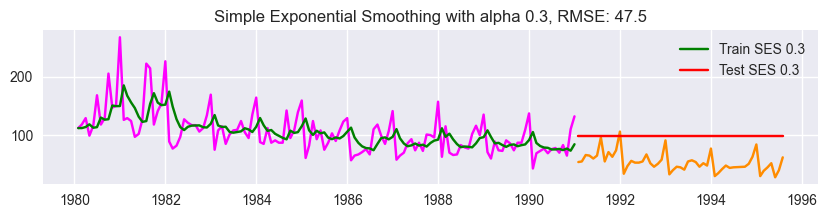

Test: For alpha = 0.50,  RMSE is 59.6416 MAPE is 106.81
For smoothing level = 0.50,  Initial level 112.00


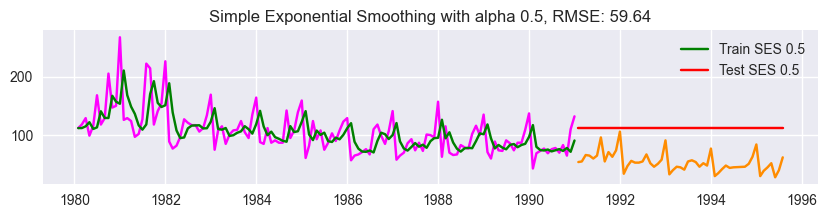

Test: For alpha = 0.99,  RMSE is 79.4985 MAPE is 144.69
For smoothing level = 0.99,  Initial level 112.00


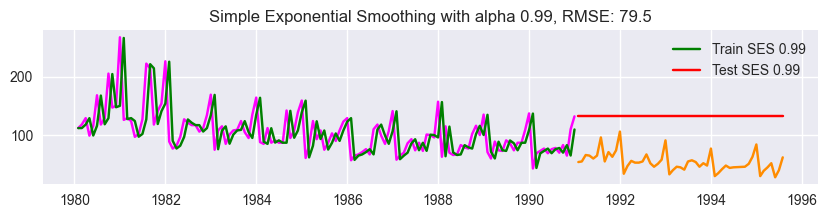

In [ ]:
alpha_list = [0.1, 0.2, 0.3, 0.5, 0.99]
pred_train_SES  = train.copy()
pred_test_SES  = test.copy()


for alpha_value in alpha_list:

    alpha_str            =  "SES " + str(alpha_value)
    mode_fit_i           =  model_rose.fit(smoothing_level = alpha_value, optimized=False)
    pred_train_SES[alpha_str]  =  mode_fit_i.fittedvalues
    pred_test_SES[alpha_str]  =  mode_fit_i.forecast(len(test['Rose']))
    rmse                 =  np.sqrt(metrics.mean_squared_error(test['Rose'], pred_test_SES[alpha_str]))
    mape                 =  MAPE(test['Rose'],pred_test_SES[alpha_str])



    print("Test: For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse, mape))
    print("For smoothing level = %1.2f,  Initial level %1.2f" %(mode_fit_i.params['smoothing_level'],mode_fit_i.params['initial_level']))
    plt.figure(figsize=(10,2))
    #Plotting the training, test and the predicted time series plots
    plt.plot(train['Rose'], color = 'magenta')
    plt.plot(test['Rose'], color = 'darkorange')
    plt.plot(pred_train_SES[alpha_str], label  = "Train "+alpha_str, color = 'green')
    plt.plot(pred_test_SES[alpha_str], label  = "Test "+alpha_str, color = 'red')
    plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value)+', RMSE: '+str(np.round(rmse,2)))
    plt.legend(loc='best')
    plt.show()

In [ ]:
model_SES_autofit2 = model_rose.fit(optimized=True,use_brute=True)
model_SES_autofit2.params

{'smoothing_level': np.float64(0.12362013205048396),
 'smoothing_trend': np.float64(nan),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(112.0),
 'initial_trend': np.float64(nan),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
SES_train['predict_rose'] = model_SES_autofit2.fittedvalues
SES_train.head()

,Sparkling,Rose,predict_spark,predict_rose
YearMonth,,,,
1980-01-31,1686,112.0,1686.000000,112.000000
1980-02-29,1591,118.0,1686.000000,112.000000
1980-03-31,2304,129.0,1682.244186,112.741721
1980-04-30,1712,99.0,1706.825230,114.751571
1980-05-31,1471,116.0,1707.029814,112.804360


In [ ]:
SES_test['predict_rose'] = model_SES_autofit2.forecast(steps=len(SES_test))
SES_test.head()

,Sparkling,Rose,predict_spark,predict_rose
YearMonth,,,,
1991-01-31,1902,54.0,2676.676366,87.983765
1991-02-28,2049,55.0,2676.676366,87.983765
1991-03-31,1874,66.0,2676.676366,87.983765
1991-04-30,1279,65.0,2676.676366,87.983765
1991-05-31,1432,60.0,2676.676366,87.983765


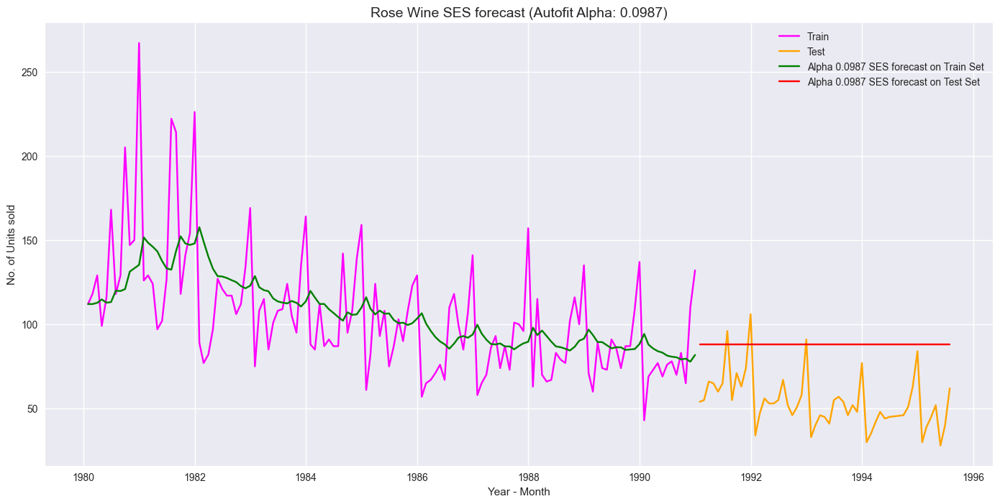

In [ ]:
plt.figure(figsize=(17,8))
plt.plot(SES_train['Rose'], label='Train', color = 'magenta')
plt.plot(SES_test['Rose'], label='Test', color = 'orange')

plt.plot(SES_train['predict_rose'],color = 'green', label='Alpha 0.0987 SES forecast on Train Set')
plt.plot(SES_test['predict_rose'],color = 'red', label='Alpha 0.0987 SES forecast on Test Set')

plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose Wine SES forecast (Autofit Alpha: 0.0987)', fontsize = 14)

#### Model Evaluation

In [ ]:
## Sparkling Training Data - RMSE and MAPE

rmse_spark_model5_train = metrics.mean_squared_error(train['Sparkling'],SES_train['predict_spark'],squared=False)
mape_spark_model5_train = MAPE(train['Sparkling'],SES_train['predict_spark'])
print("For SES forecast on the Sparkling Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model5_train, mape_spark_model5_train))

For SES forecast on the Sparkling Training Data:  RMSE is 1317.131 and MAPE is 39.05


In [ ]:
## Sparkling Testing Data - RMSE and MAPE

rmse_spark_model5_test = metrics.mean_squared_error(test['Sparkling'],SES_test['predict_spark'],squared=False)
mape_spark_model5_test = MAPE(test['Sparkling'],SES_test['predict_spark'])
print("For SES forecast on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model5_test, mape_spark_model5_test))

For SES forecast on the Sparkling Testing Data:  RMSE is 1304.927 and MAPE is 44.48


In [ ]:
## Rose Training Data - RMSE and MAPE

rmse_rose_model5_train = metrics.mean_squared_error(train['Rose'],SES_train['predict_rose'],squared=False)
mape_rose_model5_train = MAPE(train['Rose'],SES_train['predict_rose'])
print("For SES forecast on the Rose Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model5_train, mape_rose_model5_train))

For SES forecast on the Rose Training Data:  RMSE is 31.777 and MAPE is 22.37


In [ ]:
## Rose Testing Data - RMSE and MAPE

rmse_rose_model5_test = metrics.mean_squared_error(test['Rose'],SES_test['predict_rose'],squared=False)
mape_rose_model5_test = MAPE(test['Rose'],SES_test['predict_rose'])
print("For SES forecast on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model5_test, mape_rose_model5_test))

For SES forecast on the Rose Testing Data:  RMSE is 37.592 and MAPE is 65.33


In [ ]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_spark_model5_test],'Test MAPE': [mape_spark_model5_test]},index=['SES Alpha 0.00'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_5])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1304.927405,44.48


In [ ]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_rose_model5_test],'Test MAPE': [mape_rose_model5_test]},index=['SES Alpha 0.01'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_5])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,37.591989,65.33


### Model 6: Double Exponential Smoothing (Holt's Model)

In [ ]:
DES_train = train.copy()
DES_test = test.copy()

In [ ]:
import statsmodels
statsmodels.__version__

'0.14.2'

#### fOR sPARKLING Wine

In [ ]:
model_DES = Holt(DES_train['Sparkling'])

In [ ]:
resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Train MAPE':[],
                            'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=True,use_brute=True)
        DES_train['predict_spark',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict_spark',i,j] = model_DES_alpha_i_j.forecast(len(test['Sparkling']))

        rmse_spark_model6_train = np.round(metrics.mean_squared_error(DES_train['Sparkling'],DES_train['predict_spark',i,j],squared=False),2)
        mape_spark_model6_train = MAPE(DES_train['Sparkling'],DES_train['predict_spark',i,j])

        rmse_spark_model6_test = np.round(metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict_spark',i,j],squared=False),2)
        mape_spark_model6_test = MAPE(DES_test['Sparkling'],DES_test['predict_spark',i,j])

        resultsDf_6 = resultsDf_6.append({'Alpha':i,'Beta':j,
                                          'Train RMSE':rmse_spark_model6_train ,'Train MAPE': mape_spark_model6_train,
                                          'Test RMSE':rmse_spark_model6_test ,'Test MAPE':mape_spark_model6_test},
                                         ignore_index=True)

AttributeError: 'DataFrame' object has no attribute 'append'

In [ ]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,1363.47,44.26,1779.42,67.23
1,0.1,0.2,1398.19,45.61,2601.54,95.50
10,0.2,0.1,1412.03,46.62,3611.77,135.41
2,0.1,0.3,1431.37,46.90,4288.43,155.25
20,0.3,0.1,1428.27,46.92,5908.19,223.50


In [ ]:
resultsDf_6.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,1363.47,44.26,1779.42,67.23
1,0.1,0.2,1398.19,45.61,2601.54,95.50
10,0.2,0.1,1412.03,46.62,3611.77,135.41
2,0.1,0.3,1431.37,46.90,4288.43,155.25
3,0.1,0.4,1466.77,48.27,6042.38,219.09


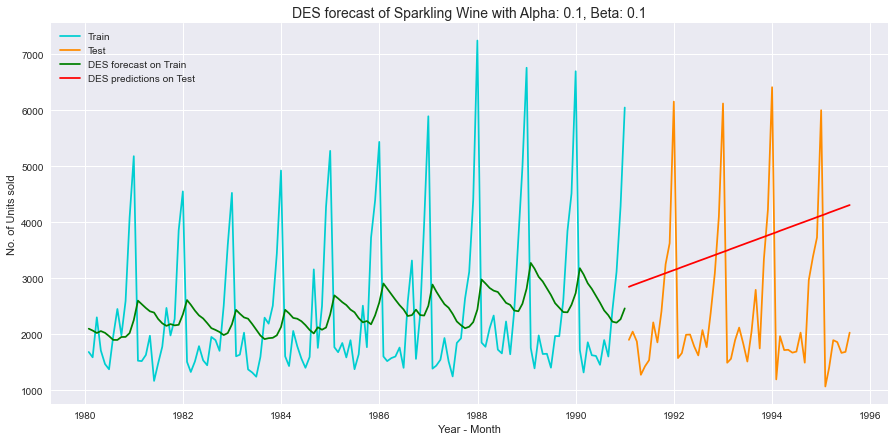

In [ ]:
plt.plot(DES_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(DES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(DES_train['predict_spark', 0.1, 0.1], color = 'green', label='DES forecast on Train')
plt.plot(DES_test['predict_spark', 0.1, 0.1], color = 'red', label='DES predictions on Test')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('DES forecast of Sparkling Wine with Alpha: 0.1, Beta: 0.1', fontsize=14)
plt.legend(loc='best')

In [ ]:
#Trying outfit for the model
model_DES_autofit = model_DES.fit(optimized=True,use_brute=True)

In [ ]:
model_DES_autofit.params

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
alpha = model_DES_autofit.params['smoothing_level']
beta = model_DES_autofit.params['smoothing_trend']
alpha_6_1 = alpha
beta_6_1 = beta

In [ ]:
DES_train['predict_spark',alpha,beta] = model_DES_autofit.fittedvalues

In [ ]:
DES_test['predict_spark',alpha,beta] = model_DES_autofit.forecast(len(test['Sparkling']))

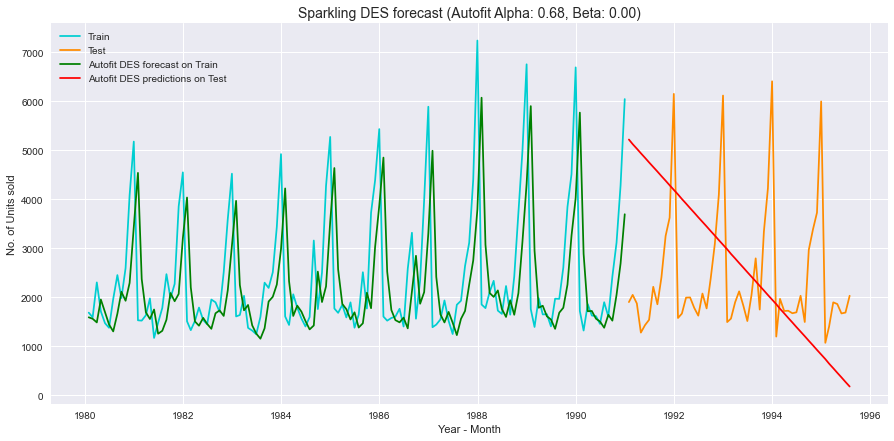

In [ ]:
plt.plot(DES_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(DES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(DES_train['predict_spark',alpha,beta], color = 'green', label='Autofit DES forecast on Train')
plt.plot(DES_test['predict_spark',alpha,beta], color = 'red', label='Autofit DES predictions on Test')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Sparkling DES forecast (Autofit Alpha: 0.68, Beta: 0.00)', fontsize=14)
plt.legend(loc='best')

In [ ]:
rmse_spark_model6_train = metrics.mean_squared_error(DES_train['Sparkling'],DES_train['predict_spark',alpha,beta],squared=False)
mape_spark_model6_train = MAPE(DES_train['Sparkling'],DES_train['predict_spark',alpha,beta])

rmse_spark_model6_test = metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict_spark',alpha,beta],squared=False)
mape_spark_model6_test = MAPE(DES_test['Sparkling'],DES_test['predict_spark',alpha,beta])

resultsDf_6 = resultsDf_6.append({'Alpha':alpha,'Beta':beta,'Train RMSE':rmse_spark_model6_train
                                      ,'Train MAPE': mape_spark_model6_train,'Test RMSE':rmse_spark_model6_test
                                      ,'Test MAPE':mape_spark_model6_test}, ignore_index=True)

In [ ]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.100000,0.1000,1363.47000,44.26,1779.420000,67.23
100,0.688571,0.0001,1349.65046,39.23,2007.238526,68.23
1,0.100000,0.2000,1398.19000,45.61,2601.540000,95.50
10,0.200000,0.1000,1412.03000,46.62,3611.770000,135.41
2,0.100000,0.3000,1431.37000,46.90,4288.430000,155.25


In [ ]:
resultsDf_6.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.100000,0.1000,1363.47000,44.26,1779.420000,67.23
100,0.688571,0.0001,1349.65046,39.23,2007.238526,68.23
1,0.100000,0.2000,1398.19000,45.61,2601.540000,95.50
10,0.200000,0.1000,1412.03000,46.62,3611.770000,135.41
2,0.100000,0.3000,1431.37000,46.90,4288.430000,155.25


##### Auto fitted model shows better RMSE and MAPE in train, but not the best fit in test set

### For Rose Wine

In [ ]:
model_DES_rose = Holt(DES_train['Rose'])

In [ ]:
resultsDf_6_rose = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_rose_alpha_i_j = model_DES_rose.fit(smoothing_level=i,smoothing_trend=j,optimized=True,use_brute=True)
        DES_train['predict_rose',i,j] = model_DES_rose_alpha_i_j.fittedvalues
        DES_test['predict_rose',i,j] = model_DES_rose_alpha_i_j.forecast(len(test['Rose']))

        rmse_rose_model6_train = metrics.mean_squared_error(DES_train['Rose'],DES_train['predict_rose',i,j],squared=False)
        mape_rose_model6_train = MAPE(DES_train['Rose'],DES_train['predict_rose',i,j])

        rmse_rose_model6_test = metrics.mean_squared_error(DES_test['Rose'],DES_test['predict_rose',i,j],squared=False)
        mape_rose_model6_test = MAPE(DES_test['Rose'],DES_test['predict_rose',i,j])

        resultsDf_6_rose = resultsDf_6_rose.append({'Alpha':i,'Beta':j,'Train RMSE':rmse_rose_model6_train
                                      ,'Train MAPE': mape_rose_model6_train,'Test RMSE':rmse_rose_model6_test
                                      ,'Test MAPE':mape_rose_model6_test}, ignore_index=True)

In [ ]:
resultsDf_6_rose.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,32.026565,22.78,37.056911,64.02
1,0.1,0.2,32.685228,23.63,48.806921,83.29
10,0.2,0.1,32.796403,23.06,65.731352,113.20
2,0.1,0.3,32.925494,24.23,78.209401,131.33
20,0.3,0.1,33.528397,23.47,98.653063,170.12


In [ ]:
resultsDf_6_rose.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,32.026565,22.78,37.056911,64.02
1,0.1,0.2,32.685228,23.63,48.806921,83.29
10,0.2,0.1,32.796403,23.06,65.731352,113.20
2,0.1,0.3,32.925494,24.23,78.209401,131.33
3,0.1,0.4,33.179749,24.75,99.554566,165.49


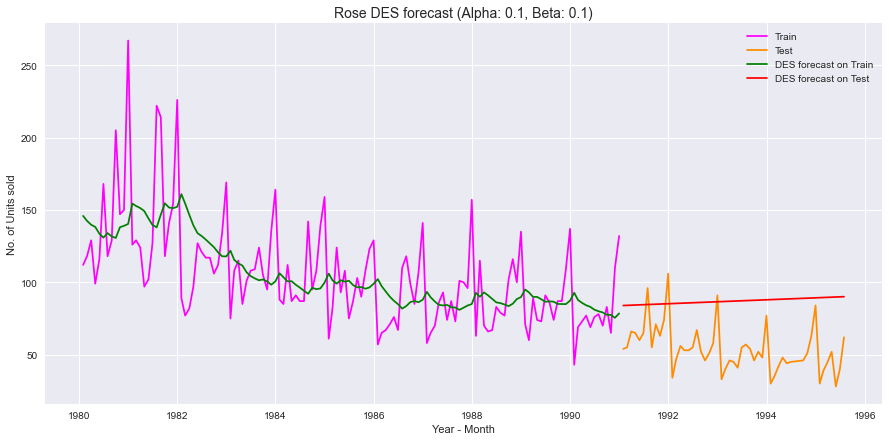

In [ ]:
plt.plot(DES_train['Rose'], label='Train', color = 'magenta')
plt.plot(DES_test['Rose'], label='Test', color = 'darkorange')

plt.plot(DES_train['predict_rose', 0.1, 0.1], color = 'green', label='DES forecast on Train')
plt.plot(DES_test['predict_rose', 0.1, 0.1], color = 'red', label='DES forecast on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose DES forecast (Alpha: 0.1, Beta: 0.1)', fontsize=14)
plt.legend(loc='best')

##### Attempting autofit

In [ ]:
model_DES_rose_autofit = model_DES_rose.fit(optimized=True,use_brute=True)

In [ ]:
model_DES_rose_autofit.params

{'smoothing_level': 0.017549790270679714,
 'smoothing_trend': 3.236153800377395e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 138.82081494774005,
 'initial_trend': -0.492580228245491,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
alpha = model_DES_rose_autofit.params['smoothing_level']
beta = model_DES_rose_autofit.params['smoothing_trend']
alpha_6_2 = alpha
beta_6_2 = beta

In [ ]:
DES_train['predict_rose',alpha,beta] = model_DES_rose_autofit.fittedvalues

In [ ]:
DES_test['predict_rose',alpha,beta] = model_DES_rose_autofit.forecast(len(test['Rose']))

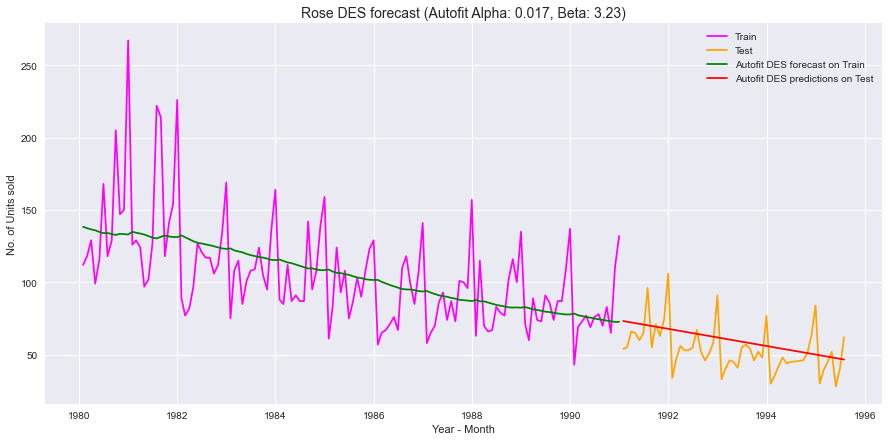

In [ ]:
plt.plot(DES_train['Rose'], label='Train', color = 'magenta')
plt.plot(DES_test['Rose'], label='Test', color = 'orange')

plt.plot(DES_train['predict_rose',alpha,beta], color = 'green', label='Autofit DES forecast on Train')
plt.plot(DES_test['predict_rose',alpha,beta], color = 'red', label='Autofit DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose DES forecast (Autofit Alpha: 0.017, Beta: 3.23)', fontsize=14)

plt.legend(loc='best')

In [ ]:
rmse_rose_model6_train = metrics.mean_squared_error(DES_train['Rose'],DES_train['predict_rose',alpha,beta],squared=False)
mape_rose_model6_train = MAPE(DES_train['Rose'],DES_train['predict_rose',alpha,beta])

rmse_rose_model6_test = metrics.mean_squared_error(DES_test['Rose'],DES_test['predict_rose',alpha,beta],squared=False)
mape_rose_model6_test = MAPE(DES_test['Rose'],DES_test['predict_rose',alpha,beta])

resultsDf_6_rose = resultsDf_6_rose.append({'Alpha':alpha,'Beta':beta,'Train RMSE':rmse_rose_model6_train
                                      ,'Train MAPE': mape_rose_model6_train,'Test RMSE':rmse_rose_model6_test
                                      ,'Test MAPE':mape_rose_model6_test}, ignore_index=True)

In [ ]:
resultsDf_6_rose.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
100,0.01755,0.000032,30.890794,21.61,15.706968,24.12
0,0.10000,0.100000,32.026565,22.78,37.056911,64.02
1,0.10000,0.200000,32.685228,23.63,48.806921,83.29
10,0.20000,0.100000,32.796403,23.06,65.731352,113.20
2,0.10000,0.300000,32.925494,24.23,78.209401,131.33


In [ ]:
resultsDf_6_rose.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
100,0.01755,0.000032,30.890794,21.61,15.706968,24.12
0,0.10000,0.100000,32.026565,22.78,37.056911,64.02
1,0.10000,0.200000,32.685228,23.63,48.806921,83.29
10,0.20000,0.100000,32.796403,23.06,65.731352,113.20
2,0.10000,0.300000,32.925494,24.23,78.209401,131.33


### Model Evaluation

In [ ]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6['Test RMSE'][0],resultsDf_6['Test RMSE'][100]],
                              'Test MAPE': [resultsDf_6['Test MAPE'][0],resultsDf_6['Test MAPE'][100]]}
                           ,index=['DES Alpha 0.1,Beta 0.1','DES Alpha 0.6,Beta 0.0'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_6_1])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


In [ ]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE':[resultsDf_6_rose['Test RMSE'][100],resultsDf_6_rose['Test RMSE'][0]],
                              'Test MAPE':[resultsDf_6_rose['Test MAPE'][100],resultsDf_6_rose['Test MAPE'][0]]}
                           ,index=['DES Alpha 0.017, Beta 3.23','DES Alpha 0.10, Beta 0.10'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_6_1])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


### Model 7: Triple Exponential Smoothing (Holt - Winter's Model)

In [ ]:
TES_train = train.copy()
TES_test = test.copy()

### Sparking Wine

In [ ]:
model_TES = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='multiplicative',freq='M')

In [ ]:
resultsDf_7_1 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        for k in np.arange(0.1,1.1,0.1):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            TES_train['predict_spark',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict_spark',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test['Sparkling']))

            rmse_spark_model7_train = metrics.mean_squared_error(TES_train['Sparkling'],TES_train['predict_spark',i,j,k],squared=False)
            mape_spark_model7_train = MAPE(TES_train['Sparkling'],TES_train['predict_spark',i,j,k])

            rmse_spark_model7_test = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_spark',i,j,k],squared=False)
            mape_spark_model7_test = MAPE(TES_test['Sparkling'],TES_test['predict_spark',i,j,k])

            resultsDf_7_1 = resultsDf_7_1.append({'Alpha':i,'Beta':j,'Gamma':k,'Train RMSE':rmse_spark_model7_train
                                      ,'Train MAPE': mape_spark_model7_train,'Test RMSE':rmse_spark_model7_test
                                      ,'Test MAPE': mape_spark_model7_test}, ignore_index=True)

In [ ]:
resultsDf_7_1.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
301,0.4,0.1,0.2,373.247010,11.04,311.981460,10.18
211,0.3,0.2,0.2,379.165942,11.39,314.337882,10.09
300,0.4,0.1,0.1,370.612639,11.03,318.103484,10.01
402,0.5,0.1,0.3,390.175608,11.54,325.544816,9.99
30,0.1,0.4,0.1,400.768319,11.48,331.257016,10.54


In [ ]:
resultsDf_7_1.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
402,0.5,0.1,0.3,390.175608,11.54,325.544816,9.99
137,0.2,0.4,0.8,469.643089,13.44,337.468727,10.00
300,0.4,0.1,0.1,370.612639,11.03,318.103484,10.01
211,0.3,0.2,0.2,379.165942,11.39,314.337882,10.09
301,0.4,0.1,0.2,373.247010,11.04,311.981460,10.18


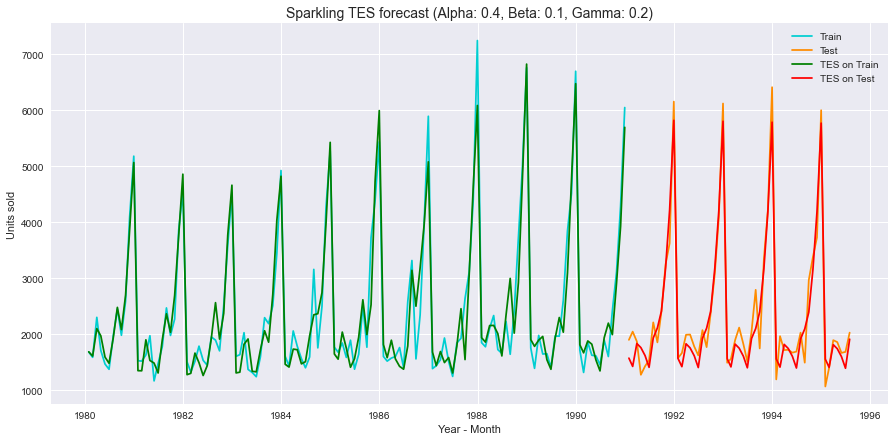

In [ ]:
plt.plot(TES_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(TES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(TES_train['predict_spark', 0.4, 0.1, 0.2], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_spark', 0.4, 0.1, 0.2], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling TES forecast (Alpha: 0.4, Beta: 0.1, Gamma: 0.2)', fontsize=14)

plt.legend(loc='best')

#### Autofit of TES

In [ ]:
model_TES_autofit = model_TES.fit(optimized=True,use_brute=True)


In [ ]:
model_TES_autofit.params


{'smoothing_level': 0.11101523064586813,
 'smoothing_trend': 0.0493150519338607,
 'smoothing_seasonal': 0.3624464792152574,
 'damping_trend': nan,
 'initial_level': 2356.4981157471807,
 'initial_trend': -9.804740061967985,
 'initial_seasons': array([0.71351261, 0.68262962, 0.90447098, 0.80523467, 0.65565848,
        0.65382021, 0.88609683, 1.13334681, 0.91877227, 1.21174825,
        1.87063097, 2.37421776]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
alpha_7_1 = alpha
beta_7_1 = beta
gamma_7_1 = gamma

In [ ]:
TES_train['predict_spark',alpha,beta,gamma] = model_TES_autofit.fittedvalues

In [ ]:
TES_test['predict_spark',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test['Sparkling']))

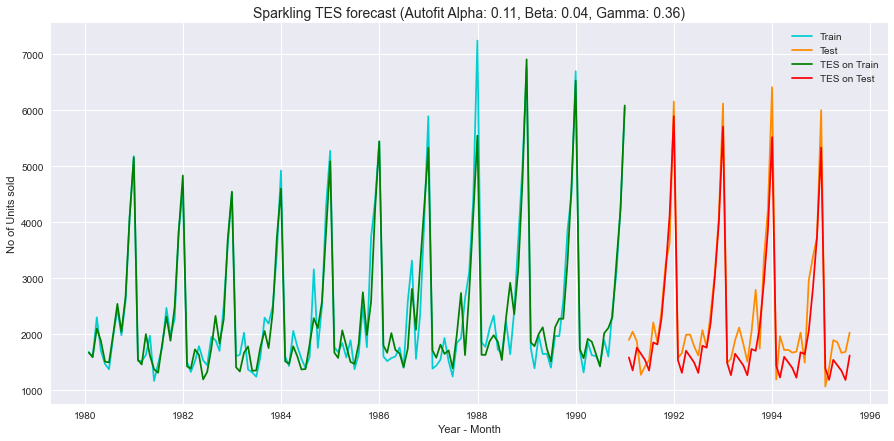

In [ ]:
plt.plot(TES_train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(TES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(TES_train['predict_spark',alpha,beta,gamma], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_spark',alpha,beta,gamma], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')
plt.title('Sparkling TES forecast (Autofit Alpha: 0.11, Beta: 0.04, Gamma: 0.36)', fontsize=14)

plt.legend(loc='best')

In [ ]:
rmse_spark_model7_train = metrics.mean_squared_error(TES_train['Sparkling'],TES_train['predict_spark',alpha,beta,gamma],squared=False)
mape_spark_model7_train = MAPE(TES_train['Sparkling'],TES_train['predict_spark',alpha,beta,gamma])

rmse_spark_model7_test = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_spark',alpha,beta,gamma],squared=False)
mape_spark_model7_test = MAPE(TES_test['Sparkling'],TES_test['predict_spark',alpha,beta,gamma])

resultsDf_7_1 = resultsDf_7_1.append({'Alpha':np.round(alpha,2),'Beta':np.round(beta,2),'Gamma':np.round(gamma,2),'Train RMSE':rmse_spark_model7_train
                                      ,'Train MAPE': mape_spark_model7_train,'Test RMSE':rmse_spark_model7_test
                                      ,'Test MAPE': mape_spark_model7_test}, ignore_index=True)

In [ ]:
resultsDf_7_1.tail()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
996,1.00,1.00,0.70,2.660015e+05,1554.57,8.649577e+06,188660.61
997,1.00,1.00,0.80,1.101923e+06,7348.46,2.700435e+05,5645.84
998,1.00,1.00,0.90,7.695708e+04,1220.71,2.472201e+05,6434.67
999,1.00,1.00,1.00,2.456050e+04,467.65,1.256914e+05,2789.45
1000,0.11,0.05,0.36,3.557657e+02,10.19,4.029385e+02,13.88


In [ ]:
resultsDf_7_1.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
301,0.4,0.1,0.2,373.247010,11.04,311.981460,10.18
211,0.3,0.2,0.2,379.165942,11.39,314.337882,10.09
300,0.4,0.1,0.1,370.612639,11.03,318.103484,10.01
402,0.5,0.1,0.3,390.175608,11.54,325.544816,9.99
30,0.1,0.4,0.1,400.768319,11.48,331.257016,10.54


In [ ]:
resultsDf_7_1.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
402,0.5,0.1,0.3,390.175608,11.54,325.544816,9.99
137,0.2,0.4,0.8,469.643089,13.44,337.468727,10.00
300,0.4,0.1,0.1,370.612639,11.03,318.103484,10.01
211,0.3,0.2,0.2,379.165942,11.39,314.337882,10.09
301,0.4,0.1,0.2,373.247010,11.04,311.981460,10.18


#### For Rose Wine

In [ ]:
model_TES_2 = ExponentialSmoothing(TES_train['Rose'],trend='additive',seasonal='multiplicative',freq='M')

In [ ]:
resultsDf_7_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})

In [ ]:
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        for k in np.arange(0.1,1.1,0.1):
            model_TES_alpha_i_j_k = model_TES_2.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            TES_train['predict_rose',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict_rose',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test['Rose']))

            rmse_rose_model7_train = metrics.mean_squared_error(TES_train['Rose'],TES_train['predict_rose',i,j,k],squared=False)
            mape_rose_model7_train = MAPE(TES_train['Rose'],TES_train['predict_rose',i,j,k])

            rmse_rose_model7_test = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict_rose',i,j,k],squared=False)
            mape_rose_model7_test = MAPE(TES_test['Rose'],TES_test['predict_rose',i,j,k])

            resultsDf_7_2 = resultsDf_7_2.append({'Alpha':i,'Beta':j,'Gamma':k,'Train RMSE':rmse_rose_model7_train
                                      ,'Train MAPE': mape_rose_model7_train,'Test RMSE':rmse_rose_model7_test
                                      ,'Test MAPE': mape_rose_model7_test}, ignore_index=True)

In [ ]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171614,13.19
11,0.1,0.2,0.2,20.140683,14.66,9.493832,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682584,13.71
142,0.2,0.5,0.3,23.300524,17.35,9.885716,14.21
12,0.1,0.2,0.3,20.725703,14.88,9.896169,14.16


In [ ]:
resultsDf_7_2.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171614,13.19
243,0.3,0.5,0.4,25.873405,17.54,10.375047,13.25
223,0.3,0.3,0.4,24.209084,16.78,10.169698,13.67
11,0.1,0.2,0.2,20.140683,14.66,9.493832,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682584,13.71


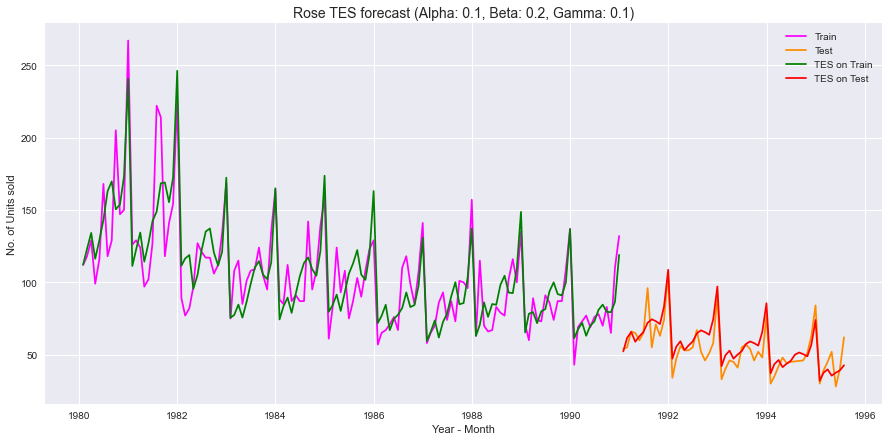

In [ ]:
plt.plot(TES_train['Rose'], label='Train', color = 'magenta')
plt.plot(TES_test['Rose'], label='Test', color = 'darkorange')

plt.plot(TES_train['predict_rose', 0.1, 0.2, 0.1], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_rose', 0.1, 0.2, 0.1], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose TES forecast (Alpha: 0.1, Beta: 0.2, Gamma: 0.1)', fontsize=14)

plt.legend(loc='best')

#### Attempting autofit

In [ ]:
model_TES_autofit = model_TES_2.fit(optimized=True,use_brute=True)

In [ ]:
model_TES_autofit.params

{'smoothing_level': 0.07580378115501289,
 'smoothing_trend': 0.04082731831671567,
 'smoothing_seasonal': 0.0008792861232047841,
 'damping_trend': nan,
 'initial_level': 163.87796236599962,
 'initial_trend': -0.9559811417358383,
 'initial_seasons': array([0.68432572, 0.77587329, 0.84828062, 0.74119702, 0.83386517,
        0.90761668, 0.99838676, 1.06374484, 1.00486364, 0.9847888 ,
        1.14803087, 1.58276201]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
alpha_7_2 = alpha
beta_7_2 = beta
gamma_7_2 = gamma

In [ ]:
TES_train['predict_rose',alpha,beta,gamma] = model_TES_autofit.fittedvalues

TES_test['predict_rose',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test['Rose']))

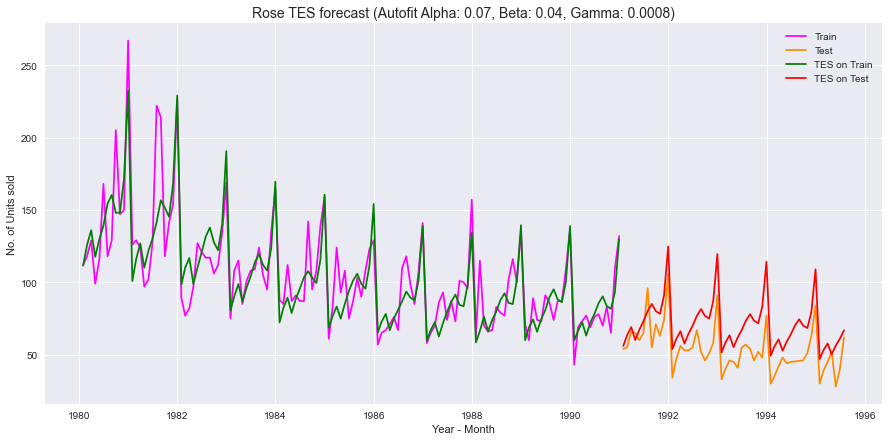

In [ ]:
plt.plot(TES_train['Rose'], label='Train', color = 'magenta')
plt.plot(TES_test['Rose'], label='Test', color = 'darkorange')

plt.plot(TES_train['predict_rose',alpha,beta,gamma], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_rose',alpha,beta,gamma], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose TES forecast (Autofit Alpha: 0.07, Beta: 0.04, Gamma: 0.0008)', fontsize=14)

plt.legend(loc='best')

In [ ]:
rmse_rose_model7_train = metrics.mean_squared_error(TES_train['Rose'],TES_train['predict_rose',alpha,beta,gamma],squared=False)
mape_rose_model7_train = MAPE(TES_train['Rose'],TES_train['predict_rose',alpha,beta,gamma])

rmse_rose_model7_test = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict_rose',alpha,beta,gamma],squared=False)
mape_rose_model7_test = MAPE(TES_test['Rose'],TES_test['predict_rose',alpha,beta,gamma])

resultsDf_7_2 = resultsDf_7_2.append({'Alpha':alpha,'Beta':beta,'Gamma':gamma,'Train RMSE':rmse_rose_model7_train
                                      ,'Train MAPE': mape_rose_model7_train,'Test RMSE':rmse_rose_model7_test
                                      ,'Test MAPE': mape_rose_model7_test}, ignore_index=True)

In [ ]:
resultsDf_7_2.tail()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
996,1.000000,1.000000,0.700000,3091.001599,890.00,9721.144050,13046.06
997,1.000000,1.000000,0.800000,2438.212926,628.69,2573.842682,1998.89
998,1.000000,1.000000,0.900000,28835.801098,3026.25,3522.899085,2624.26
999,1.000000,1.000000,1.000000,1577.905281,583.77,3104.659378,3720.26
1000,0.075804,0.040827,0.000879,18.412945,12.61,19.396863,32.29


In [ ]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171614,13.19
11,0.1,0.2,0.2,20.140683,14.66,9.493832,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682584,13.71
142,0.2,0.5,0.3,23.300524,17.35,9.885716,14.21
12,0.1,0.2,0.3,20.725703,14.88,9.896169,14.16


In [ ]:
resultsDf_7_2.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171614,13.19
243,0.3,0.5,0.4,25.873405,17.54,10.375047,13.25
223,0.3,0.3,0.4,24.209084,16.78,10.169698,13.67
11,0.1,0.2,0.2,20.140683,14.66,9.493832,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682584,13.71


#### Model Evaluation

In [ ]:
resultsDf_7_sp = pd.DataFrame({'Test RMSE': [resultsDf_7_1['Test RMSE'][301],resultsDf_7_1['Test RMSE'][1000]],
                              'Test MAPE': [resultsDf_7_1['Test MAPE'][301],resultsDf_7_1['Test MAPE'][1000]]}
                           ,index=['TES Alpha 0.4, Beta 0.1, Gamma 0.2','TES Alpha 0.11, Beta 0.04, Gamma 0.036'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_7_sp])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


In [ ]:
spark_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.4, Beta 0.1, Gamma 0.2",311.981460,10.18
"TES Alpha 0.11, Beta 0.04, Gamma 0.036",402.938530,13.88
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
SimpleAverage,1275.081804,38.90
6 point TMA,1283.927428,43.86
SES Alpha 0.00,1316.035487,45.47
9 point TMA,1346.278315,46.86
Regression On Time,1389.135175,50.15
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23


In [ ]:
resultsDf_7_ro = pd.DataFrame({'Test RMSE': [resultsDf_7_2['Test RMSE'][11],resultsDf_7_2['Test RMSE'][1000]],
                              'Test MAPE': [resultsDf_7_2['Test MAPE'][11],resultsDf_7_2['Test MAPE'][1000]]}
                           ,index=['TES Alpha 0.1, Beta 0.2, Gamma 0.1','TES Alpha 0.07, Beta 0.04, Gamma 0.0008'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_7_ro])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


In [ ]:
rose_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.1, Beta 0.2, Gamma 0.1",9.493832,13.68
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
Regression On Time,15.268885,22.82
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"TES Alpha 0.07, Beta 0.04, Gamma 0.0008",19.396863,32.29
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


Text(0.5, 1.0, 'SPARKLING : Forecast Vs Actual Test set')

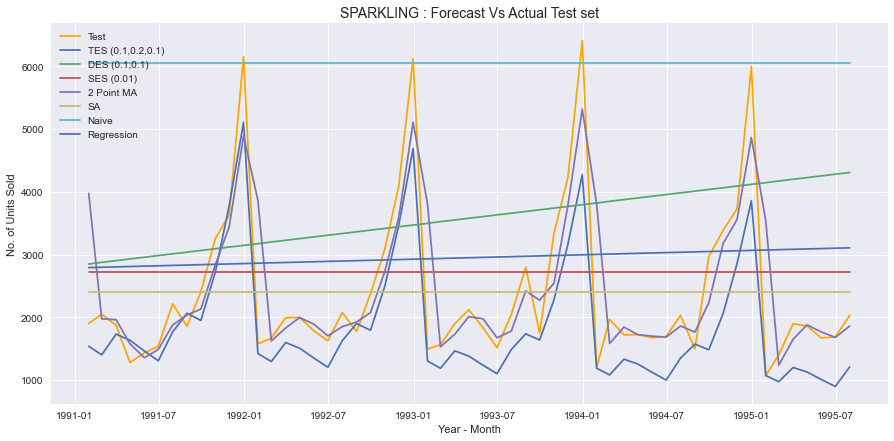

In [ ]:
plt.plot(TES_test['Sparkling'], label='Test', color = 'orange')
#TES
plt.plot(TES_test['predict_spark',0.1,0.2,0.1],  label='TES (0.1,0.2,0.1)')
#DES
plt.plot(DES_test['predict_spark',0.1,0.1],  label='DES (0.1,0.1)')
#SES
plt.plot(SES_test['predict_spark'],  label='SES (0.01)')
#MA
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'],  label='2 Point MA')
#SA
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SA')
#Naive
plt.plot(NaiveModel_test['spark_naive'], label='Naive')
#Regression
plt.plot(LinearRegression_test['RegOnTime_spark'], label='Regression')

plt.legend(loc='upper left')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units Sold')
plt.title('SPARKLING : Forecast Vs Actual Test set', fontsize=14)

KeyError: ('predict_rose', 0.017, 3.23)

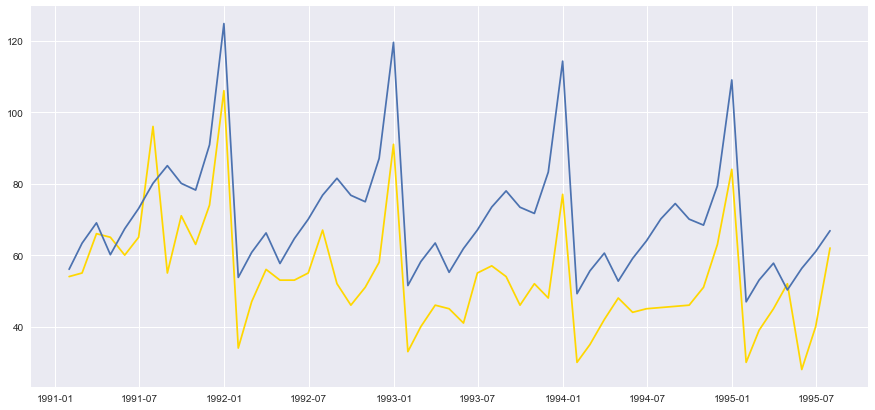

In [ ]:

plt.plot(TES_test['Rose'], label='Test', color = 'gold')

#TES
plt.plot(TES_test['predict_rose',alpha_7_2,beta_7_2,gamma_7_2],  label='TES (0.1, 0.2, 0.1)')
#DES
plt.plot(DES_test['predict_rose',0.017,3.23],  label='DES (0.017, 3.23)')
#SES
plt.plot(SES_test['predict_rose'],  label='SES (0.1)')
#MA
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'],  label='2 Point MA')
#SA
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SA')
#Naive
plt.plot(NaiveModel_test['rose_naive'], label='Naive')
#Regression
plt.plot(LinearRegression_test['RegOnTime_rose'], label='Regression')

plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Sales of Rose')
plt.title('ROSE : Forecast Vs Actual Test Data', fontsize=14)

Text(0.5, 1.0, 'ROSE : Forecast Vs Actual Test Data')

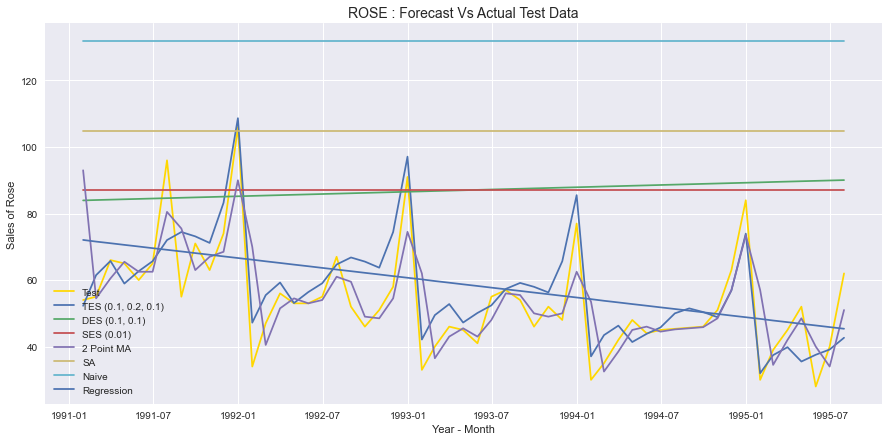

In [ ]:
plt.plot(TES_test['Rose'], label='Test', color = 'gold')

#TES
plt.plot(TES_test['predict_rose',0.1,0.2,0.1],  label='TES (0.1, 0.2, 0.1)')
#DES
plt.plot(DES_test['predict_rose',0.1,0.1],  label='DES (0.1, 0.1)')
#SES
plt.plot(SES_test['predict_rose'],  label='SES (0.01)')
#MA
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'],  label='2 Point MA')
#SA
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SA')
#Naive
plt.plot(NaiveModel_test['rose_naive'], label='Naive')
#Regression
plt.plot(LinearRegression_test['RegOnTime_rose'], label='Regression')

plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Sales of Rose')
plt.title('ROSE : Forecast Vs Actual Test Data', fontsize=14)

#### Checking for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

In [ ]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries, color):


    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color=color,label='Observed')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

#### Sparkling
#### Original series

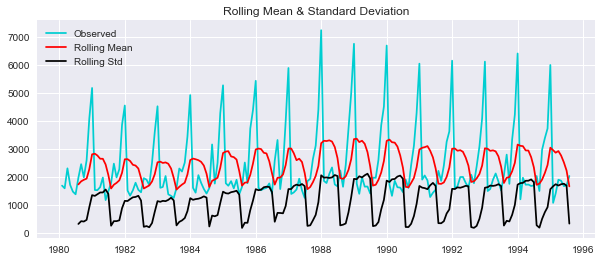

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(df['Sparkling'],'darkturquoise')


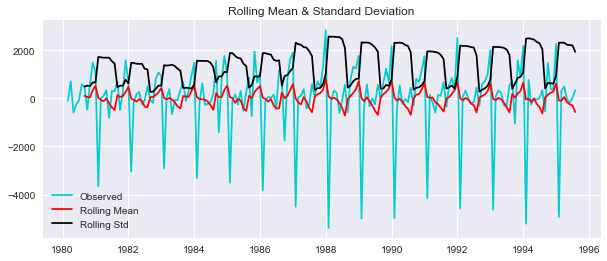

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(df['Sparkling'].diff().dropna(),'darkturquoise')

#### Difference of original series

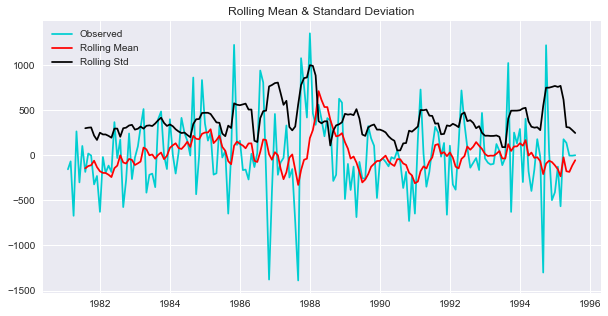

Results of Dickey-Fuller Test:
Test Statistic                  -4.460165
p-value                          0.000232
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity(df['Sparkling'].diff(12).dropna(), 'darkturquoise')

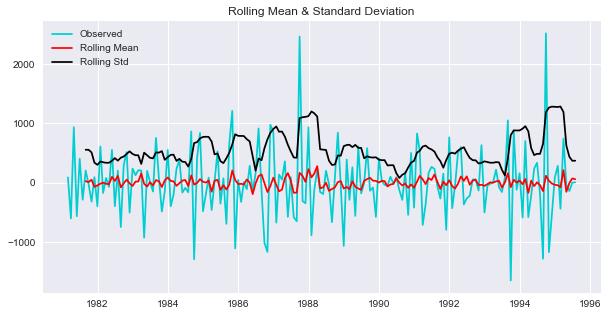

Results of Dickey-Fuller Test:
Test Statistic                  -5.113533
p-value                          0.000013
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity((df['Sparkling'].diff(12).dropna()).diff().dropna(), 'darkturquoise')

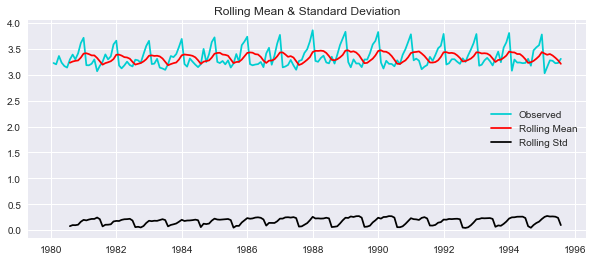

Results of Dickey-Fuller Test:
Test Statistic                  -1.749630
p-value                          0.405740
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(np.log10(df['Sparkling']), 'darkturquoise')

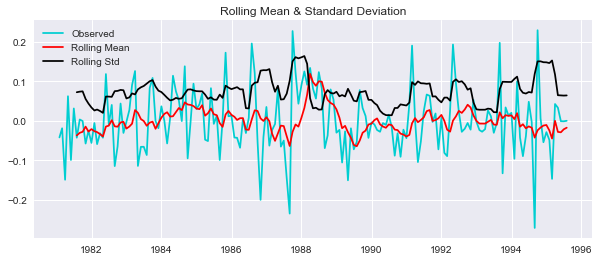

Results of Dickey-Fuller Test:
Test Statistic                  -5.183811
p-value                          0.000009
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(np.log10(df['Sparkling']).diff(12).dropna(),  'darkturquoise')

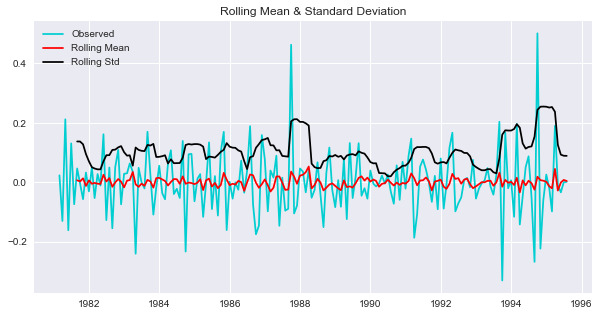

Results of Dickey-Fuller Test:
Test Statistic                  -5.254601
p-value                          0.000007
#Lags Used                      12.000000
Number of Observations Used    161.000000
Critical Value (1%)             -3.471633
Critical Value (5%)             -2.879665
Critical Value (10%)            -2.576434
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity((np.log10(df['Sparkling']).diff(12).dropna()).diff().dropna(),  'darkturquoise')

#### Rose Wine

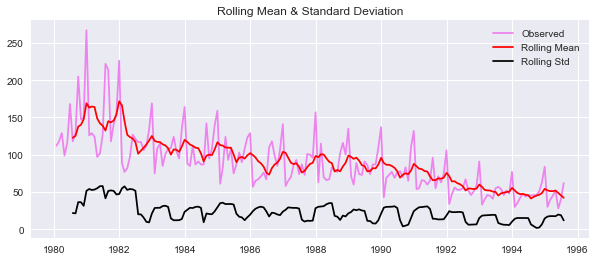

Results of Dickey-Fuller Test:
Test Statistic                  -1.876719
p-value                          0.343091
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(df['Rose'], 'violet')

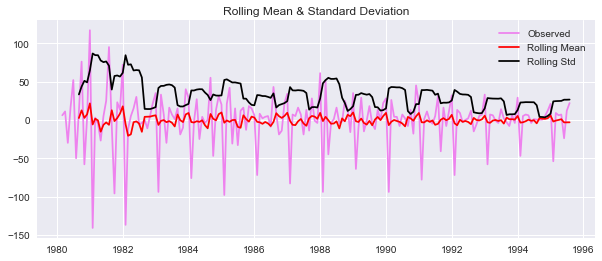

Results of Dickey-Fuller Test:
Test Statistic                -8.044395e+00
p-value                        1.810868e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(df['Rose'].diff().dropna(), 'violet')

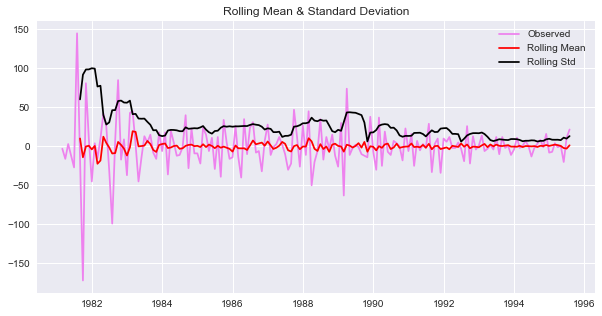

Results of Dickey-Fuller Test:
Test Statistic                  -4.605732
p-value                          0.000126
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity((df['Rose'].diff(12).dropna()).diff().dropna(), 'violet')

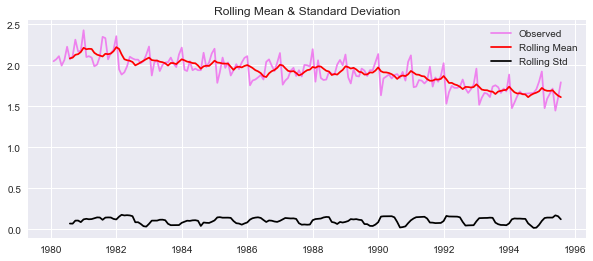

Results of Dickey-Fuller Test:
Test Statistic                  -0.422555
p-value                          0.906264
#Lags Used                      12.000000
Number of Observations Used    174.000000
Critical Value (1%)             -3.468502
Critical Value (5%)             -2.878298
Critical Value (10%)            -2.575704
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity(np.log10(df['Rose']), 'violet')

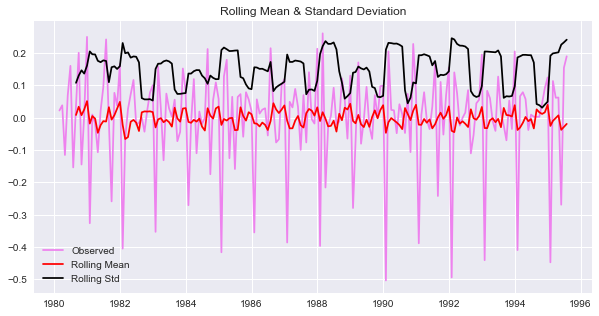

Results of Dickey-Fuller Test:
Test Statistic                -8.669696e+00
p-value                        4.581847e-14
#Lags Used                     1.100000e+01
Number of Observations Used    1.740000e+02
Critical Value (1%)           -3.468502e+00
Critical Value (5%)           -2.878298e+00
Critical Value (10%)          -2.575704e+00
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity(np.log10(df['Rose']).diff().dropna(), 'violet')

#### Autocorrelation and the Partial Autocorrelation function plots on the whole data.

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

### Sparkling
### ACF Plots

<Figure size 720x360 with 0 Axes>

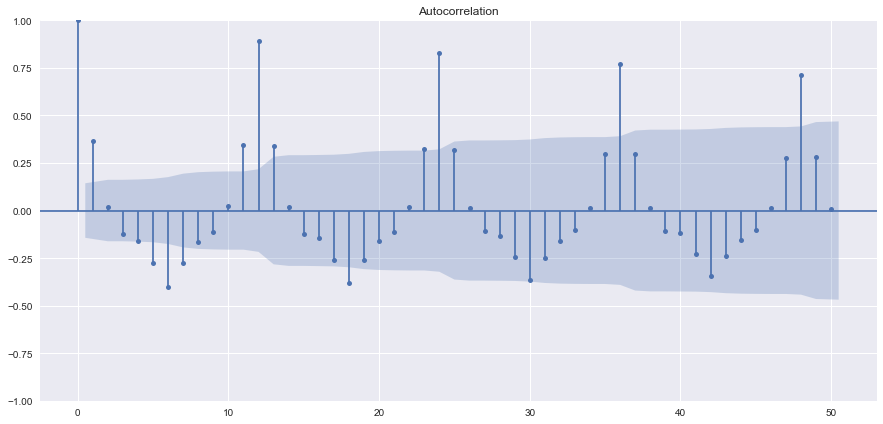

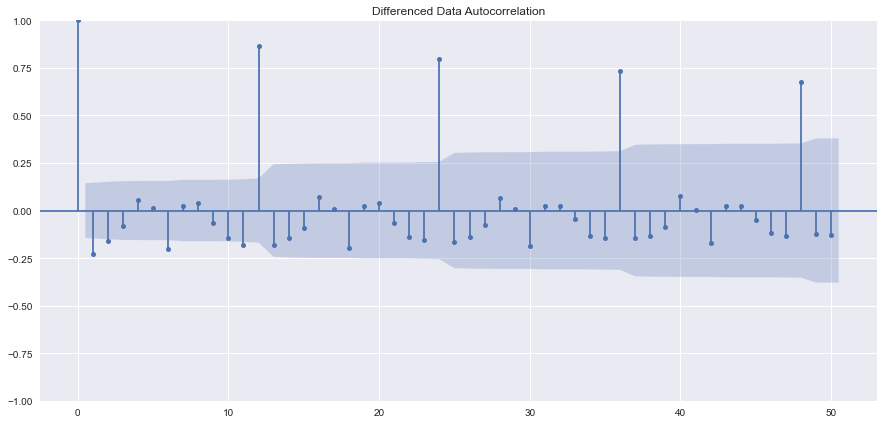

In [ ]:
plt.figure(figsize=(10,5))
plot_acf(df['Sparkling'],lags=50)
plot_acf(df['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

### PACF Plots

<Figure size 720x360 with 0 Axes>

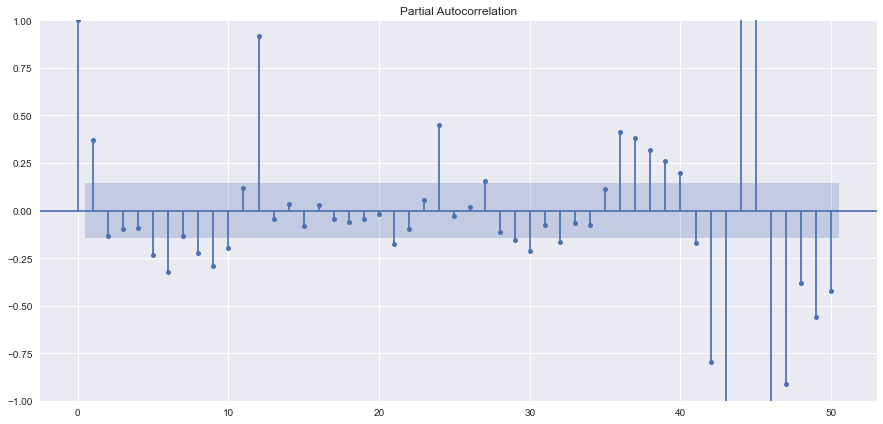

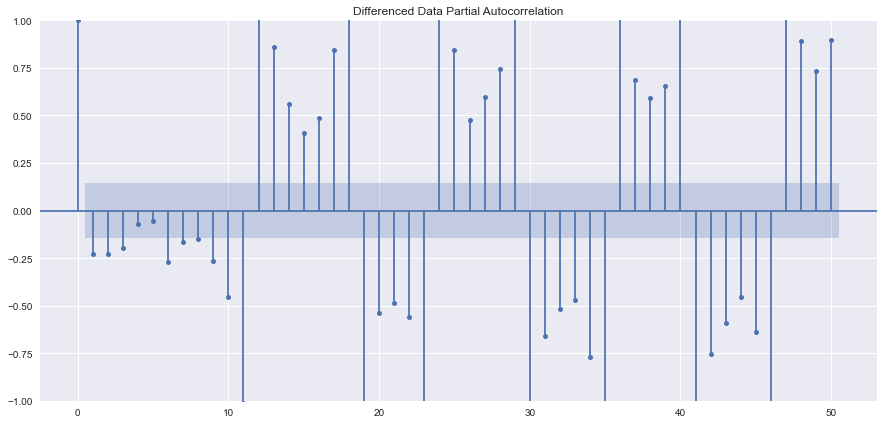

In [ ]:
plt.figure(figsize=(10,5))
plot_pacf(df['Sparkling'],lags=50)
plot_pacf(df['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

### Rose

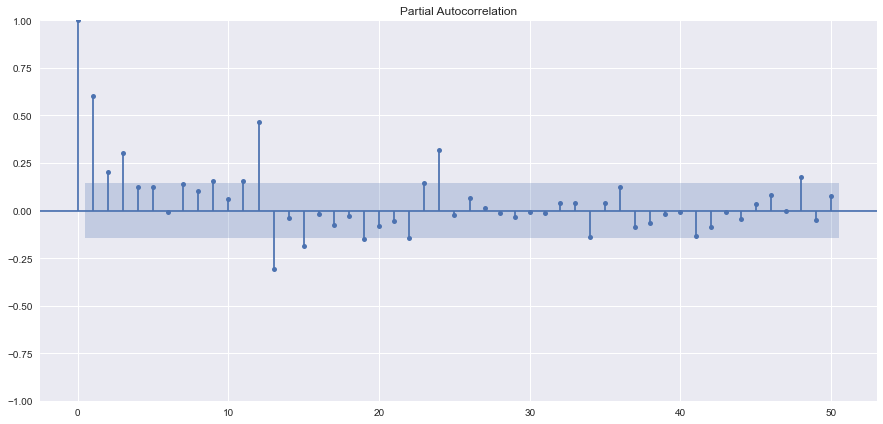

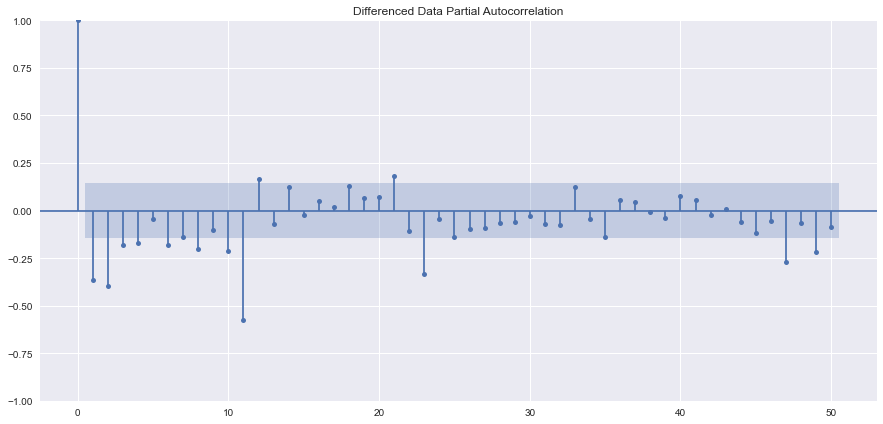

In [ ]:
plot_pacf(df['Rose'],lags=50)
plot_pacf(df['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

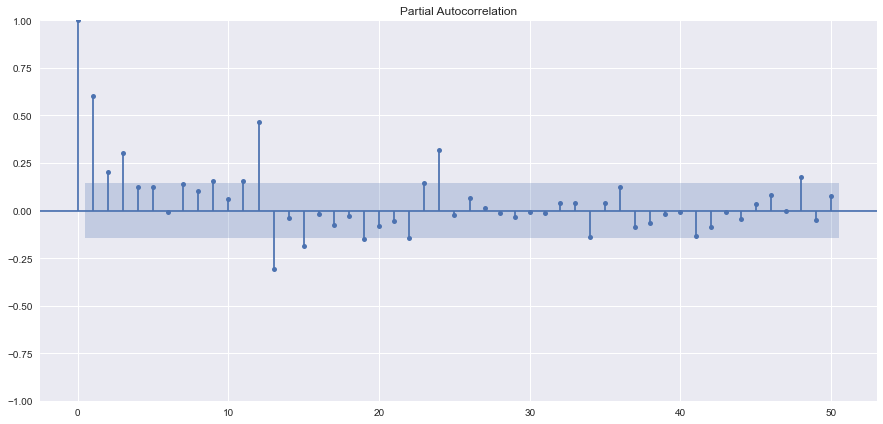

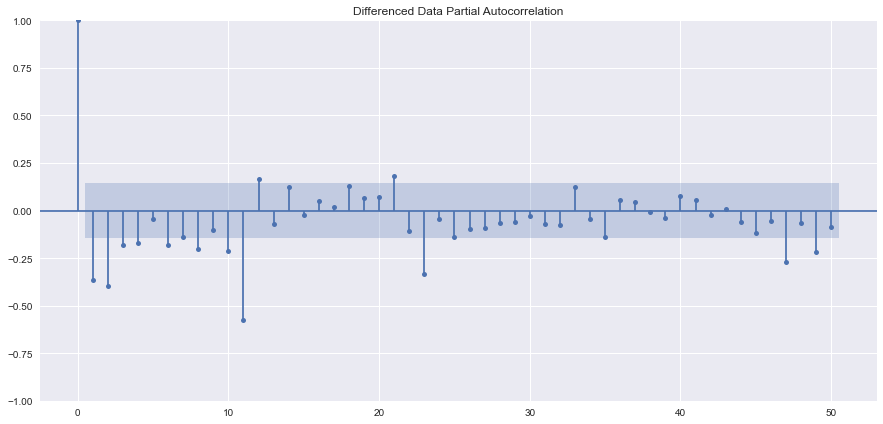

In [ ]:
plot_pacf(df['Rose'],lags=50)
plot_pacf(df['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

### Model 8: SARIMA - SPARKLING

In [ ]:
SARIMA_train = train.copy()
SARIMA_test = test.copy()

### Build an Automated version of a SARIMA model for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC).
### AUTO SARIMA on original data

In [ ]:
import itertools
p = q = range(0,4)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (0, 1, 3)(0, 1, 3, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (1, 1, 3)(1, 1, 3, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)
Model: (2, 1, 3)(2, 1, 3, 12)
Model: (3, 1, 0)(3, 1, 0, 12)
Model: (3, 1, 1)(3, 1, 1, 12)
Model: (3, 1, 2)(3, 1, 2, 12)
Model: (3, 1, 3)(3, 1, 3, 12)


In [ ]:
SARIMA_AIC_spark = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_spark

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA_spark = SARIMA_model_spark.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_spark.aic))
        SARIMA_AIC_spark = SARIMA_AIC_spark.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_spark.aic}, ignore_index=True)

SARIMA(0, 0, 0)x(0, 0, 0, 12)7 - AIC:2447.5387828489993
SARIMA(0, 0, 0)x(0, 0, 1, 12)7 - AIC:2094.7855992116274
SARIMA(0, 0, 0)x(0, 0, 2, 12)7 - AIC:1815.830464427013
SARIMA(0, 0, 0)x(0, 1, 0, 12)7 - AIC:1786.4850411919438
SARIMA(0, 0, 0)x(0, 1, 1, 12)7 - AIC:1596.2586002542678
SARIMA(0, 0, 0)x(0, 1, 2, 12)7 - AIC:1428.1357423138486
SARIMA(0, 0, 0)x(1, 0, 0, 12)7 - AIC:1802.3841958898233
SARIMA(0, 0, 0)x(1, 0, 1, 12)7 - AIC:1765.9902957951824
SARIMA(0, 0, 0)x(1, 0, 2, 12)7 - AIC:1602.650852865457
SARIMA(0, 0, 0)x(1, 1, 0, 12)7 - AIC:1615.0445907515473
SARIMA(0, 0, 0)x(1, 1, 1, 12)7 - AIC:1598.2582087358621
SARIMA(0, 0, 0)x(1, 1, 2, 12)7 - AIC:1429.736216740776
SARIMA(0, 0, 0)x(2, 0, 0, 12)7 - AIC:1616.3804986882144
SARIMA(0, 0, 0)x(2, 0, 1, 12)7 - AIC:1612.0535874419477
SARIMA(0, 0, 0)x(2, 0, 2, 12)7 - AIC:1596.0861886574096
SARIMA(0, 0, 0)x(2, 1, 0, 12)7 - AIC:1441.2182003596358
SARIMA(0, 0, 0)x(2, 1, 1, 12)7 - AIC:1443.0752316169996
SARIMA(0, 0, 0)x(2, 1, 2, 12)7 - AIC:1429.132845275

KeyboardInterrupt: 

In [ ]:
SARIMA_AIC_spark.sort_values(by=['AIC']).head()

,param,seasonal,AIC
252,"(3,1,3)","(3,1,0,12)",1213.282561
253,"(3,1,3)","(3,1,1,12)",1215.213337
220,"(3,1,1)","(3,1,0,1,12)",1215.898777
254,"(3,1,3)","(3,1,2,12)",1216.479994
236,"(3,1,2)","(3,1,0,12)",1216.859179


In [ ]:
SARIMA_AIC_spark.sort_values(by=['AIC']).tail()

,param,seasonal,AIC
171,"(2, 1, 2)","(2, 1, 3, 12)",5300.797472
103,"(1, 1, 2)","(1, 1, 3, 12)",5837.111852
7,"(0, 1, 0)","(1, 1, 3, 12)",5858.193269
151,"(2, 1, 1)","(1, 1, 3, 12)",5916.520905
135,"(2, 1, 0)","(1, 1, 3, 12)",5990.627056


In [ ]:
auto_SARIMA_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                order=(3, 1, 3),
                                seasonal_order=(3, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_spark = auto_SARIMA_spark.fit(maxiter=1000)
print(results_auto_SARIMA_spark.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  132
Model:             SARIMAX(3, 1, 3)x(3, 1, [], 12)   Log Likelihood                -596.641
Date:                             Mon, 07 Feb 2022   AIC                           1213.283
Time:                                     10:09:42   BIC                           1237.103
Sample:                                          0   HQIC                          1222.833
                                             - 132                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6138      0.176     -9.175      0.000      -1.958      -1.269
ar.L2         -0.6116      

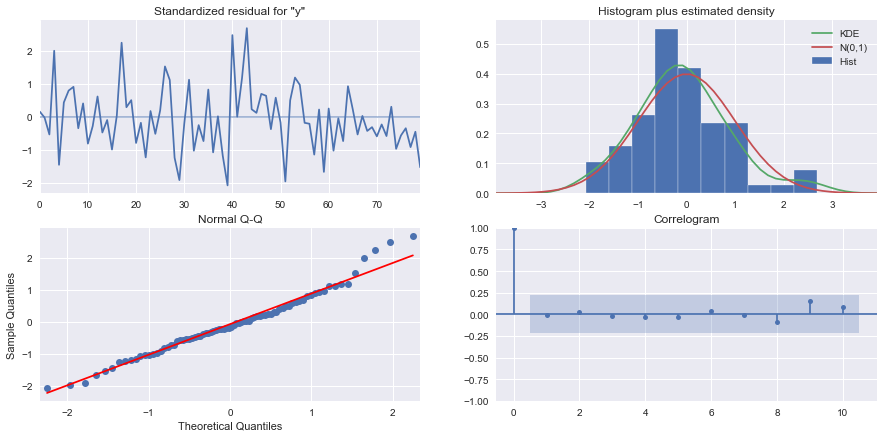

In [ ]:
results_auto_SARIMA_spark.plot_diagnostics()
plt.show()

In [ ]:
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted,rose_log_auto_forecasted,rose_manual_forecasted,rose_log_manual_forecasted
YearMonth,,,,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137,53.448902,44.733041,52.616352
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964,61.318892,64.208694,61.527444
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091,66.136162,65.110689,64.750476
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708,60.304767,68.453063,61.210918
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645,64.819832,61.423433,66.195818


In [ ]:
pred_dynamic = results_auto_SARIMA_spark.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_spark = results_auto_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']), alpha=0.05)

In [ ]:
predicted_auto_SARIMA_spark.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1430.791480,431.172743,585.708433,2275.874526
1,1540.574479,458.383035,642.160239,2438.988718
2,1707.861319,460.154837,805.974411,2609.748227
3,1859.150183,466.712246,944.410989,2773.889377
4,1501.984520,467.013568,586.654746,2417.314293


In [ ]:
spark_forecasted = pred_dynamic.predicted_mean
SARIMA_test['spark_forecasted'] = predicted_auto_SARIMA_spark.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted,rose_log_auto_forecasted,rose_manual_forecasted,rose_log_manual_forecasted
YearMonth,,,,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137,53.448902,44.733041,52.616352
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964,61.318892,64.208694,61.527444
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091,66.136162,65.110689,64.750476
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708,60.304767,68.453063,61.210918
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645,64.819832,61.423433,66.195818


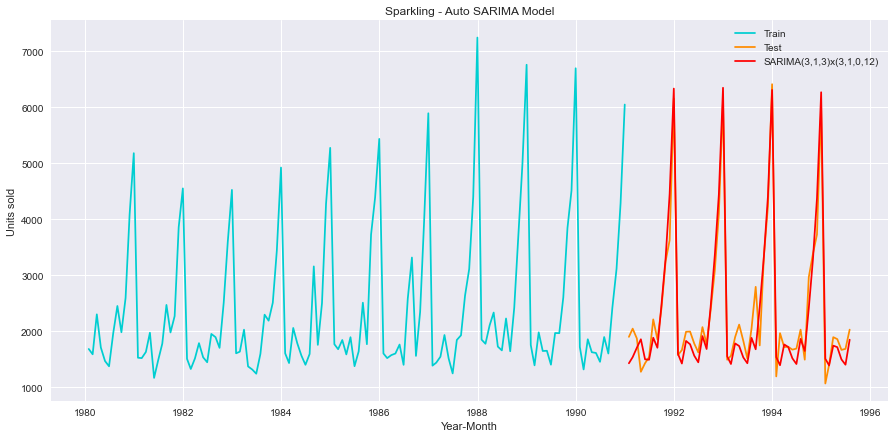

In [ ]:
plt.plot(train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['spark_forecasted'], color='red', label='SARIMA(3,1,3)x(3,1,0,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Sparkling - Auto SARIMA Model')
plt.legend(loc='best')

In [ ]:
rmse_spark_model8_test = metrics.mean_squared_error(test['Sparkling'],SARIMA_test['spark_forecasted'],squared=False)
mape_spark_model8_test = MAPE(test['Sparkling'],SARIMA_test['spark_forecasted'])
print("For SARIMA forecast on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model8_test, mape_spark_model8_test))

For SARIMA forecast on the Sparkling Testing Data:  RMSE is 331.586 and MAPE is 10.33


In [ ]:
resultsDf_8_spark1 = pd.DataFrame({'Test RMSE': [rmse_spark_model8_test],'Test MAPE': [mape_spark_model8_test]},index=['Auto SARIMA(3,1,3)x(3,1,0,12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_spark1])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


#### AUTO SARIMA on Log(Sparkling)

In [ ]:
spark_log_train = np.log10(SARIMA_train['Sparkling'])


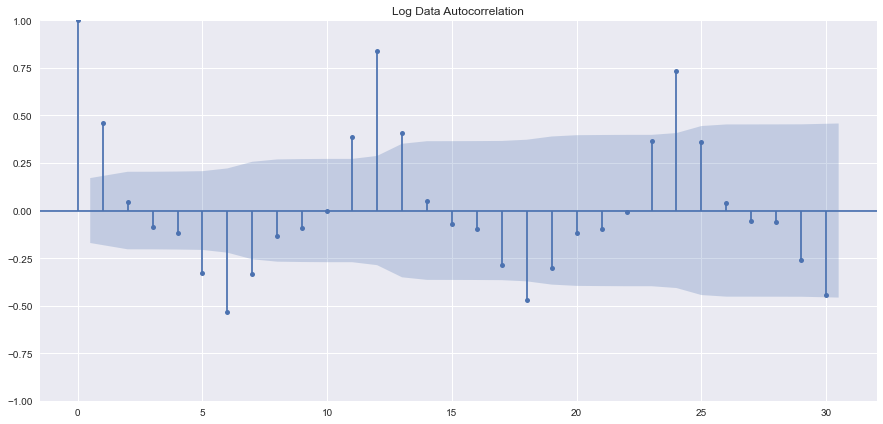

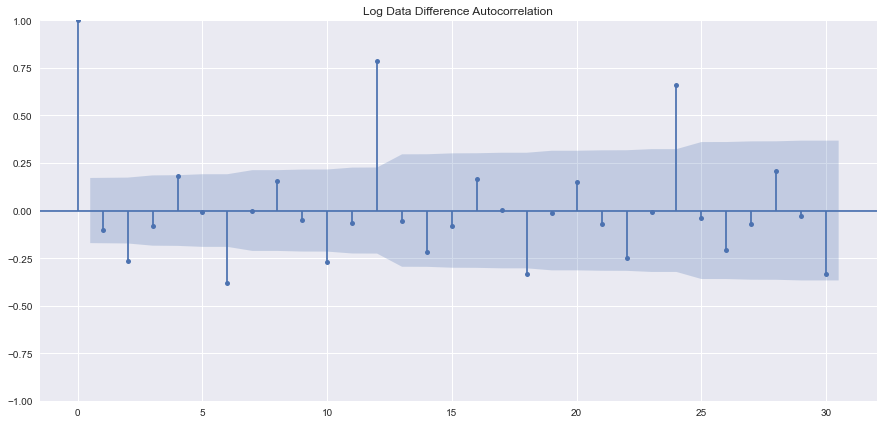

In [ ]:
plot_acf(spark_log_train,lags=30,title='Log Data Autocorrelation')
plot_acf(spark_log_train.diff().dropna(),lags=30,title='Log Data Difference Autocorrelation')
plt.show()

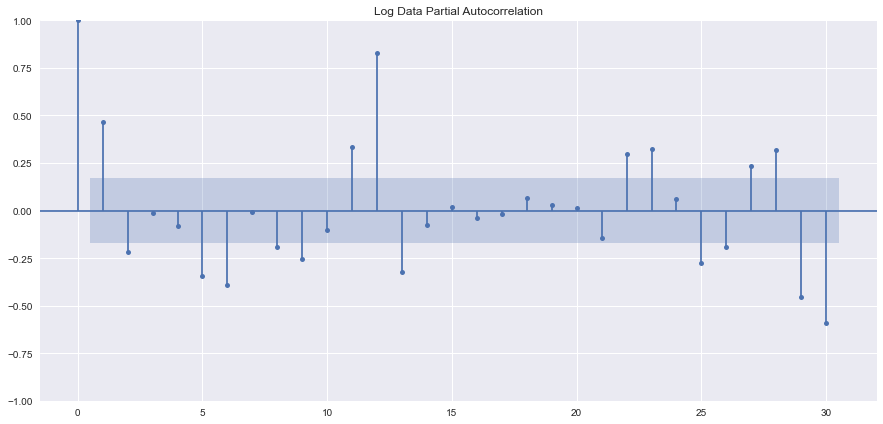

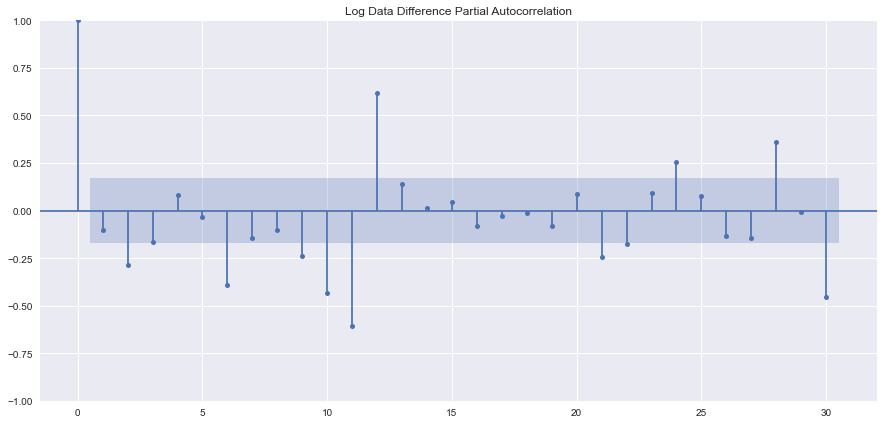

In [ ]:
plot_pacf(spark_log_train,lags=30,title='Log Data Partial Autocorrelation')
plot_pacf(spark_log_train.diff().dropna(),lags=30,title='Log Data Difference Partial Autocorrelation')
plt.show()

#### We see that there can be a seasonality of 12. We will run our auto SARIMA models by setting seasonality as 12.

In [ ]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Some parameter combinations for Model')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Some parameter combinations for Model
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [ ]:
SARIMA_AIC_spark_log = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_spark_log

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_spark_log = sm.tsa.statespace.SARIMAX(spark_log_train,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA_spark_log = SARIMA_model_spark_log.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_spark_log.aic))
        SARIMA_AIC_spark_log = SARIMA_AIC_spark_log.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_spark_log.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12)7 - AIC:-57.22316326227245
SARIMA(0, 1, 0)x(0, 0, 1, 12)7 - AIC:-122.81829469978429
SARIMA(0, 1, 0)x(0, 0, 2, 12)7 - AIC:-137.07304219597538
SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:-209.91064502657775
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:-205.210408069403
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:-175.11378237935855
SARIMA(0, 1, 0)x(1, 0, 0, 12)7 - AIC:-217.95527734168542
SARIMA(0, 1, 0)x(1, 0, 1, 12)7 - AIC:-225.1904718295891
SARIMA(0, 1, 0)x(1, 0, 2, 12)7 - AIC:-197.4132854244058
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:-200.40913589961724
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:-196.67576097043738
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:-173.2889255288647
SARIMA(0, 1, 0)x(2, 0, 0, 12)7 - AIC:-201.15491722200653
SARIMA(0, 1, 0)x(2, 0, 1, 12)7 - AIC:-199.30580283357406
SARIMA(0, 1, 0)x(2, 0, 2, 12)7 - AIC:-198.5990030923874
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:-177.22797543082524
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:-175.23566708682182
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:-

In [ ]:
SARIMA_AIC_spark_log.sort_values(by=['AIC']).head()

,param,seasonal,AIC
25,"(0, 1, 1)","(1, 0, 1, 12)",-284.472032
79,"(1, 1, 1)","(1, 0, 1, 12)",-282.517335
43,"(0, 1, 2)","(1, 0, 1, 12)",-281.567996
97,"(1, 1, 2)","(1, 0, 1, 12)",-279.611723
133,"(2, 1, 1)","(1, 0, 1, 12)",-278.288227


In [ ]:
import statsmodels.api as sm

auto_SARIMA_spark_log = sm.tsa.statespace.SARIMAX(spark_log_train,
                                order=(0, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_spark_log = auto_SARIMA_spark_log.fit(maxiter=1000)
print(results_auto_SARIMA_spark_log.summary())


                                     SARIMAX Results                                      
Dep. Variable:                          Sparkling   No. Observations:                  132
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 12)   Log Likelihood                 146.236
Date:                            Sat, 05 Feb 2022   AIC                           -284.472
Time:                                    22:03:44   BIC                           -273.423
Sample:                                01-31-1980   HQIC                          -279.986
                                     - 12-31-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8966      0.045    -19.861      0.000      -0.985      -0.808
ar.S.L12       1.0112      0.020   

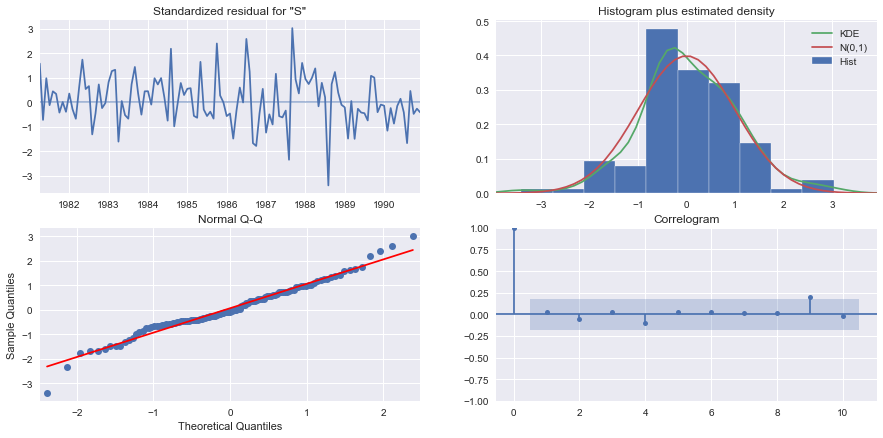

In [ ]:
results_auto_SARIMA_spark_log.plot_diagnostics()
plt.show()

#### Predict on the Test Set using this model

In [ ]:
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted
YearMonth,,,
1991-01-31,1902,54.0,1430.791480
1991-02-28,2049,55.0,1540.574479
1991-03-31,1874,66.0,1707.861319
1991-04-30,1279,65.0,1859.150183
1991-05-31,1432,60.0,1501.984520


In [ ]:
pred_dynamic = results_auto_SARIMA_spark_log.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_spark_log = results_auto_SARIMA_spark_log.get_forecast(steps=len(SARIMA_test['Sparkling']), alpha=0.1)

In [ ]:
predicted_auto_SARIMA_spark_log.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,3.212033,0.067109,3.080501,3.343564
1991-02-28,3.141303,0.067466,3.009073,3.273534
1991-03-31,3.256285,0.067822,3.123357,3.389213
1991-04-30,3.226729,0.068176,3.093107,3.360351
1991-05-31,3.195788,0.068528,3.061476,3.330100


In [ ]:

spark_log_forecasted = pred_dynamic.predicted_mean
SARIMA_test['spark_log_forecasted'] = np.power(10, predicted_auto_SARIMA_spark_log.predicted_mean)
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted
YearMonth,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186
1991-02-28,2049,55.0,1540.574479,1384.532399
1991-03-31,1874,66.0,1707.861319,1804.202164
1991-04-30,1279,65.0,1859.150183,1685.500780
1991-05-31,1432,60.0,1501.984520,1569.595887


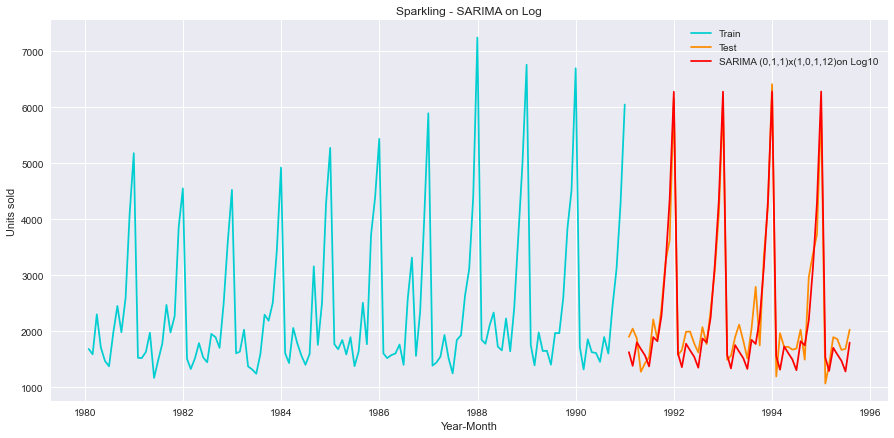

In [ ]:
plt.plot(train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['spark_log_forecasted'], color='red', label='SARIMA (0,1,1)x(1,0,1,12)on Log10')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Sparkling - SARIMA on Log')
plt.legend(loc='best')

In [ ]:
rmse_spark_model8_test = metrics.mean_squared_error(test['Sparkling'],SARIMA_test['spark_log_forecasted'],squared=False)
mape_spark_model8_test = MAPE(test['Sparkling'],SARIMA_test['spark_log_forecasted'])
print("For SARIMA forecast on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model8_test, mape_spark_model8_test))

For SARIMA forecast on the Sparkling Testing Data:  RMSE is 336.796 and MAPE is 11.18


In [ ]:
resultsDf_8_spark2 = pd.DataFrame({'Test RMSE': [rmse_spark_model8_test],'Test MAPE': [mape_spark_model8_test]},index=['Auto SARIMA(0,1,1)x(1,0,1,12)-Log10'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_spark2])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


### Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

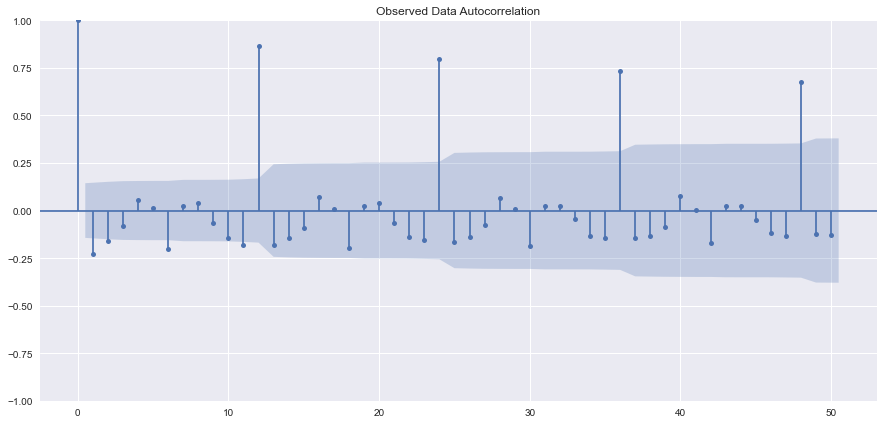

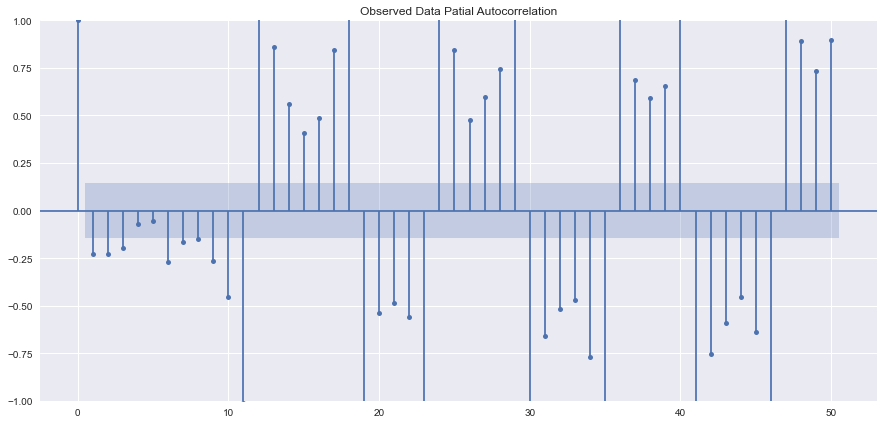

In [ ]:
plot_acf(df['Sparkling'].diff().dropna(),lags=50,title='Observed Data Autocorrelation')
plot_pacf(df['Sparkling'].diff().dropna(),lags=50,title='Observed Data Patial Autocorrelation')
plt.show()

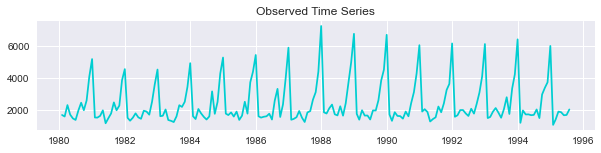

In [ ]:
plt.figure(figsize=(10,2))
plt.plot(df['Sparkling'], color = 'darkturquoise')
plt.title ('Observed Time Series')

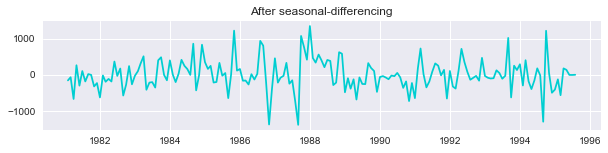

In [ ]:
plt.figure(figsize=(10,2))
plt.plot(df['Sparkling'].diff(12).dropna(), color = 'darkturquoise')
plt.title ('After seasonal-differencing')

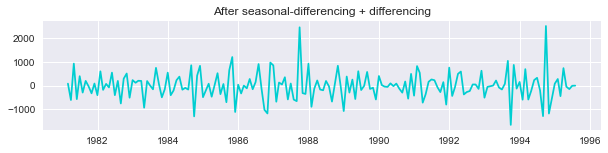

In [ ]:
plt.figure(figsize=(10,2))
plt.plot((df['Sparkling'].diff(12).dropna()).diff().dropna(),  color = 'darkturquoise')
plt.title ('After seasonal-differencing + differencing')

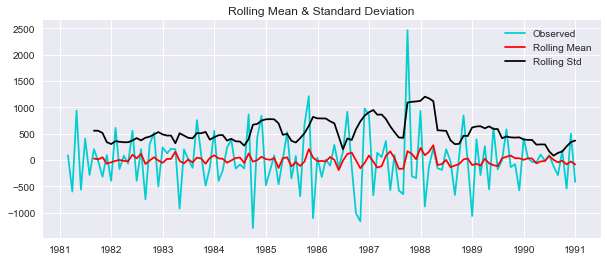

Results of Dickey-Fuller Test:
Test Statistic                  -3.342905
p-value                          0.013066
#Lags Used                      10.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity((SARIMA_train['Sparkling'].diff(12).dropna()).diff().dropna(), 'darkturquoise')

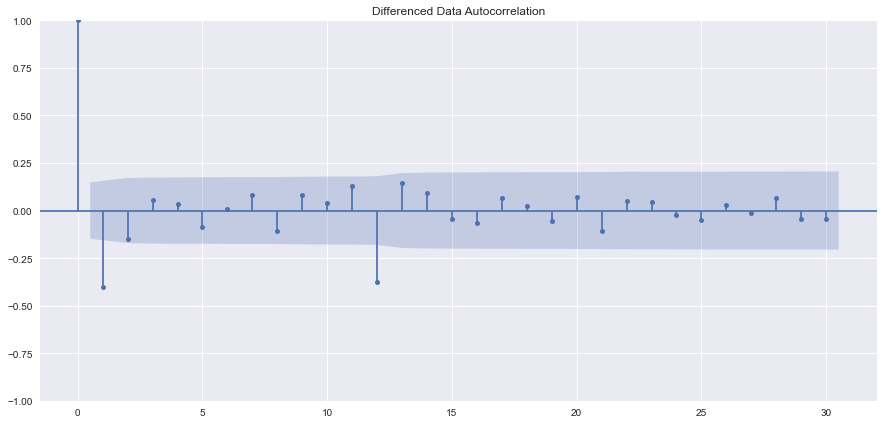

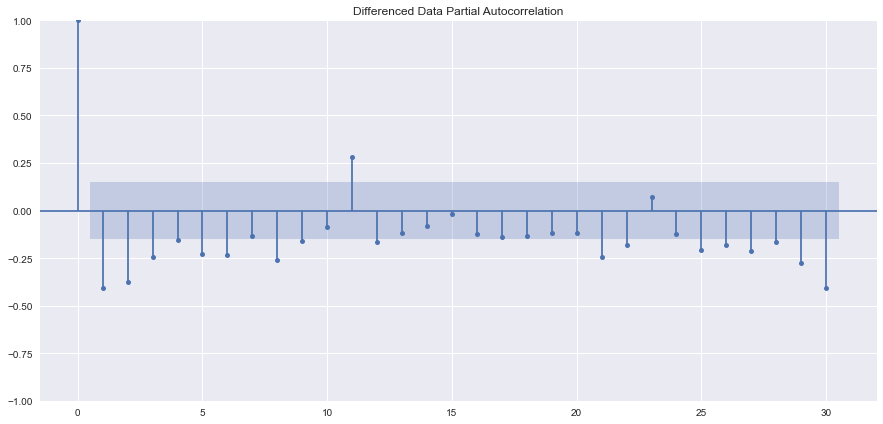

In [ ]:
plot_acf((df['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Autocorrelation')
plot_pacf((df['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Partial Autocorrelation')

In [ ]:
import statsmodels.api as sm

manual_SARIMA_spark = sm.tsa.statespace.SARIMAX(train['Sparkling'].values,
                                order=(3, 1, 1),#(3, 1, 1),
                                seasonal_order= (1, 1, 2, 12),#(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_spark = manual_SARIMA_spark.fit(maxiter=1000)
print(results_manual_SARIMA_spark.summary())
print("Model Summary-SARIMA (3,1,3)X(3,1,0,12)")

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                -693.697
Date:                                 Mon, 07 Feb 2022   AIC                           1403.394
Time:                                         09:48:21   BIC                           1423.654
Sample:                                              0   HQIC                          1411.574
                                                 - 132                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2229      0.130      1.713      0.087      -0.032       0

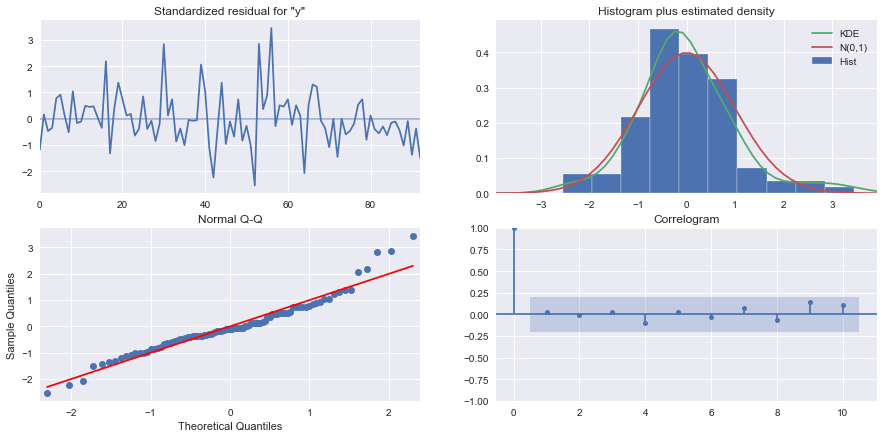

In [ ]:
results_manual_SARIMA_spark.plot_diagnostics()
plt.show()

In [ ]:
pred_dynamic = results_manual_SARIMA_spark.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_manual_SARIMA_spark = results_manual_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']), alpha=0.5)

In [ ]:
predicted_manual_SARIMA_spark.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1579.910007,416.594424,763.399941,2396.420074
1,1419.154375,429.113818,578.106746,2260.202003
2,1868.144076,429.104459,1027.114791,2709.173361
3,1731.472129,430.973118,886.780339,2576.163919
4,1659.822533,431.906099,813.302135,2506.342931


In [ ]:
spark_manual_forecasted = pred_dynamic.predicted_mean
SARIMA_test['spark_manual_forecasted'] = predicted_manual_SARIMA_spark.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted
YearMonth,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533


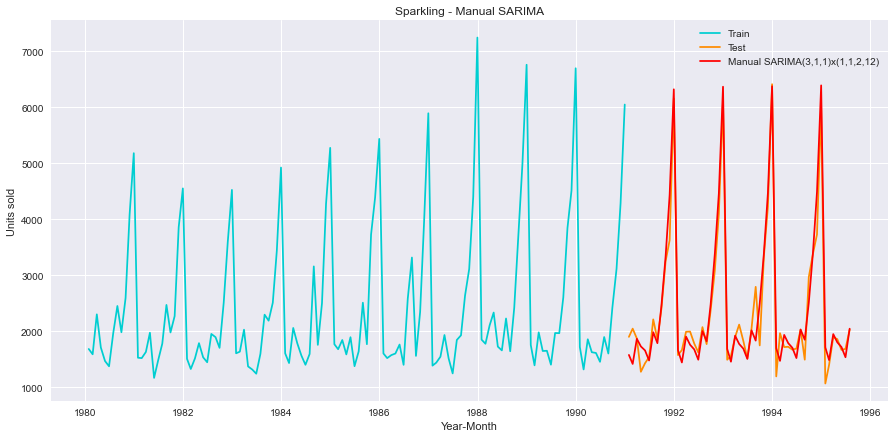

In [ ]:
plt.plot(train['Sparkling'], label='Train', color = 'darkturquoise')
plt.plot(test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['spark_manual_forecasted'], color='red', label='Manual SARIMA(3,1,1)x(1,1,2,12)')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Sparkling - Manual SARIMA')
plt.legend(loc='best')

In [ ]:
rmse_spark_model8_test = metrics.mean_squared_error(test['Sparkling'],SARIMA_test['spark_manual_forecasted'],squared=False)
mape_spark_model8_test = MAPE(test['Sparkling'],SARIMA_test['spark_manual_forecasted'])
print("For SARIMA forecast on the Sparkling Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model8_test, mape_spark_model8_test))

For SARIMA forecast on the Sparkling Testing Data:  RMSE is 324.107 and MAPE is 9.48


In [ ]:
resultsDf_8_spark3 = pd.DataFrame({'Test RMSE': [rmse_spark_model8_test],'Test MAPE': [mape_spark_model8_test]},index=['Manual SARIMA(3,1,1)x(1,1,2,12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_spark3])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


### Model 8 - SARIMA on ROSE Wine

#### Automated version of a SARIMA model for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC).
#### Original ROSE data

In [ ]:
import itertools
p = q = range(0,4)
d = range(1,2)
D = range(1,2)


pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (0, 1, 3)(0, 1, 3, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (1, 1, 3)(1, 1, 3, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)
Model: (2, 1, 3)(2, 1, 3, 12)
Model: (3, 1, 0)(3, 1, 0, 12)
Model: (3, 1, 1)(3, 1, 1, 12)
Model: (3, 1, 2)(3, 1, 2, 12)
Model: (3, 1, 3)(3, 1, 3, 12)


In [ ]:
SARIMA_AIC_rose = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_rose

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA_rose = SARIMA_model_rose.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose.aic))
        SARIMA_AIC_rose = SARIMA_AIC_rose.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_rose.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:1171.2013438279514
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:965.5057301621102
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:845.8687014776037
SARIMA(0, 1, 0)x(0, 1, 3, 12)7 - AIC:3365.688534295341
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:982.3269589658807
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:975.3375383601602
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:847.733218265448
SARIMA(0, 1, 0)x(1, 1, 3, 12)7 - AIC:3315.148147669504
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:858.5132698374416
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:853.339072914358
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:842.6282244222538
SARIMA(0, 1, 0)x(2, 1, 3, 12)7 - AIC:2312.5874023880265
SARIMA(0, 1, 0)x(3, 1, 0, 12)7 - AIC:752.3958122739762
SARIMA(0, 1, 0)x(3, 1, 1, 12)7 - AIC:748.3165246489946
SARIMA(0, 1, 0)x(3, 1, 2, 12)7 - AIC:748.9721713372096
SARIMA(0, 1, 0)x(3, 1, 3, 12)7 - AIC:3477.259152077564
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:1113.766313356333
SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:915.0730606717374
SARIMA(0, 

KeyboardInterrupt: 

In [ ]:
SARIMA_AIC_rose.sort_values(by=['AIC']).head()

,param,seasonal,AIC
99,"(1, 1, 2)","(0, 1, 3, 12)",14.000000
43,"(0, 1, 2)","(2, 1, 3, 12)",16.000000
91,"(1, 1, 1)","(2, 1, 3, 12)",16.000000
107,"(1, 1, 2)","(2, 1, 3, 12)",18.000000
47,"(0, 1, 2)","(3, 1, 3, 12)",84.255419


In [ ]:
auto_SARIMA_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                order=(3, 1, 1),
                                seasonal_order=(3, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_rose = auto_SARIMA_rose.fit(maxiter=1000)
print(results_auto_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(3, 1, 1, 12)   Log Likelihood                -331.681
Date:                            Sat, 05 Feb 2022   AIC                            681.363
Time:                                    23:56:09   BIC                            702.801
Sample:                                         0   HQIC                           689.958
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0171      0.151      0.113      0.910      -0.279       0.313
ar.L2         -0.0427      0.141   

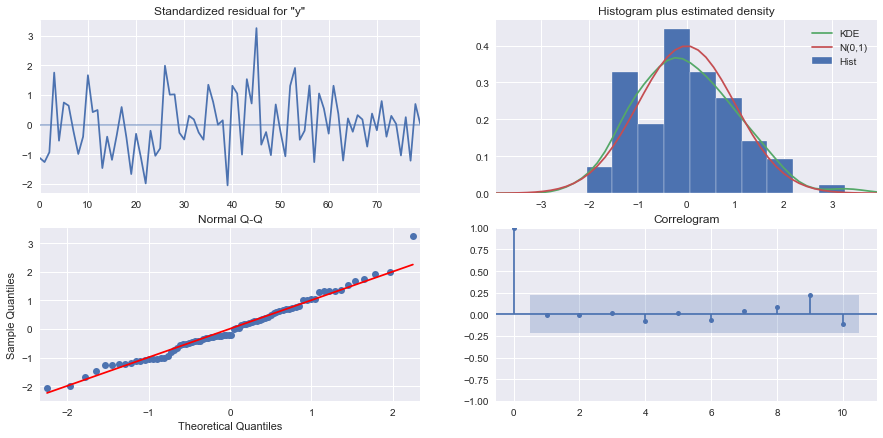

In [ ]:
results_auto_SARIMA_rose.plot_diagnostics()
plt.show()

In [ ]:
pred_dynamic = results_auto_SARIMA_rose.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_rose = results_auto_SARIMA_rose.get_forecast(steps=len(SARIMA_test['Rose']), alpha=0.05)

In [ ]:
predicted_auto_SARIMA_rose.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,45.229137,14.459295,16.889440,73.568833
1,63.052964,14.504070,34.625510,91.480418
2,68.118091,14.454103,39.788570,96.447613
3,61.824708,14.450336,33.502570,90.146847
4,68.436645,14.470908,40.074188,96.799103


In [ ]:
rose_forecasted = pred_dynamic.predicted_mean
SARIMA_test['rose_auto_forecasted'] = predicted_auto_SARIMA_rose.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted
YearMonth,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645


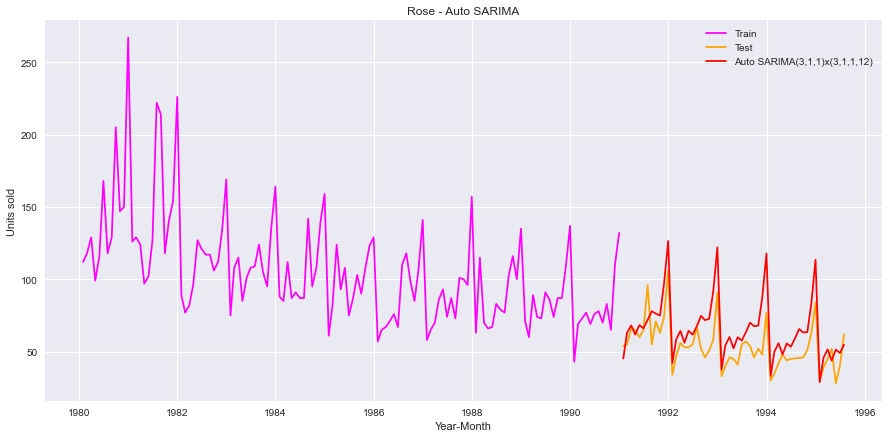

In [ ]:
plt.plot(train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')

plt.plot(SARIMA_test['rose_auto_forecasted'], color='red', label='Auto SARIMA(3,1,1)x(3,1,1,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Auto SARIMA')
plt.legend(loc='best')

In [ ]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_auto_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_auto_forecasted'])
print("For SARIMA forecast on the SRose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the SRose Testing Data:  RMSE is 16.823 and MAPE is 25.48


In [ ]:
resultsDf_8_rose1 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Auto SARIMA(3,1,1)x(3,1,1,12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose1])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


### AUTO SARIMA ON LOG(ROSE)

In [ ]:
rose_log_train = np.log10(SARIMA_train['Rose'])

In [ ]:
import itertools
p = q = range(0, 3)
d= range(0,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 0, 1)(0, 0, 1, 12)
Model: (0, 0, 2)(0, 0, 2, 12)
Model: (0, 1, 0)(0, 1, 0, 12)
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (1, 0, 0)(1, 0, 0, 12)
Model: (1, 0, 1)(1, 0, 1, 12)
Model: (1, 0, 2)(1, 0, 2, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (2, 0, 0)(2, 0, 0, 12)
Model: (2, 0, 1)(2, 0, 1, 12)
Model: (2, 0, 2)(2, 0, 2, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)


In [ ]:
SARIMA_AIC_rose_log = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_rose_log

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA_rose_log = SARIMA_model_rose_log.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose_log.aic))
        SARIMA_AIC_rose_log = SARIMA_AIC_rose_log.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_rose_log.aic}, ignore_index=True)

SARIMA(0, 0, 0)x(0, 0, 0, 12)7 - AIC:555.7706618310567
SARIMA(0, 0, 0)x(0, 0, 1, 12)7 - AIC:380.7976958405474
SARIMA(0, 0, 0)x(0, 0, 2, 12)7 - AIC:253.02210408794198
SARIMA(0, 0, 0)x(0, 1, 0, 12)7 - AIC:-203.8690585880142
SARIMA(0, 0, 0)x(0, 1, 1, 12)7 - AIC:-207.30753067775314
SARIMA(0, 0, 0)x(0, 1, 2, 12)7 - AIC:-200.3749101416422
SARIMA(0, 0, 0)x(1, 0, 0, 12)7 - AIC:-214.78669155250248
SARIMA(0, 0, 0)x(1, 0, 1, 12)7 - AIC:-256.17028103208605
SARIMA(0, 0, 0)x(1, 0, 2, 12)7 - AIC:-233.1445326662878
SARIMA(0, 0, 0)x(1, 1, 0, 12)7 - AIC:-209.00182479539552
SARIMA(0, 0, 0)x(1, 1, 1, 12)7 - AIC:-206.62380291142412
SARIMA(0, 0, 0)x(1, 1, 2, 12)7 - AIC:-198.50588487035787
SARIMA(0, 0, 0)x(2, 0, 0, 12)7 - AIC:-233.48304581147525
SARIMA(0, 0, 0)x(2, 0, 1, 12)7 - AIC:-233.82264953371393
SARIMA(0, 0, 0)x(2, 0, 2, 12)7 - AIC:-238.64163634257275
SARIMA(0, 0, 0)x(2, 1, 0, 12)7 - AIC:-201.4914449430335
SARIMA(0, 0, 0)x(2, 1, 1, 12)7 - AIC:-203.4992557680455
SARIMA(0, 0, 0)x(2, 1, 2, 12)7 - AIC:-199

In [ ]:
SARIMA_AIC_rose_log.sort_values(by=['AIC']).head()

,param,seasonal,AIC
115,"(1, 0, 0)","(1, 0, 1, 12)",-257.620750
7,"(0, 0, 0)","(1, 0, 1, 12)",-256.170281
133,"(1, 0, 1)","(1, 0, 1, 12)",-255.482061
25,"(0, 0, 1)","(1, 0, 1, 12)",-254.978844
223,"(2, 0, 0)","(1, 0, 1, 12)",-253.620649


In [ ]:
auto_SARIMA_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
                                order=(1, 0, 0),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_rose_log = auto_SARIMA_rose_log.fit(maxiter=1000)
print(results_auto_SARIMA_rose_log.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                 Rose   No. Observations:                  132
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 12)   Log Likelihood                 132.810
Date:                              Sun, 06 Feb 2022   AIC                           -257.621
Time:                                      00:13:20   BIC                           -246.504
Sample:                                  01-31-1980   HQIC                          -253.107
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1689      0.078      2.179      0.029       0.017       0.321
ar.S.L12       0.98

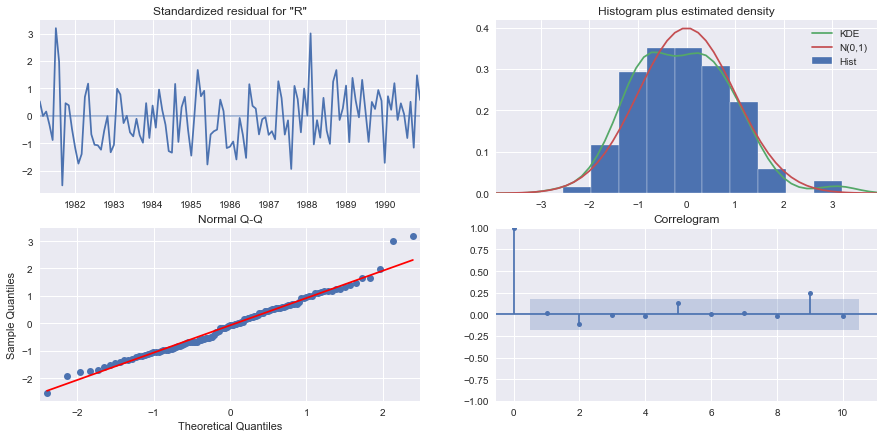

In [ ]:
results_auto_SARIMA_rose_log.plot_diagnostics()
plt.show()


In [ ]:
pred_dynamic = results_auto_SARIMA_rose_log.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_rose_log = results_auto_SARIMA_rose_log.get_forecast(steps=len(SARIMA_test['Rose']), alpha=0.05)

In [ ]:
predicted_auto_SARIMA_rose_log.summary_frame(alpha=0.05).head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,1.727939,0.073895,1.583108,1.872769
1991-02-28,1.787594,0.074681,1.641222,1.933966
1991-03-31,1.820439,0.074703,1.674023,1.966855
1991-04-30,1.780352,0.074704,1.633934,1.926769
1991-05-31,1.811708,0.074704,1.665291,1.958125


In [ ]:

rose_log_forecasted = pred_dynamic.predicted_mean

SARIMA_test['rose_log_auto_forecasted'] = np.power(10, predicted_auto_SARIMA_rose_log.predicted_mean)
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted,rose_log_auto_forecasted
YearMonth,,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137,53.448902
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964,61.318892
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091,66.136162
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708,60.304767
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645,64.819832


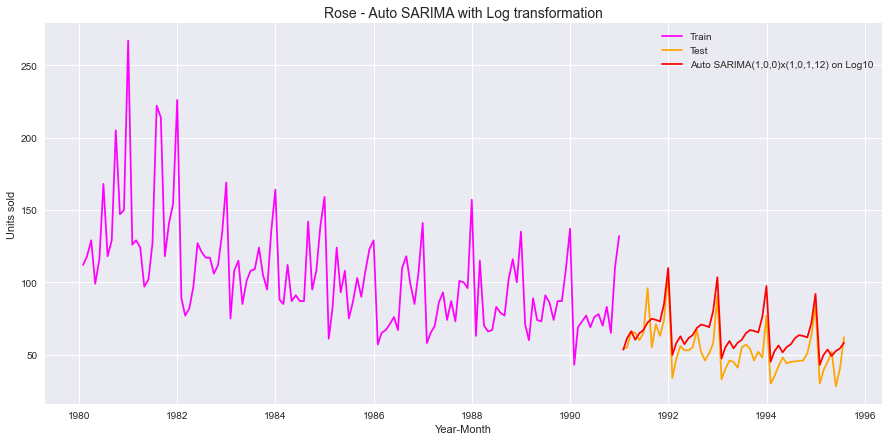

In [ ]:
plt.plot(train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')

plt.plot(SARIMA_test['rose_log_auto_forecasted'], color='red', label='Auto SARIMA(1,0,0)x(1,0,1,12) on Log10')

plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Auto SARIMA with Log transformation', fontsize=14)

plt.legend(loc='best')

In [ ]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_log_auto_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_log_auto_forecasted'])
print("For SARIMA forecast on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the Rose Testing Data:  RMSE is 13.591 and MAPE is 21.92


In [ ]:
resultsDf_8_rose2 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Auto SARIMA(1,0,0)x(1,0,1,12)-Log10'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


#### Manual SARIMA on Rose Wine

##### SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots.

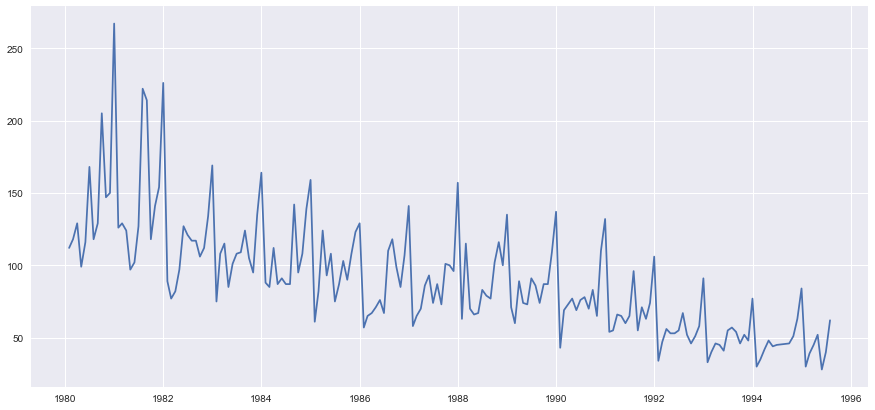

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(df['Rose'])

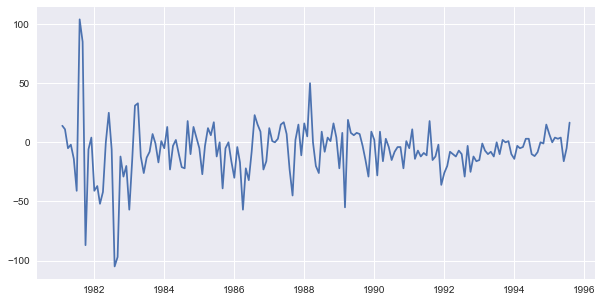

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(df['Rose'].diff(12).dropna())

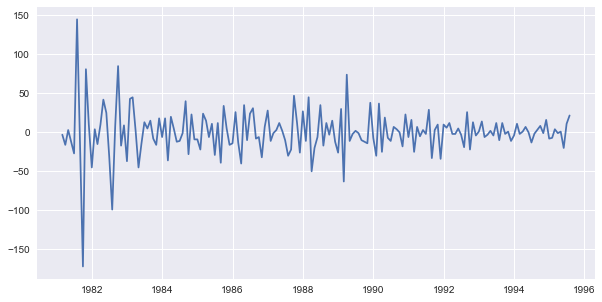

In [ ]:
plt.figure(figsize=(10,5))
plt.plot((df['Rose'].diff(12).dropna()).diff().dropna())

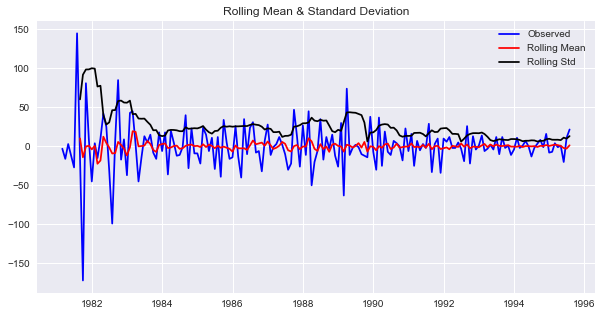

Results of Dickey-Fuller Test:
Test Statistic                  -4.605732
p-value                          0.000126
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [ ]:
plt.figure(figsize=(10,5))
test_stationarity((df['Rose'].diff(12).dropna()).diff().dropna(),'blue')

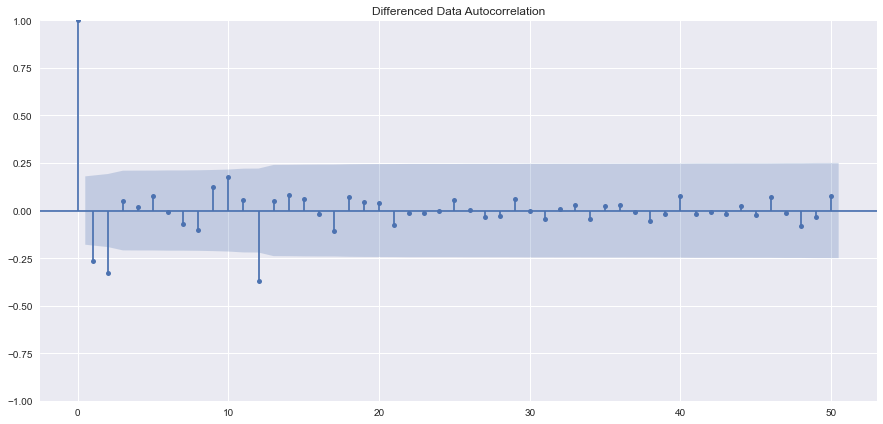

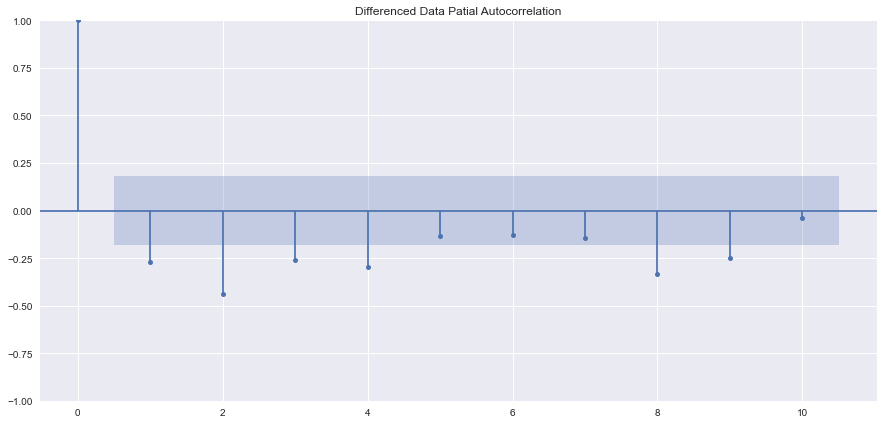

In [ ]:
plot_acf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=10,title='Differenced Data Patial Autocorrelation')
plt.show()

In [ ]:
manual_SARIMA_rose = sm.tsa.statespace.SARIMAX(train['Rose'].values,
                                order=(4, 1, 2),

                                seasonal_order=(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_rose = manual_SARIMA_rose.fit(maxiter=1000)
print(results_manual_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -384.369
Date:                            Sun, 06 Feb 2022   AIC                            786.737
Time:                                    00:13:37   BIC                            809.433
Sample:                                         0   HQIC                           795.898
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8967      0.132     -6.814      0.000      -1.155      -0.639
ar.L2          0.0165      0.171   

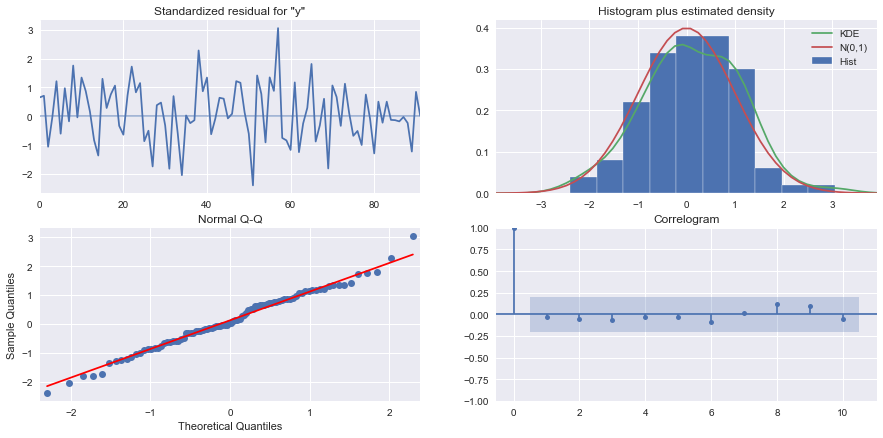

In [ ]:
results_manual_SARIMA_rose.plot_diagnostics()
plt.show()

In [ ]:
pred_dynamic = results_manual_SARIMA_rose.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_manual_SARIMA_rose = results_manual_SARIMA_rose.get_forecast(steps=len(test['Rose']), alpha=0.05)

In [ ]:
predicted_manual_SARIMA_rose.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,44.733041,15.552666,14.250375,75.215707
1,64.208694,16.000768,32.847765,95.569622
2,65.110689,16.074606,33.605040,96.616339
3,68.453063,16.150996,36.797692,100.108433
4,61.423433,16.154556,29.761085,93.085782


In [ ]:
rose_log_forecasted = pred_dynamic.predicted_mean
SARIMA_test['rose_manual_forecasted'] = predicted_manual_SARIMA_rose.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted,rose_log_auto_forecasted,rose_manual_forecasted
YearMonth,,,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137,53.448902,44.733041
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964,61.318892,64.208694
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091,66.136162,65.110689
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708,60.304767,68.453063
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645,64.819832,61.423433


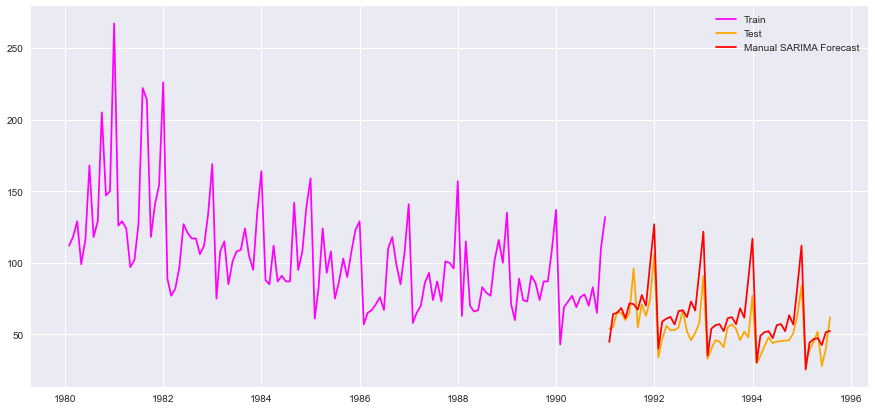

In [ ]:
plt.plot(train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')

plt.plot(SARIMA_test['rose_manual_forecasted'], color='red', label='Manual SARIMA Forecast')

plt.legend(loc='best')

In [ ]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_manual_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_manual_forecasted'])
print("For SARIMA forecast on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the Rose Testing Data:  RMSE is 15.377 and MAPE is 22.16


In [ ]:
resultsDf_8_rose3 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Manual SARIMA(4,1,2)x(0,1,1,12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose3])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


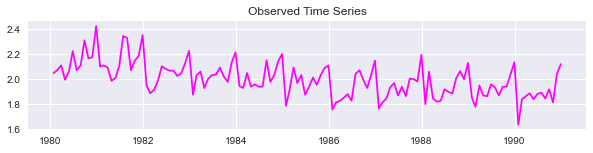

In [ ]:
plt.figure(figsize=(10,2))
plt.plot(rose_log_train, color='magenta')
plt.title ('Observed Time Series')

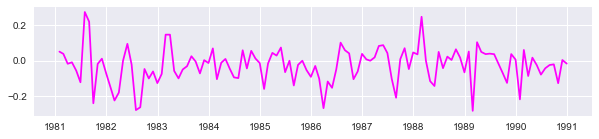

In [ ]:
plt.figure(figsize=(10,2))
plt.plot(rose_log_train.diff(12).dropna(), color='magenta')


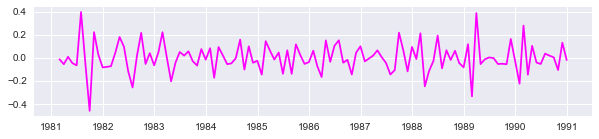

In [ ]:
plt.figure(figsize=(10,2))
plt.plot((rose_log_train.diff(12).dropna()).diff().dropna(), color='magenta')


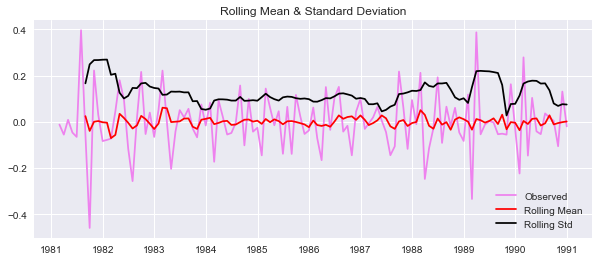

Results of Dickey-Fuller Test:
Test Statistic                  -3.910109
p-value                          0.001962
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64 



In [ ]:
plt.figure(figsize=(10,4))
test_stationarity((rose_log_train.diff(12).dropna()).diff().dropna(), 'violet')

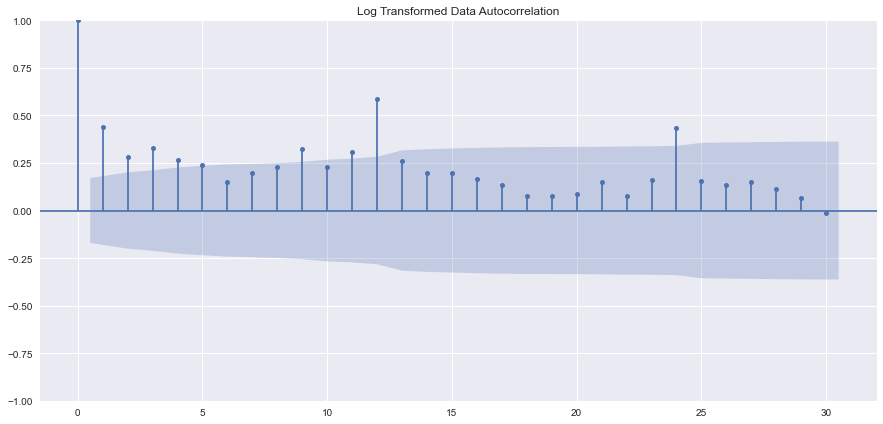

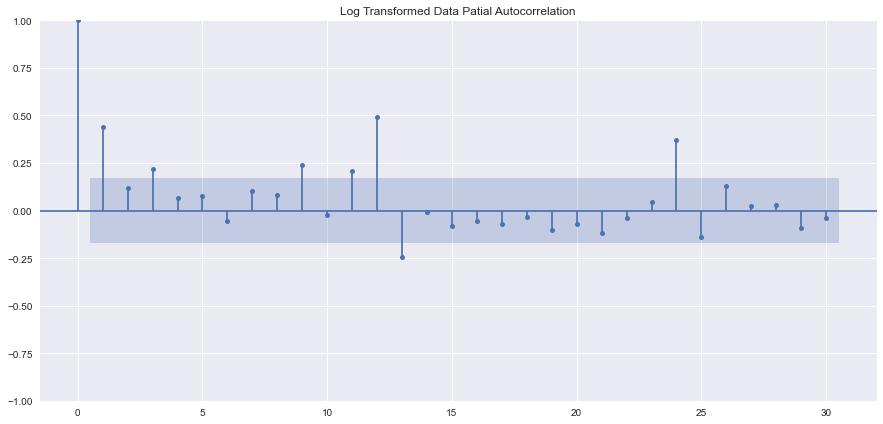

In [ ]:
plot_acf(rose_log_train,lags=30,title='Log Transformed Data Autocorrelation')
plot_pacf(rose_log_train,lags=30,title='Log Transformed Data Patial Autocorrelation')
plt.show()

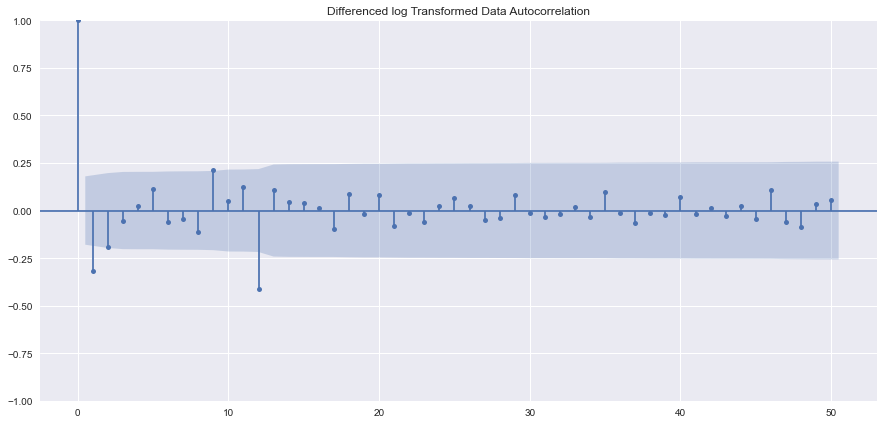

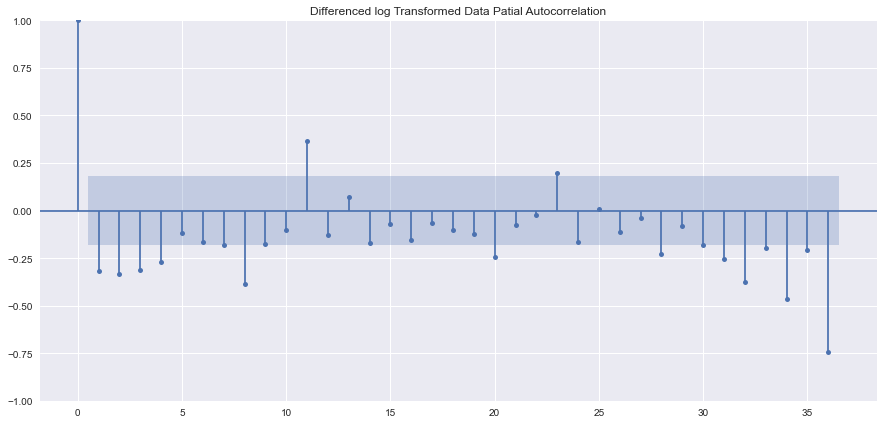

In [ ]:
plot_acf((rose_log_train.diff(12).dropna()).diff().dropna(),lags=50,title='Differenced log Transformed Data Autocorrelation')
plot_pacf((rose_log_train.diff(12).dropna()).diff().dropna(),lags=36,title='Differenced log Transformed Data Patial Autocorrelation')
plt.show()

In [ ]:
manual_SARIMA_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
                                order= (4, 1, 1),
                                seasonal_order= (0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_rose_log = manual_SARIMA_rose_log.fit(maxiter=1000)
print(results_manual_SARIMA_rose_log.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  132
Model:             SARIMAX(4, 1, 1)x(0, 1, 1, 12)   Log Likelihood                 128.764
Date:                            Sun, 06 Feb 2022   AIC                           -243.528
Time:                                    00:13:54   BIC                           -224.950
Sample:                                01-31-1980   HQIC                          -236.000
                                     - 12-31-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0019      0.118     -0.017      0.987      -0.232       0.229
ar.L2         -0.1547      0.126   

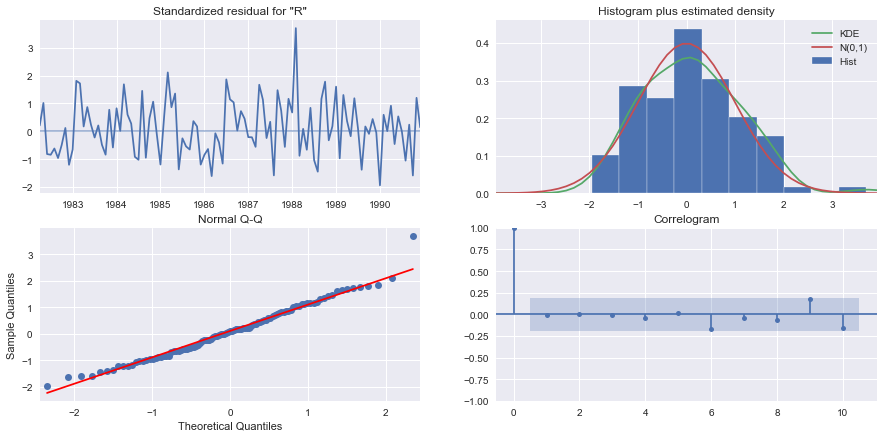

In [ ]:
results_manual_SARIMA_rose_log.plot_diagnostics()
plt.show()

In [ ]:
pred_dynamic = results_manual_SARIMA_rose_log.get_prediction(dynamic=True, full_results=True)

In [ ]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_manual_SARIMA_rose_log = results_manual_SARIMA_rose_log.get_forecast(steps=len(test['Rose']), alpha=0.1)

In [ ]:
predicted_manual_SARIMA_rose_log.summary_frame(alpha=0.05).head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,1.721121,0.067158,1.589494,1.852748
1991-02-28,1.789069,0.067954,1.655882,1.922256
1991-03-31,1.811243,0.067951,1.678061,1.944425
1991-04-30,1.786829,0.067974,1.653603,1.920055
1991-05-31,1.820831,0.067819,1.687908,1.953753


In [ ]:
SARIMA_test['rose_log_manual_forecasted'] = np.power(10,predicted_manual_SARIMA_rose_log.predicted_mean)
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,spark_log_forecasted,spark_manual_forecasted,rose_auto_forecasted,rose_log_auto_forecasted,rose_manual_forecasted,rose_log_manual_forecasted
YearMonth,,,,,,,,,
1991-01-31,1902,54.0,1430.791480,1629.418186,1579.910007,45.229137,53.448902,44.733041,52.616352
1991-02-28,2049,55.0,1540.574479,1384.532399,1419.154375,63.052964,61.318892,64.208694,61.527444
1991-03-31,1874,66.0,1707.861319,1804.202164,1868.144076,68.118091,66.136162,65.110689,64.750476
1991-04-30,1279,65.0,1859.150183,1685.500780,1731.472129,61.824708,60.304767,68.453063,61.210918
1991-05-31,1432,60.0,1501.984520,1569.595887,1659.822533,68.436645,64.819832,61.423433,66.195818


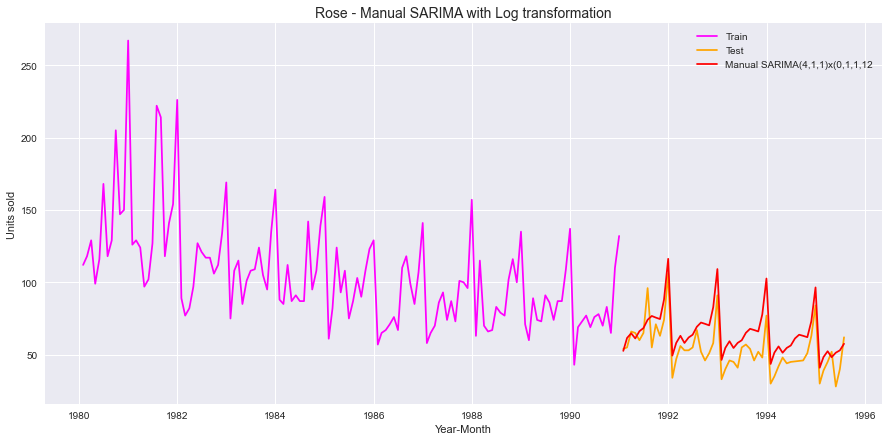

In [ ]:
plt.plot(train['Rose'], label='Train', color = 'magenta')
plt.plot(test['Rose'], label='Test', color = 'orange')

plt.plot(SARIMA_test['rose_log_manual_forecasted'], color='red', label='Manual SARIMA(4,1,1)x(0,1,1,12')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Manual SARIMA with Log transformation', fontsize=14)

plt.legend(loc='best')

In [ ]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_log_manual_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_log_manual_forecasted'])
print("For SARIMA forecast on the Rose Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the Rose Testing Data:  RMSE is 14.177 and MAPE is 23.10


#### Table with Test RMSE and MAPE

In [ ]:
resultsDf_8_rose4 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Manual SARIMA(4,1,1)x(0,1,1,12)-Log10'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose4])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


## Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

#### Sparkling Wine
##### Sorting the results from all the models

In [ ]:
spark_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.4, Beta 0.1, Gamma 0.2",311.981460,10.18
"Manual SARIMA(3,1,1)x(1,1,2,12)",324.106737,9.48
"Auto SARIMA(3,1,3)x(3,1,0,12)",331.586044,10.33
"Auto SARIMA(0,1,1)x(1,0,1,12)-Log10",336.795755,11.18
"TES Alpha 0.11, Beta 0.04, Gamma 0.036",402.938530,13.88
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
SimpleAverage,1275.081804,38.90
6 point TMA,1283.927428,43.86
SES Alpha 0.00,1316.035487,45.47


In [ ]:
spark_resultsDf.sort_values(by=['Test MAPE'])

,Test RMSE,Test MAPE
"Manual SARIMA(3,1,1)x(1,1,2,12)",324.106737,9.48
"TES Alpha 0.4, Beta 0.1, Gamma 0.2",311.981460,10.18
"Auto SARIMA(3,1,3)x(3,1,0,12)",331.586044,10.33
"Auto SARIMA(0,1,1)x(1,0,1,12)-Log10",336.795755,11.18
"TES Alpha 0.11, Beta 0.04, Gamma 0.036",402.938530,13.88
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
SimpleAverage,1275.081804,38.90
6 point TMA,1283.927428,43.86
SES Alpha 0.00,1316.035487,45.47


Text(0.5, 1.0, 'SPARKLING : Forecasts Vs Test Data')

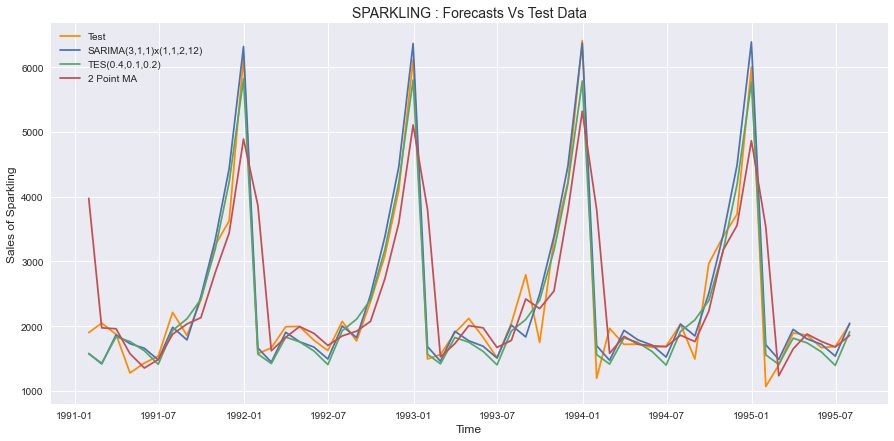

In [ ]:
plt.plot(TES_test['Sparkling'], label='Test', color = 'darkorange')
#SARIMA
plt.plot(SARIMA_test['spark_manual_forecasted'],  label='SARIMA(3,1,1)x(1,1,2,12)')
#TES
plt.plot(TES_test['predict_spark',0.4,0.1,0.2],  label='TES(0.4,0.1,0.2)')
#DES

#MA
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'],  label='2 Point MA')
plt.legend(loc='upper left')
plt.xlabel('Time',fontsize=12)
plt.ylabel('Sales of Sparkling',fontsize=12)
plt.title('SPARKLING : Forecasts Vs Test Data', fontsize=14)

#### Building model on all of the dataset using best model, which is TES

In [ ]:
model_TES_spark = ExponentialSmoothing(df['Sparkling'],trend='additive',seasonal='multiplicative',freq='M')
model_TES_spark_fit = model_TES_spark.fit(smoothing_level=0.4,smoothing_slope=0.1,smoothing_seasonal=0.2,optimized=True,use_brute=True)
TES_spark_forecast = model_TES_spark_fit.forecast(steps=12)

In [ ]:
rmse_spark_tes_full = metrics.mean_squared_error(df['Sparkling'],model_TES_spark_fit.fittedvalues,squared=False)
mape_spark_tes_full = MAPE(df['Sparkling'],model_TES_spark_fit.fittedvalues)
print("TES forecast on the Sparkling Full Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_tes_full, mape_spark_tes_full))

TES forecast on the Sparkling Full Data:  RMSE is 376.775 and MAPE is 11.29


Text(0.5, 1.0, 'SPARKLING : 12 Months Forecast using TES Model')

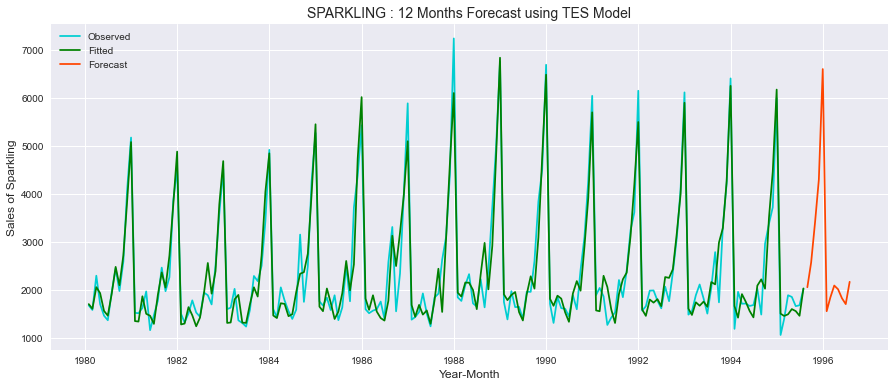

In [ ]:
plt.figure(figsize=(15,6))

plt.plot(df['Sparkling'], label='Observed', color = 'darkturquoise')
plt.plot(model_TES_spark_fit.fittedvalues, label='Fitted', color = 'green')
plt.plot(TES_spark_forecast, label='Forecast', color = 'orangered')
plt.legend(loc='upper left')
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales of Sparkling',fontsize=12)
plt.title('SPARKLING : 12 Months Forecast using TES Model', fontsize=14)

Text(0.5, 1.0, 'SPARKLING : 12 Months Forecast')

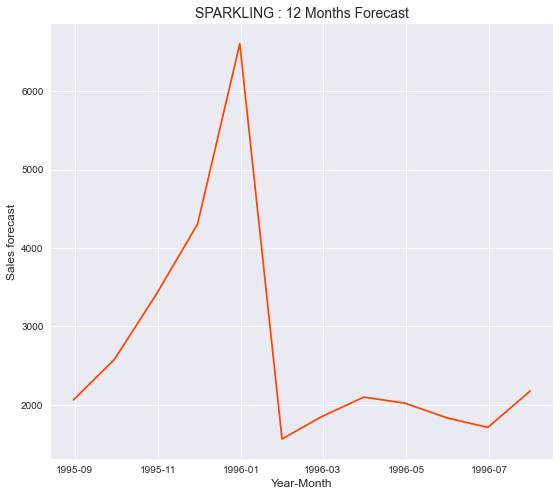

In [ ]:
plt.figure(figsize=(9,8))
plt.plot(TES_spark_forecast, label='Forecast', color = 'orangered')
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales forecast',fontsize=12)
plt.title('SPARKLING : 12 Months Forecast', fontsize=14)

#### Attempt SARIMA(3,1,1)x(1,1,2,12) for forecast

In [ ]:
spark_full_data_model = sm.tsa.statespace.SARIMAX(df['Sparkling'],
                                order=(3,1,3),
                                seasonal_order=(1, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_full_data_model_spark = spark_full_data_model.fit(maxiter=1000)
print(results_full_data_model_spark.summary())

                                        SARIMAX Results                                        
Dep. Variable:                               Sparkling   No. Observations:                  187
Model:             SARIMAX(3, 1, 3)x(1, 1, [1, 2], 12)   Log Likelihood               -1078.437
Date:                                 Sun, 06 Feb 2022   AIC                           2176.875
Time:                                         11:10:49   BIC                           2206.711
Sample:                                     01-31-1980   HQIC                          2188.998
                                          - 07-31-1995                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4230      0.086     -4.914      0.000      -0.592      -0

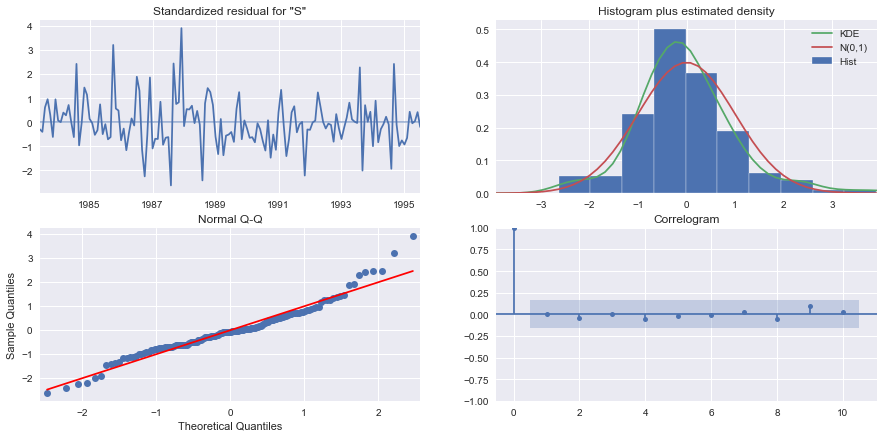

In [ ]:
rcParams['figure.figsize'] = 15,7
results_full_data_model_spark.plot_diagnostics()

In [ ]:
predicted_spark_SARIMA_full_data = results_full_data_model_spark.get_forecast(steps=12)

In [ ]:
predicted_spark_SARIMA_full_data.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,1873.386261,384.579457,1119.624376,2627.148146
1995-09-30,2444.939414,389.595143,1681.346965,3208.531863
1995-10-31,3312.598542,390.289899,2547.644396,4077.552688
1995-11-30,3994.605734,390.800156,3228.651503,4760.559964
1995-12-31,6084.081330,390.931195,5317.870268,6850.292392


In [ ]:
rmse_spark_sarima_full = metrics.mean_squared_error(df['Sparkling'],results_full_data_model_spark.fittedvalues,squared=False)
mape_spark_sarima_full = MAPE(df['Sparkling'],results_full_data_model_spark.fittedvalues)
print("For SARIMA forecast on the Sparkling Full Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_sarima_full, mape_spark_sarima_full))

For SARIMA forecast on the Sparkling Full Data:  RMSE is 591.255 and MAPE is 14.86


In [ ]:
df.tail()

,Sparkling,Rose
YearMonth,,
1995-03-31,1897,45.0
1995-04-30,1862,52.0
1995-05-31,1670,28.0
1995-06-30,1688,40.0
1995-07-31,2031,62.0


In [ ]:
pred_full_manual_SARIMA_date = predicted_spark_SARIMA_full_data.summary_frame(alpha=0.05).set_index(pd.date_range(start='1995-08-31',end='1996-7-31', freq='M'))

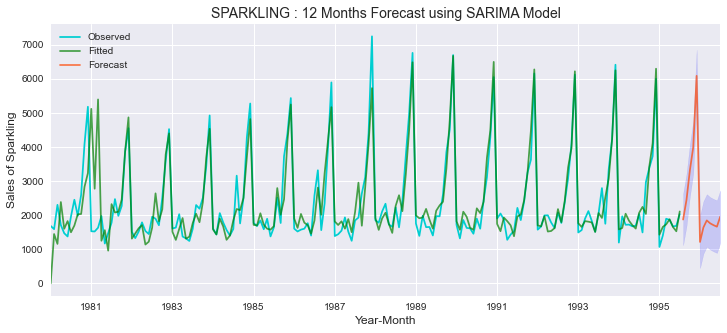

In [ ]:
plt.figure(figsize=(12,5))

axis = df['Sparkling'].plot(label='Observed', color = 'darkturquoise')
results_full_data_model_spark.fittedvalues.plot(ax=axis, label='Fitted', alpha=0.7, color = 'green')
pred_full_manual_SARIMA_date['mean'].plot(ax=axis, label='Forecast', alpha=0.7, color = 'orangered')
axis.fill_between(pred_full_manual_SARIMA_date.index, pred_full_manual_SARIMA_date['mean_ci_lower'],
                  pred_full_manual_SARIMA_date['mean_ci_upper'], color='blue', alpha=.15)
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales of Sparkling',fontsize=12)
plt.title('SPARKLING : 12 Months Forecast using SARIMA Model', fontsize=14)

plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'SPARKLING : 12 Months Forecast')

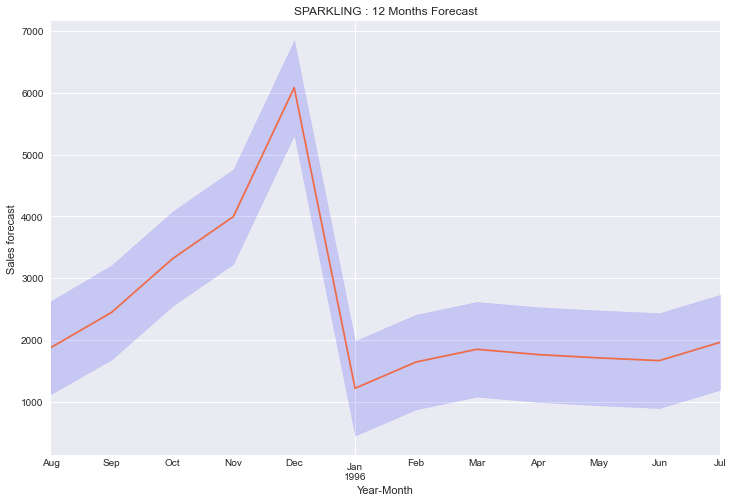

In [ ]:
plt.figure(figsize=(12,8))
axis = pred_full_manual_SARIMA_date['mean'].plot( alpha=0.7, color = 'orangered')
axis.fill_between(pred_full_manual_SARIMA_date.index, pred_full_manual_SARIMA_date['mean_ci_lower'],
                  pred_full_manual_SARIMA_date['mean_ci_upper'], color='blue', alpha=.15)
plt.xlabel('Year-Month')
plt.ylabel('Sales forecast')
plt.title('SPARKLING : 12 Months Forecast', fontsize=12)

In [ ]:
forecast = pd.DataFrame({'Sparkling':np.round(pred_full_manual_SARIMA_date['mean'],2)})
forecast

,Sparkling
1995-08-31,1873.39
1995-09-30,2444.94
1995-10-31,3312.60
1995-11-30,3994.61
1995-12-31,6084.08
1996-01-31,1215.91
1996-02-29,1640.57
1996-03-31,1847.28
1996-04-30,1761.99
1996-05-31,1708.30


In [ ]:
np.sum(forecast['Sparkling'])

29508.97

In [ ]:
forecast.describe()

,Sparkling
count,12.000000
mean,2459.080833
std,1384.638657
min,1215.910000
25%,1697.230000
50%,1860.335000
75%,2661.855000
max,6084.080000


#### For Rose Wine

In [ ]:
rose_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.1, Beta 0.2, Gamma 0.1",9.493832,13.68
2 point TMA,11.529278,13.54
"Auto SARIMA(1,0,0)x(1,0,1,12)-Log10",13.590795,21.92
"Manual SARIMA(4,1,1)x(0,1,1,12)-Log10",14.177101,23.10
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
Regression On Time,15.268885,22.82
"Manual SARIMA(4,1,2)x(0,1,1,12)",15.377144,22.16
"DES Alpha 0.017, Beta 3.23",15.706968,24.12


In [ ]:
rose_resultsDf.sort_values(by=['Test MAPE'])

,Test RMSE,Test MAPE
2 point TMA,11.529278,13.54
"TES Alpha 0.1, Beta 0.2, Gamma 0.1",9.493832,13.68
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
"Auto SARIMA(1,0,0)x(1,0,1,12)-Log10",13.590795,21.92
"Manual SARIMA(4,1,2)x(0,1,1,12)",15.377144,22.16
Regression On Time,15.268885,22.82
"Manual SARIMA(4,1,1)x(0,1,1,12)-Log10",14.177101,23.10
"DES Alpha 0.017, Beta 3.23",15.706968,24.12


Text(0.5, 1.0, 'ROSE : Forecast Vs Test Data')

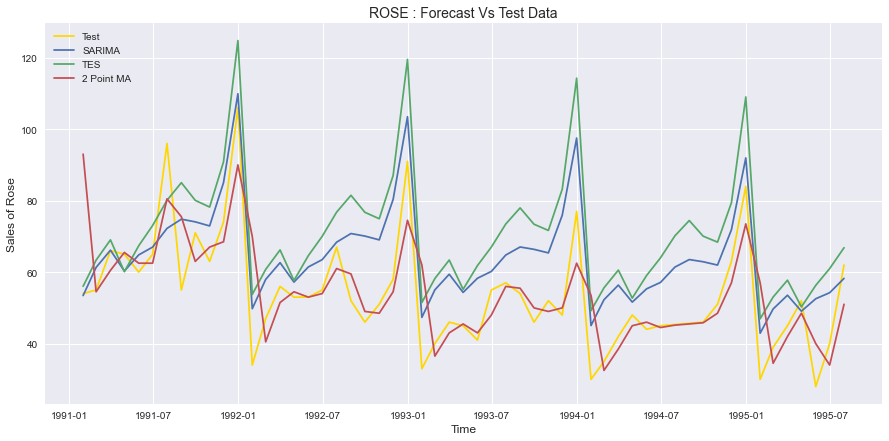

In [ ]:

plt.plot(TES_test['Rose'], label='Test', color = 'gold')

#SARIMA
plt.plot(SARIMA_test['rose_log_auto_forecasted'],  label='SARIMA')
#TES
plt.plot(TES_test['predict_rose',alpha_7_2,beta_7_2,gamma_7_2],  label='TES')
#DES

#SES

#MA
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'],  label='2 Point MA')
plt.legend(loc='upper left')
plt.xlabel('Time',fontsize=12)
plt.ylabel('Sales of Rose',fontsize=12)
plt.title('ROSE : Forecast Vs Test Data', fontsize=14)

#### Building TES Model on Rose full data

In [ ]:
model_TES_rose = ExponentialSmoothing(df['Rose'],trend='additive',seasonal='multiplicative',freq='M')
model_TES_rose_fit = model_TES_rose.fit(smoothing_level=0.1,smoothing_slope=0.2,smoothing_seasonal=0.2,optimized=True,use_brute=True)
TES_rose_forecast = model_TES_rose_fit.forecast(steps=12)

In [ ]:
rmse_rose_tes_full = metrics.mean_squared_error(df['Rose'],model_TES_rose_fit.fittedvalues,squared=False)
mape_rose_tes_full = MAPE(df['Rose'],model_TES_rose_fit.fittedvalues)
print("TES forecast on the Rose Full Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_tes_full, mape_rose_tes_full))

TES forecast on the Rose Full Data:  RMSE is 17.404 and MAPE is 13.87


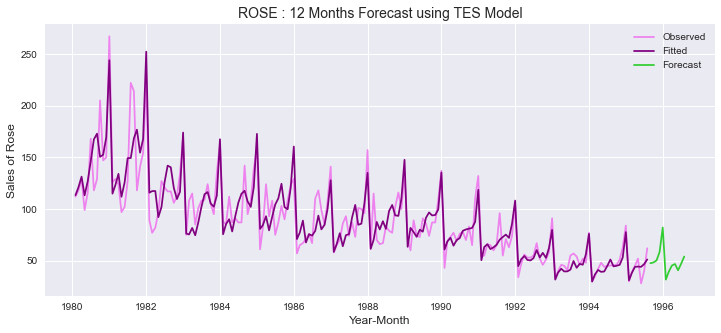

In [ ]:
plt.figure(figsize=(12,5))

plt.plot(df['Rose'], label='Observed', color = 'violet')
plt.plot(model_TES_rose_fit.fittedvalues, label='Fitted', color = 'purple')
plt.plot(TES_rose_forecast, label='Forecast', color = 'limegreen')

plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales of Rose',fontsize=12)
plt.title('ROSE : 12 Months Forecast using TES Model', fontsize=14)

plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'ROSE : 12 Months Forecast')

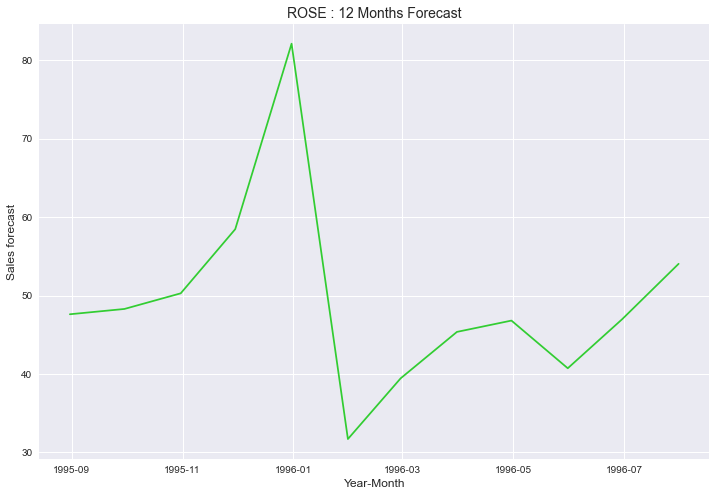

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(TES_rose_forecast, label='Forecast', color = 'limegreen')
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales forecast',fontsize=12)
plt.title('ROSE : 12 Months Forecast', fontsize=14)

#### Try SARIMAX

In [ ]:
rose_log_trans = np.log10(df['Rose'])

In [ ]:
rose_full_data_model = sm.tsa.statespace.SARIMAX(df['Rose'],
                                order= (4,1,1),
                                seasonal_order= (0,1,1,12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_full_data_model_rose = rose_full_data_model.fit(maxiter=1000)
print(results_full_data_model_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  187
Model:             SARIMAX(4, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -664.135
Date:                            Sun, 06 Feb 2022   AIC                           1342.270
Time:                                    11:36:33   BIC                           1363.796
Sample:                                01-31-1980   HQIC                          1351.011
                                     - 07-31-1995                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0914      0.084      1.093      0.274      -0.072       0.255
ar.L2         -0.1077      0.077   

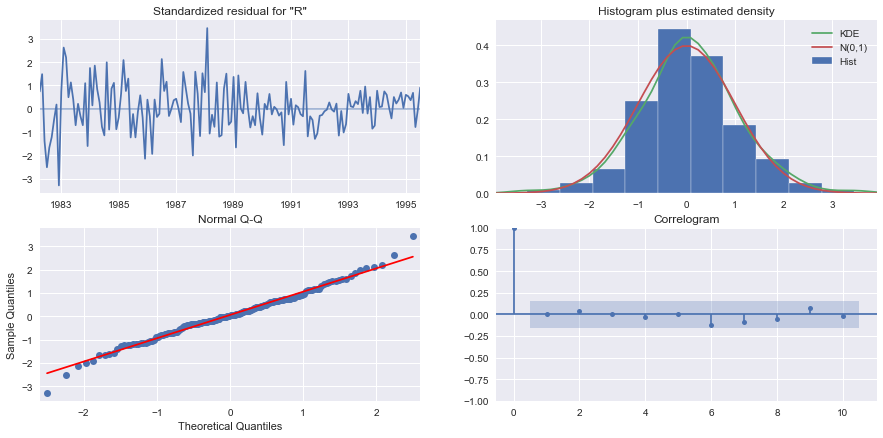

In [ ]:
results_full_data_model_rose.plot_diagnostics()

In [ ]:
predicted_rose_SARIMA_full_data = results_full_data_model_rose.get_forecast(steps=12)
predicted_rose_SARIMA_full_data.summary_frame(alpha=0.05).head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,46.540808,15.245486,16.660205,76.421412
1995-09-30,45.514601,15.769108,14.607718,76.421484
1995-10-31,46.226234,15.827871,15.204176,77.248292
1995-11-30,54.319829,15.831176,23.291295,85.348363
1995-12-31,82.214864,15.835193,51.178455,113.251272


In [ ]:

rmse_rose_sarima_full = metrics.mean_squared_error(df['Rose'],results_full_data_model_rose.fittedvalues,squared=False)
mape_rose_sarima_full = MAPE(df['Rose'],results_full_data_model_rose.fittedvalues)

print("For SARIMA forecast on the Rose Full Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_sarima_full, mape_rose_sarima_full))

For SARIMA forecast on the Rose Full Data:  RMSE is 30.676 and MAPE is 19.40


In [ ]:
pred_full_manual_SARIMA_date = predicted_rose_SARIMA_full_data.summary_frame(alpha=0.05).set_index(pd.date_range(start='1995-08-31',end='1996-7-31', freq='M'))

In [ ]:
results_full_data_model_rose.fittedvalues.head()

YearMonth
1980-01-31      0.000000
1980-02-29    115.410430
1980-03-31    114.398802
1980-04-30    123.947737
1980-05-31     92.219740
dtype: float64

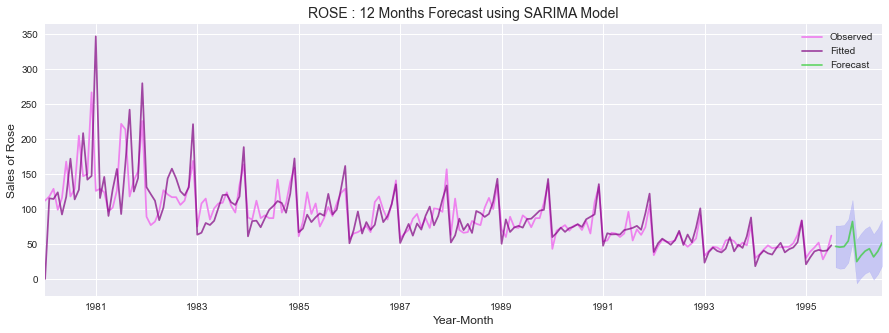

In [ ]:
plt.figure(figsize=(15,5))

axis = df['Rose'].plot(label='Observed', color = 'violet')
results_full_data_model_rose.fittedvalues.plot(label='Fitted', alpha=0.7, color = 'purple')
pred_full_manual_SARIMA_date['mean'].plot(ax=axis, label='Forecast', alpha=0.7, color = 'limegreen')

axis.fill_between(pred_full_manual_SARIMA_date.index, pred_full_manual_SARIMA_date['mean_ci_lower'],
                  pred_full_manual_SARIMA_date['mean_ci_upper'], color='blue', alpha=.15)
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales of Rose',fontsize=12)
plt.title('ROSE : 12 Months Forecast using SARIMA Model', fontsize=14)

plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'ROSE : 12 Months Forecast')

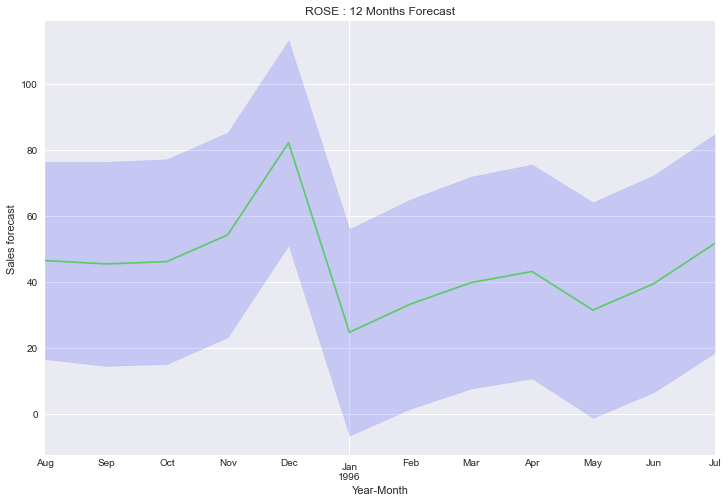

In [ ]:
plt.figure(figsize=(12,8))
axis = pred_full_manual_SARIMA_date['mean'].plot( alpha=0.7, color = 'limegreen')
axis.fill_between(pred_full_manual_SARIMA_date.index, pred_full_manual_SARIMA_date['mean_ci_lower'],
                  pred_full_manual_SARIMA_date['mean_ci_upper'], color='blue', alpha=.15)
plt.xlabel('Year-Month')
plt.ylabel('Sales forecast')
plt.title('ROSE : 12 Months Forecast', fontsize=12)

In [ ]:
forecast2 = pd.DataFrame({'ROSE':np.round(pred_full_manual_SARIMA_date['mean'],2)})
forecast2

,ROSE
1995-08-31,46.54
1995-09-30,45.51
1995-10-31,46.23
1995-11-30,54.32
1995-12-31,82.21
1996-01-31,24.81
1996-02-29,33.35
1996-03-31,39.87
1996-04-30,43.23
1996-05-31,31.53


In [ ]:
forecast2.describe()

,ROSE
count,12.000000
mean,44.905000
std,14.473222
min,24.810000
25%,38.007500
50%,44.370000
75%,47.830000
max,82.210000


In [ ]:
forecast2.sum()

ROSE    538.86
dtype: float64